In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import pysynphot as S
from scipy.interpolate import interp1d
from scipy import integrate
from astropy.io import fits
#import quadpy

# allow interactive plots
#%matplotlib widget

In [2]:
S.refs.showref()

graphtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/57g1733im_tmg.fits
 comptable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/5as18041m_tmc.fits
thermtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/3241637sm_tmt.fits
      area: 45238.93416
   waveset: Min: 500, Max: 26000, Num: 10000, Delta: None, Log: True


In [3]:
WLMIN=3400. # Minimum wavelength : PySynPhot works with Angstrom
WLMAX=10600. # Minimum wavelength : PySynPhot works with Angstrom

NBINS=int(WLMAX-WLMIN) # Number of bins between WLMIN and WLMAX
BinWidth=(WLMAX-WLMIN)/float(NBINS) # Bin width in Angstrom
WL=np.linspace(WLMIN,WLMAX,NBINS)   # Array of wavelength in Angstrom
# from key numbers
Reff=642.3/2. # effective radius in cm
Seff= np.pi*Reff**2  # in cm2
print(Seff)
exptime=30.0

324015.4546769212


In [4]:
S.refs.setref(area=Seff, waveset=None) # set by default to 6.4230 m effective aperture 
S.refs.set_default_waveset(minwave=WLMIN, maxwave=WLMAX, num=NBINS, delta=BinWidth, log=False)
S.refs.showref()

graphtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/57g1733im_tmg.fits
 comptable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/5as18041m_tmc.fits
thermtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/3241637sm_tmt.fits
      area: 324015.4546769212
   waveset: Min: 3400.0, Max: 10600.0, Num: None, Delta: 1.0, Log: False


# Define general paths 

In [5]:
outdir_plots0 = 'output_plots/'
if os.path.exists(outdir_plots0)==False:
    os.mkdir(outdir_plots0)
outdir_files = 'output_files/'
if os.path.exists(outdir_files)==False:
    os.mkdir(outdir_files)

# Define paths to spectral atlases 

In [6]:
pysynphot_root_path=os.environ['PYSYN_CDBS']
path_dict = {
    'calspec':os.path.join(pysynphot_root_path,'calspec'),
    'bpgs':os.path.join(pysynphot_root_path,'grid/bpgs'),
    'jacoby':os.path.join(pysynphot_root_path,'grid/jacobi'),
    'pickles':os.path.join(pysynphot_root_path,'grid/pickles/dat_uvk')
}

atlas_dir = 'spectral_atlases/'
file_dict = {
    'calspec':'',
    'bpgs':os.path.join(atlas_dir,'atlas_bpgs.txt'),
    'jacoby':os.path.join(atlas_dir,'atlas_jacoby.txt'),
    'pickles':os.path.join(atlas_dir,'atlas_pickles.txt')
}


Define also the spectral types 

In [7]:
spectral_types = ['O','B','A','F','G','K','M']

# Select a spectral atlas 

<img align="center" src = Stellar_Classification_Chart.png width=750 style="padding: 10px"> 

https://upload.wikimedia.org/wikipedia/commons/3/37/Stellar_Classification_Chart.png

Options: 
* calspec (HST calibration spectra): work in progress, need to separate stars from AGNs and other sources 
* bpgs (Bruzual-Persson-Gunn-Stryker): 175 spectra 
* jacobi (Jacoby-Hunter-Christian): 161 spectra 
* pickles (Pickles): 131 spectra 

In [8]:
atlas_name = 'pickles'

atlas_path = path_dict[atlas_name]
atlas_file = file_dict[atlas_name]

# Find the spectra files and information 

In [9]:
#path_sed_calspec=os.path.join(pysynphot_root_path,'calspec')
atlas_seds = pd.read_csv(atlas_file)
atlas_seds

,File,Type,Teff,Name
0,pickles_uk_1.fits,O5V,39810.70,unknown
1,pickles_uk_2.fits,O9V,35481.40,unknown
2,pickles_uk_3.fits,B0V,28183.80,unknown
3,pickles_uk_4.fits,B1V,22387.20,unknown
4,pickles_uk_5.fits,B3V,19054.60,unknown
...,...,...,...,...
126,pickles_uk_127.fits,G8I,4591.98,unknown
127,pickles_uk_128.fits,K2I,4255.98,unknown
128,pickles_uk_129.fits,K3I,NaN,unknown
129,pickles_uk_130.fits,K4I,3990.25,unknown


# Load with pysynphot the spectra from the selected atlas 

In [10]:
sed_list = np.array(atlas_seds['File'])

In [11]:
sed_dict = {}
type_dict = {}
for i,sed in enumerate(sed_list):
    #print('-------')
    #print(sed)
    spec_ = S.FileSpectrum(os.path.join(atlas_path,sed))
    sed_dict[sed[:-5]] = spec_
    type_dict[sed[:-5]] = atlas_seds['Type'][i]

Check the spectra were correctly loaded 

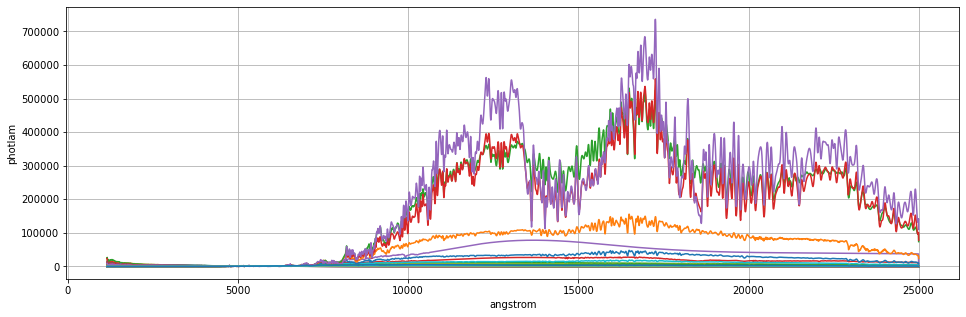

In [12]:
fig=plt.figure(figsize=(16,5))
for sed_ in sed_dict.keys():
    spec = sed_dict[sed_]
    spec.convert('photlam')
    plt.plot(spec.wave,spec.flux)
    plt.xlabel(spec.waveunits)
    plt.ylabel(spec.fluxunits)
    #plt.xlim((0,10000))
    plt.grid()


Let's organise spectra by spectral type 

In [13]:
spec_by_type = {}
for i in range(len(spectral_types)):
    spec_type = spectral_types[i]
    
    type_list_ = []
    spec_by_type[spec_type] = []
    for sed_ in type_dict.keys():
        if spec_type in type_dict[sed_]:
            type_list_.append(type_dict[sed_])
            spec_by_type[spec_type].append(sed_dict[sed_])
    print(spec_type, type_list_)
    print(len(type_list_))
    print('-----------')

O ['O5V', 'O9V', 'O8III']
3
-----------
B ['B0V', 'B1V', 'B3V', 'B57V', 'B8V', 'B9V', 'B2IV', 'B6IV', 'B12III', 'B3III', 'B5III', 'B9III', 'B2II', 'B5II', 'B0I', 'B1I', 'B3I', 'B5I', 'B8I']
19
-----------
A ['A0V', 'A2V', 'A3V', 'A5V', 'A7V', 'A0IV', 'A47IV', 'A0III', 'A3III', 'A5III', 'A7III', 'A0I', 'A2I']
13
-----------
F ['F0V', 'F2V', 'F5V', 'wF5V', 'F6V', 'rF6V', 'F8V', 'wF8V', 'rF8V', 'F02IV', 'F5IV', 'F8IV', 'F0III', 'F2III', 'F5III', 'F0II', 'F2II', 'F0I', 'F5I', 'F8I']
20
-----------
G ['G0V', 'wG0V', 'rG0V', 'G2V', 'G5V', 'wG5V', 'rG5V', 'G8V', 'G0IV', 'G2IV', 'G5IV', 'G8IV', 'G0III', 'G5III', 'wG5III', 'rG5III', 'G8III', 'wG8III', 'G5II', 'G0I', 'G2I', 'G5I', 'G8I']
23
-----------
K ['K0V', 'rK0V', 'K2V', 'K3V', 'K4V', 'K5V', 'K7V', 'K0IV', 'K1IV', 'K3IV', 'K0III', 'wK0III', 'rK0III', 'K1III', 'wK1III', 'rK1III', 'K2III', 'wK2III', 'rK2III', 'K3III', 'wK3III', 'rK3III', 'K4III', 'wK4III', 'rK4III', 'K5III', 'rK5III', 'K01II', 'K34II', 'K2I', 'K3I', 'K4I']
32
-----------
M [

Now we can plot them by spectral type separately 

In [14]:
type_colors = {'O':'b','B':'dodgerblue','A':'cyan','F':'g','G':'gold','K':'r','M':'brown'}

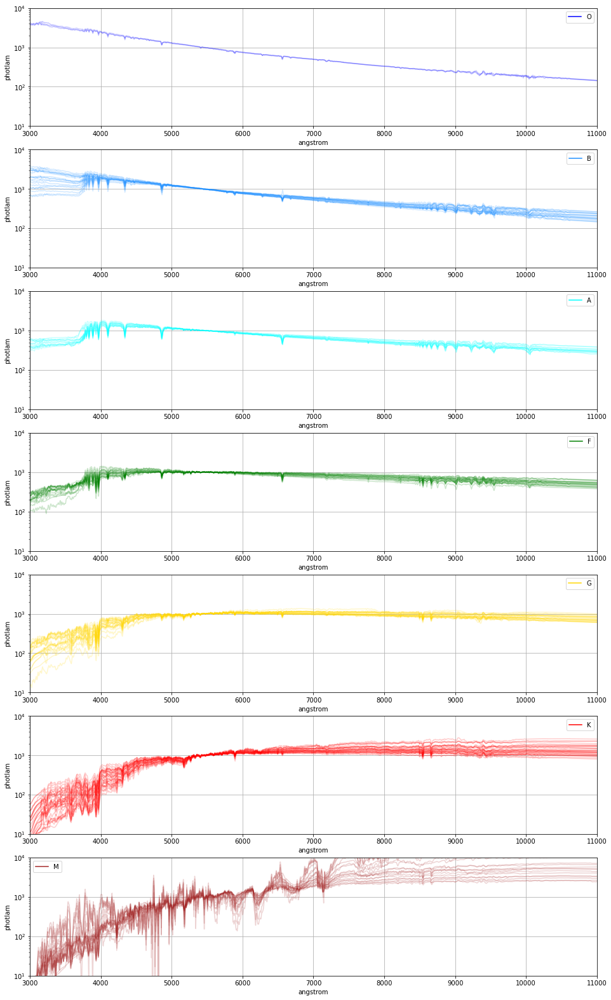

In [15]:
num_rows = len(spectral_types)
fig, axs = plt.subplots(num_rows, 1, figsize=(16,28))

for row,st in enumerate(spectral_types):
    for spec in spec_by_type[st]:
        axs[row].plot(spec.wave,spec.flux,color=type_colors[st],alpha=0.2)
    axs[row].plot([],[],label=st,color=type_colors[st])
    axs[row].grid()
    #axs[row].set_yscale("log")
    axs[row].set_xlabel(spec.waveunits)
    axs[row].set_ylabel(spec.fluxunits)
    axs[row].legend()
    axs[row].set_xlim(3000,11000)
    axs[row].set_ylim(10,10000)
    axs[row].set_yscale("log")
            

# Load LSST transmissions file 

In [16]:
datafilename = "data/lsst/old/transmissions-LSST.dat"
df=pd.read_csv(datafilename,names=['wl','Topt','Tccd','U','G','R','I','Z','Y4','atm'],sep='\t')

In [17]:
wl=df['wl'].values
U=df['U'].values/100.
G=df['G'].values/100.
R=df['R'].values/100.
I=df['I'].values/100.
Z=df['Z'].values/100.
Y4=df['Y4'].values/100.

lsst_bp = []
lsst_bp.append(S.ArrayBandpass(wl*10, U , name="u"))
lsst_bp.append(S.ArrayBandpass(wl*10, G , name="g"))
lsst_bp.append(S.ArrayBandpass(wl*10, R , name="r"))
lsst_bp.append(S.ArrayBandpass(wl*10, I , name="i"))
lsst_bp.append(S.ArrayBandpass(wl*10, Z , name="z"))
lsst_bp.append(S.ArrayBandpass(wl*10, Y4 , name="Y"))

In [18]:
filters = ['u','g','r','i','z','Y']
filter_names = {0:'u',1:'g',2:'r',3:'i',4:'z',5:'Y'}
filter_colors = {0:'b',1:'g',2:'r',3:'orange',4:'k',5:'grey'}

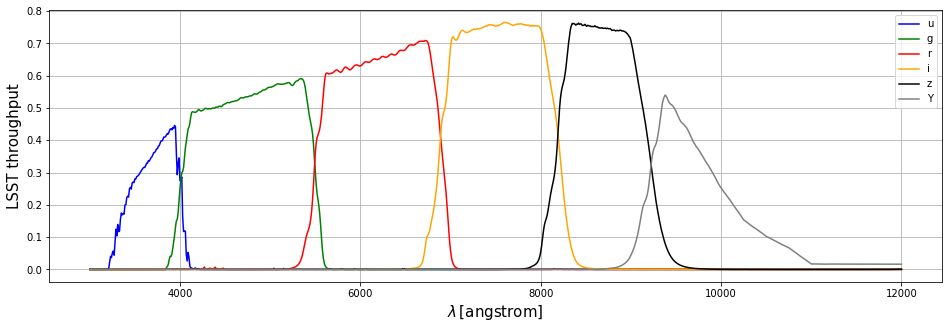

In [19]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for index in range(len(lsst_bp)):
    ax.plot(lsst_bp[index].wave,lsst_bp[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
plt.xlabel('$\\lambda \, [$'+str(lsst_bp[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()

We find a leakage at higher wavelengths for some filters that impacts the colour values of the M type stars 

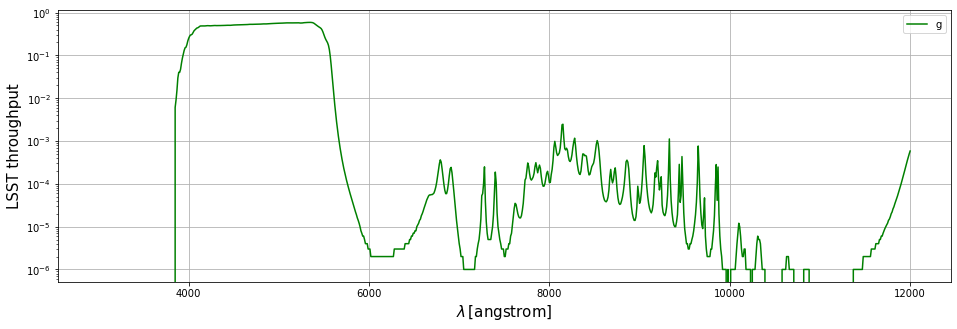

In [20]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
index=1
ax.plot(lsst_bp[index].wave,lsst_bp[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
ax.set_yscale("log")
plt.xlabel('$\\lambda \, [$'+str(lsst_bp[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()

Let's try with a more updated version of the throughputs. We are given only the total passband and the atmosphere that was used to generate them (https://github.com/lsst/throughputs/tree/main/baseline), so in order to have the throughputs we need to divide the passbands by this atmosphere 

In [21]:
total_passband_path = 'data/lsst/'
total_passband_label = 'total_{0}.dat'
atm_lsst_file = 'atmos_std.dat'

In [22]:
atm_lsst = np.loadtxt(total_passband_path+atm_lsst_file)

Now, we write the passbands in pysynphot format: 

In [23]:
wl = atm_lsst[:,0]*10.

lsst_bp_ = []
for f in filters:
    passband_ = np.loadtxt(total_passband_path+total_passband_label.format(f.lower()))
    assert (atm_lsst.shape==passband_.shape)
    throughput_ = passband_[:,1]/atm_lsst[:,1]
    lsst_bp_.append(S.ArrayBandpass(wl, throughput_ , name=f))



/tmp/ipykernel_251132/740900064.py:7: RuntimeWarning: invalid value encountered in true_divide
  throughput_ = passband_[:,1]/atm_lsst[:,1]


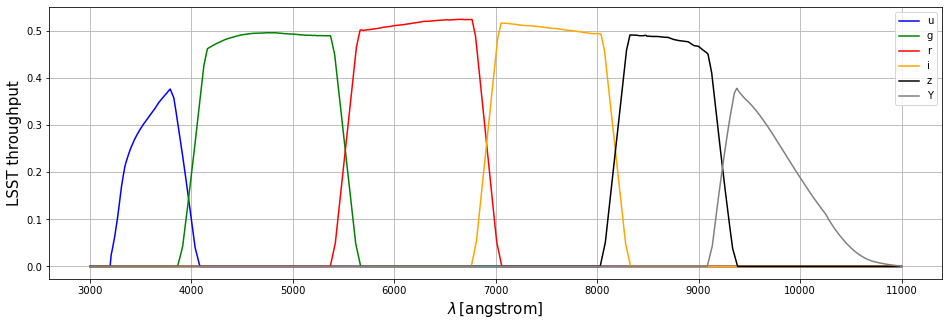

In [24]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for index in range(len(lsst_bp)):
    ax.plot(lsst_bp_[index].wave,lsst_bp_[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
plt.xlabel('$\\lambda \, [$'+str(lsst_bp_[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()
plt.savefig(os.path.join(outdir_plots0,'LSST_throughputs.png'))

In [25]:
for filter in lsst_bp_:
    assert (filter.wave==lsst_bp_[0].wave).all()

# Compare with hardware.dat 

In [26]:
throughput_path = 'data/lsst/'
throughput_label = 'hardware_{0}.dat'

Write the throughputs in pysynphot format 

In [27]:
lsst_bp = []
for f in filters:
    throughput_ = np.loadtxt(throughput_path+throughput_label.format(f.lower()))
    assert (atm_lsst.shape==throughput_.shape)
    lsst_bp.append(S.ArrayBandpass(wl, throughput_[:,1] , name=f))


We compare with the results from dividing the total passbands by the atmosphere: 

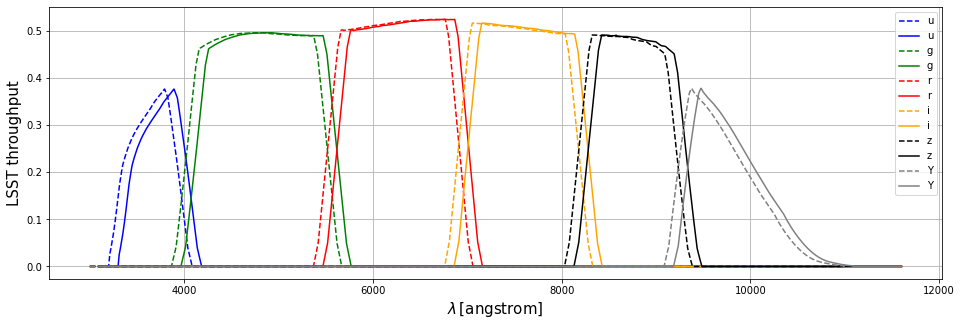

In [28]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for index in range(len(lsst_bp)):
    ax.plot(lsst_bp_[index].wave,lsst_bp_[index].throughput,label=filter_names[index],ls='--',color=filter_colors[index])
    ax.plot(lsst_bp[index].wave+100,lsst_bp[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
plt.xlabel('$\\lambda \, [$'+str(lsst_bp[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()
#plt.savefig(os.path.join(outdir_plots0,'LSST_throughputs.png'))

We confirm that they are the same, so we adopt the throughputs from the "hardware.dat" files 

In [29]:
for filter in lsst_bp:
    assert (filter.wave==lsst_bp[0].wave).all()

In [30]:
wl_lsst = lsst_bp[0].wave

# Load simulated transparencies 

Select variable parameter and specify airmass and clouds 

In [31]:
variable_param = 'pwv'
am0 = 1.2
cloud0 = 0.0

Specify which distribution follows the simulated parameter. Options: 
* linear_distribution-discrete: generated following a linear function and with pre-established step (e.g., PWV = 1.0, 2.0, 3.0, ....) 
* linear_distribution-continuous: generated following a linear function and specifying only the value range and number of simulations (e.g., PWV = 1.0, 1.25, 1.5, ....) 
* uniform_distribution: generated following a uniform random distribution (work in progress) 
* specific_distribution: generated following random distributions specific to each parameter (work in progress) 


In [32]:
param_dist = 'linear_distribution-discrete'

In [33]:
outdir_plots = os.path.join('output_plots/',param_dist.replace('-','/'))
if os.path.exists(outdir_plots)==False:
    os.mkdir(outdir_plots)

In [34]:
if variable_param=='airmass' or variable_param=='cloud':
    t_file = 'simulated_transparencies_varying_{0}.fits'.format(variable_param)
    t_file_ref = 'simulated_transparencies_varying_{0}_ref.fits'.format(variable_param)
else:
    t_file = 'simulated_transparencies_varying_{0}_airmass_{1}_cloud_{2}.fits'.format(variable_param,am0,cloud0)
    t_file_ref = 'simulated_transparencies_varying_{0}_airmass_{1}_cloud_{2}_ref.fits'.format(variable_param,am0,cloud0)

t_path = os.path.join('./simulated_transparencies/',param_dist.replace('-','/'))
t_in = os.path.join(t_path,t_file)
t_in_ref = os.path.join(t_path,t_file_ref)
t = fits.open(t_in)
t_ref = fits.open(t_in_ref)

In [35]:
head = t[0].header
data = t[0].data
print(data.shape)
data_ref = t_ref[0].data
print(data_ref.shape)

(10, 956)
(2, 956)


In [36]:
n_atmp = head['ID_RES']
n_sim = head['NTRANSP']
print(n_atmp, n_sim)

5 9


In [37]:
wl_t = data[0][n_atmp:]*10.

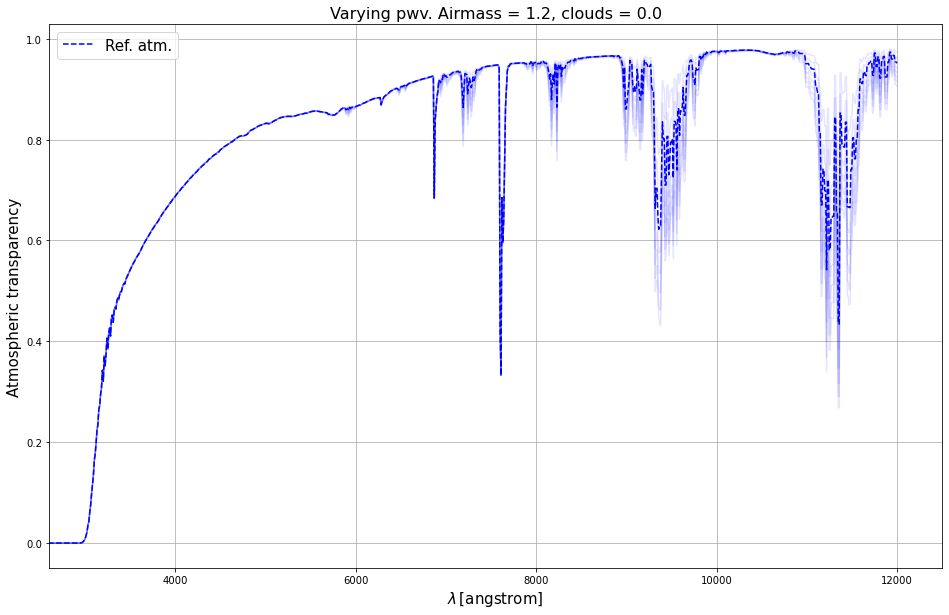

In [38]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
for atm_i in range(1,n_sim):
    ax.plot(wl_t,data[atm_i][n_atmp:],color='b',alpha=0.1)
ax.plot(wl_t,data_ref[1][n_atmp:],ls='--',color='b',label='Ref. atm.')
plt.xlim(2600.,12500.)
plt.grid()
plt.xlabel('$\\lambda \,$'+'[angstrom]',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.legend(fontsize=15)
plt.savefig(os.path.join(outdir_plots,'atm_transparencies_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

# Check range of simulated atm values

In [39]:
print(head)

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  956                                                  NAXIS2  =                   10                                                  NTRANSP =                    9                                                  ID_AM   =                    4                                                  ID_VAOD =                    1                                                  ID_PWV  =                    0                                                  ID_O3   =                    2                                                  ID_CLD  =                    3                                                  ID_RES  =                    5                                                  END                                     

In [40]:
params_index = {'pwv':0,'aerosol':1,'ozone':2,'cloud':3,'airmass':4}

In [41]:
var_index = params_index[variable_param]

In [42]:
#data[1:,1]
data[1:,var_index]

array([1., 2., 3., 4., 5., 6., 7., 8., 9.])

(array([0., 0., 0., 0., 0., 0., 9., 0., 0., 0., 0., 0.]),
 array([-0.5       , -0.41666667, -0.33333333, -0.25      , -0.16666667,
        -0.08333333,  0.        ,  0.08333333,  0.16666667,  0.25      ,
         0.33333333,  0.41666667,  0.5       ]),
 <a list of 12 Patch objects>)

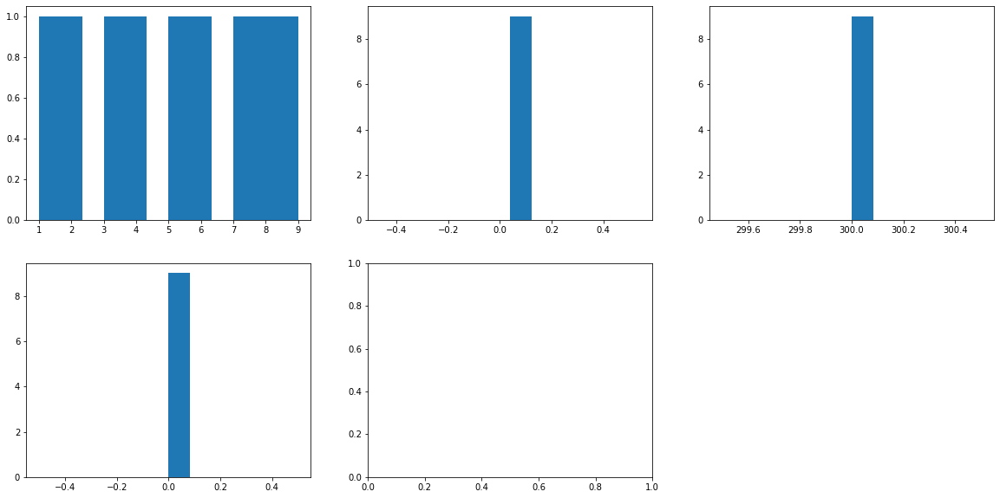

In [43]:
fig=plt.figure(figsize=(20,10))
ax1=fig.add_subplot(231)
ax2=fig.add_subplot(232)
ax3=fig.add_subplot(233)
ax4=fig.add_subplot(234)
ax5=fig.add_subplot(235)

ax1.hist(data[1:,0],bins=12)
ax2.hist(data[1:,1],bins=12)
ax3.hist(data[1:,2],bins=12)
ax4.hist(data[1:,3],bins=12)

# Select data for variable parameter of these simulations 

In [44]:
atm_vals = data[1:,var_index]

In [45]:
np.save('output_files/atm_vals_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),atm_vals)

# Convert simulated transparencies into pysynphot format 

In [46]:
atm_transp = []
for i in range(1,n_sim+1):
    finterp_i = interp1d(wl_t,data[i][n_atmp:],bounds_error=False,fill_value=0.)
    atm_interp_i = finterp_i(wl_lsst)
    #atm_i = S.ArrayBandpass(wl_t,data[i][n_atmp:], name='Atm. transp. {0}'.format(i))
    atm_i = S.ArrayBandpass(wl_lsst,atm_interp_i, name='Atm. transp. {0}'.format(i))
    atm_transp.append(atm_i)

In [47]:
finterp_ref = interp1d(wl_t,data_ref[1][n_atmp:],bounds_error=False,fill_value=0.)
atm_interp_ref = finterp_ref(wl_lsst)
#atm_i = S.ArrayBandpass(wl_t,data[i][n_atmp:], name='Atm. transp. {0}'.format(i))
atm_transp_ref = S.ArrayBandpass(wl_lsst,atm_interp_ref, name='Atm. transp. {0}'.format(i))

# Compute total bandpass (atmosphere(s) x LSST throughput) 

In [48]:
total_passband = {}
#for bpname in filters:
#    total_passband[bpname] = []

for index,bp in enumerate(lsst_bp):
    total_passband[filters[index]] = []
    for i in range(n_sim):
        total_pass = bp*atm_transp[i]
        total_passband[bp.name].append(total_pass)

In [49]:
total_passband_ref = {}
for index,bp in enumerate(lsst_bp):
    total_pass = bp*atm_transp_ref
    total_passband_ref[bp.name] = total_pass

In [50]:
print(len(total_passband['u']))
print(total_passband['u'][0])

9
(u * Atm. transp. 1)


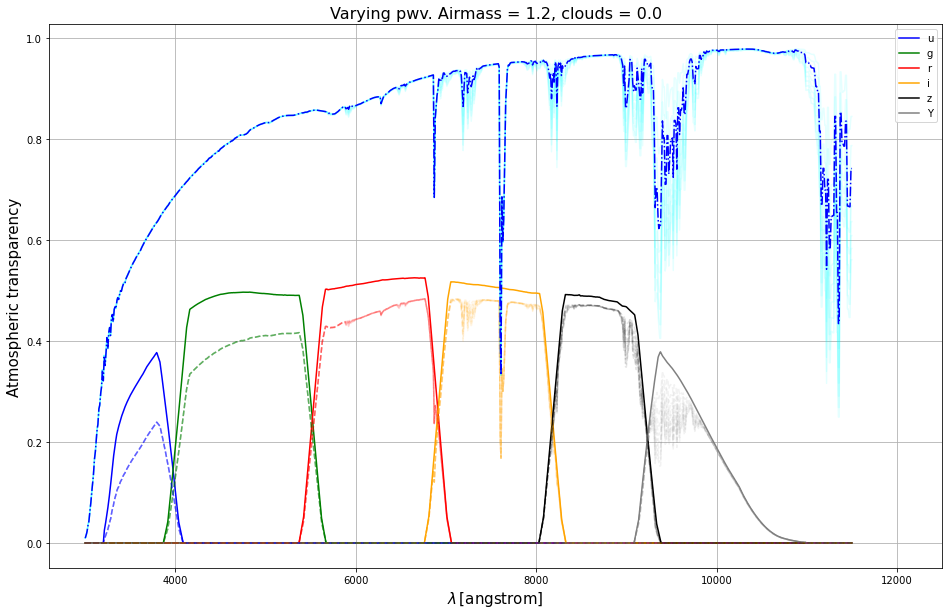

In [51]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
for index,bp in enumerate(lsst_bp):
    ax.plot(bp.wave,bp.throughput,label=filter_names[index],color=filter_colors[index])

for isim in range(n_sim):
    ax.plot(atm_transp[isim].wave,atm_transp[isim].throughput,alpha=0.1,color='cyan')
    for index,bpname in enumerate(filters):
        ax.plot(total_passband[bpname][isim].wave,total_passband[bpname][isim].throughput,ls='--',color=filter_colors[index],alpha=0.1)
ax.plot(atm_transp_ref.wave,atm_transp_ref.throughput,ls='-.',color='b')        
plt.xlim(2600.,12500.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.legend()
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'total_passbands_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Plot the atmospheric transparencies corresponding to the minimum and maximum atmospheric parameter that we are varying: 

In [52]:
min_val_ = np.min(atm_vals)
max_val_ = np.max(atm_vals)
print(min_val_,max_val_)

1.0 9.0


In [53]:
min_ind_ = np.where(atm_vals==min_val_)[0][0]
max_ind_ = np.where(atm_vals==max_val_)[0][0]

In [54]:
min_transp = data[1+min_ind_,n_atmp:]
max_transp = data[1+max_ind_,n_atmp:]

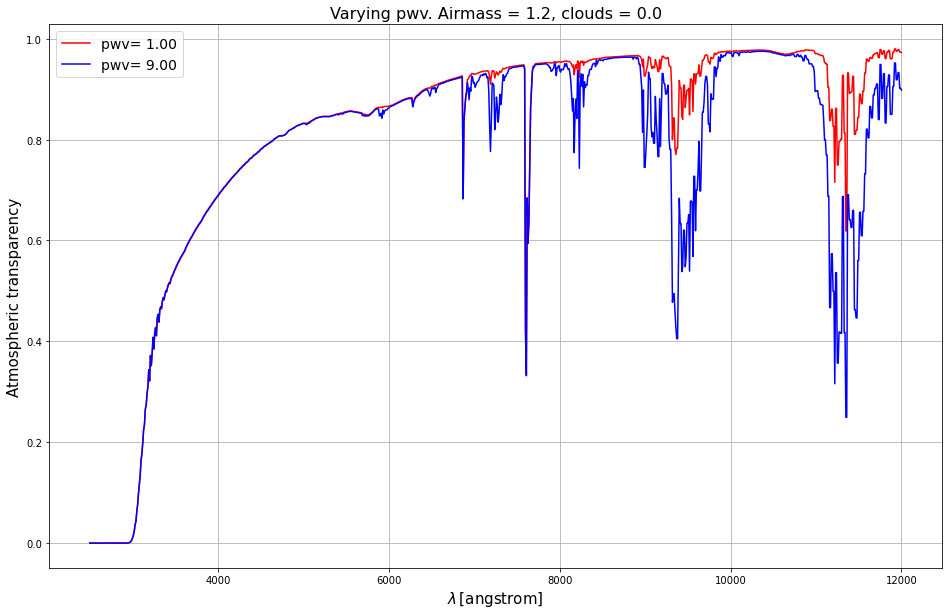

In [55]:
fig=plt.figure(figsize=(16,10))
plt.plot(wl_t,min_transp,color='r',label=variable_param+'= {0:.2f}'.format(min_val_))
plt.plot(wl_t,max_transp,color='b',label=variable_param+'= {0:.2f}'.format(max_val_))
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.grid()
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'atm_transparencies_varying_{0}_airmass_{1}_clouds_{2}_min_max_values.png'.format(variable_param,am0,cloud0)))

# Calculate fluxes through total passbands 

Let's start with one spectrum of a type A star as example 

In [56]:
# Example with one spectrum 
test_type = 'A'
test_spec = 0
example_spec = spec_by_type[test_type][test_spec]

In [57]:
# It seems this galaxy is a small enough place to end up choosing again, just by coincidence, Vega as example star 
vega = S.Vega
vega.convert('photlam')

photlam


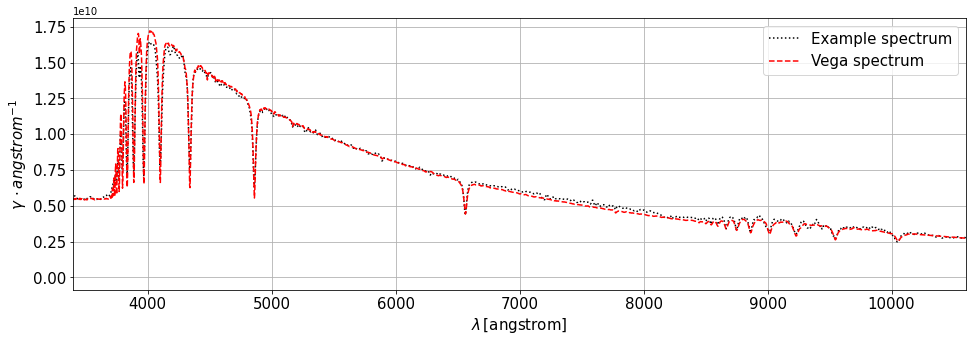

In [58]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls=':',color='k',alpha=1.0,label='Example spectrum')
plt.plot(vega.wave,vega.flux*Seff*exptime,ls='--',color='r',alpha=1.0,label='Vega spectrum')
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(example_spec.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
print(spec.fluxunits)

Let's make the example spectrum pass through the atmosphere and through the total passband (atm. x throughput) 

In [59]:
obsatm_dict = {}
for isim in range(n_sim):
    obsatm_dict[isim] = []
    obsatm = S.Observation(example_spec,atm_transp[isim],force='taper')
    obsatm_dict[isim] = obsatm

obstotal_dict = {}
for filter in filters:
    obstotal_dict[filter] = []

#for filter in lsst_bp:
for filter in filters:
    #print(filter.name.upper())
    for i in range(n_sim):
        #total_pass = filter*atm_transp[i]
        #obs = S.Observation(spec,total_pass,force='taper')
        obstotal = S.Observation(example_spec,total_passband[filter][i],force='taper')
        obstotal_dict[filter].append(obstotal)

(Atm. transp. 1) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 2) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 3) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 4) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 5) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 6) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 7) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 8) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 9) does not have a defined

u
g
r
i
z
Y
photlam


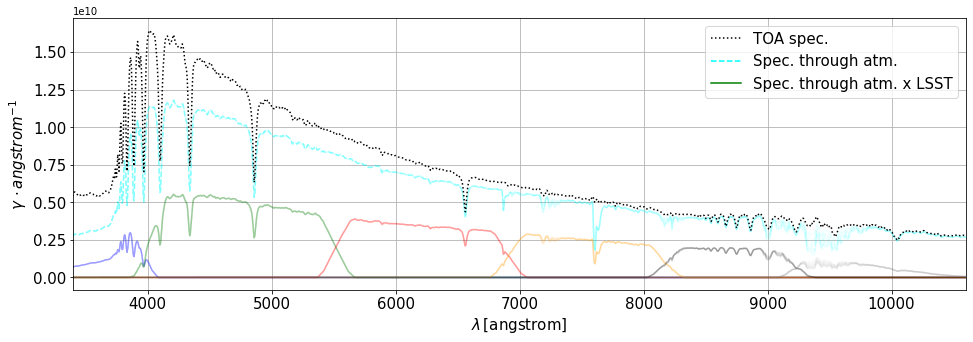

In [60]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for isim in range(n_sim):
    obsatm = obsatm_dict[isim]
    ax.plot(obsatm.binwave,obsatm.binflux*Seff*exptime,ls='--',color='cyan',alpha=0.07)

for index,filter in enumerate(obstotal_dict.keys()):
    print(filter)
    for obs in obstotal_dict[filter]:
        ax.plot(obs.binwave,obs.binflux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.05)
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls=':',color='k',alpha=1.0)
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.plot([],[],ls=':',color='k',label='TOA spec.')
plt.plot([],[],ls='--',color='cyan',label='Spec. through atm.')
plt.plot([],[],ls='-',color='g',label='Spec. through atm. x LSST')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
print(spec.fluxunits)

This was an example of how the spectrum looks like when passing only through the atmosphere and through the total passbands. For our calibration purposes, what we actually want is to have the spectra passing through either only the troughput (as if the telescope was on space) and through the total passband (ground-based telescope). Now let's pass all spectra through the throughput and through the atmosphere 

In [61]:
# Spectra through atm x throughput 
obs_dict = {}
#for sed_ in list(sed_dict.keys()):
for st in spectral_types:
    print(st)
    obs_dict_ = {}
    for si,spec in enumerate(spec_by_type[st]):
        filter_dict_ = {}
        for filter in filters:
            filter_dict_[filter] = []
            for i in range(n_sim):
                obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
                filter_dict_[filter].append(obs_spec)
        obs_dict_[si] = filter_dict_ 
    obs_dict[st] = obs_dict_


O
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [62]:
print(len(sed_dict.keys()))
print(len(obs_dict.keys()))
print(len(obs_dict[test_type].keys()))
#print(len(obs_dict[example_spec].keys()))
print(len(obs_dict[test_type][test_spec].keys()))
print(len(obs_dict[test_type][test_spec]['u']))
print(n_sim)

131
7
13
6
9
9


In [63]:
# Spectra only through throughput (as if telescope was in space) 
obs_dict_t = {}
for st in spectral_types:
    print(st)
    obs_dict_t_ = {}
    for si,spec in enumerate(spec_by_type[test_type]):
        filter_dict_ = {}
        for filter in lsst_bp:
            obs_spec_t = S.Observation(spec,filter,force='taper')
            filter_dict_[filter.name] = obs_spec_t
        obs_dict_t_[si] = filter_dict_ 
    obs_dict_t[st] = obs_dict_t_
    

O
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset 

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in

In [64]:
print(len(sed_dict.keys()))
print(len(obs_dict_t.keys()))
print(len(obs_dict_t[test_type].keys()))
print(len(obs_dict_t[test_type][test_spec].keys()))

131
7
13
6


In [65]:
obs_dict_t[test_type][0]['u']

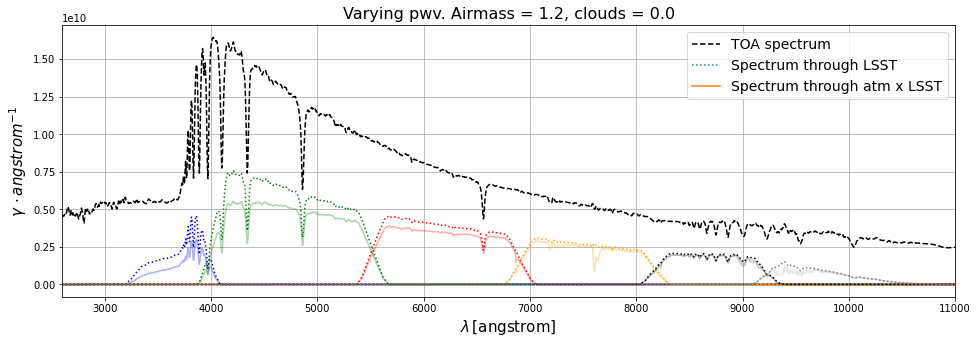

In [66]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
#sed_dict[example_spec].convert('photlam')
spec_by_type[test_type][test_spec].convert('photlam')
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(obs_dict_t[test_type][test_spec][filter].wave,obs_dict_t[test_type][test_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = obs_dict[test_type][test_spec][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)

plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_toa_throughput_total_passband_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Check that S.Observation is doing what we want it to do 

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.


(3000.0, 5000.0)

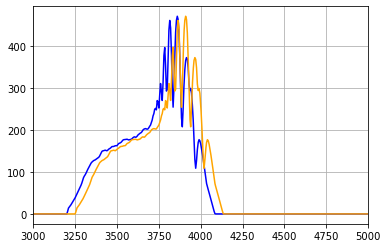

In [67]:
interp_pb_fun = interp1d(lsst_bp[0].wave,lsst_bp[0].throughput,bounds_error=False,fill_value=0.)
interp_pb_ = interp_pb_fun(example_spec.wave)

obs_1 = example_spec.flux*interp_pb_
obs_2 = S.Observation(example_spec,lsst_bp[0],force='taper')
plt.plot(example_spec.wave,obs_1,color='b')
plt.plot(obs_2.wave+50.,obs_2.flux,color='orange')
plt.grid()
plt.xlim(3000.,5000.)

# Calculate magnitudes with my own function 

Physical constants 

In [68]:
c_light = S.units.C #speed of light [Angstrom /s] 
print(c_light)
h_planck = S.units.H #Planck's constant [erg*s] 
print(h_planck)

2.99792458e+18
6.6262e-27


In [69]:
# Reference flux value for an AB source in erg / s / cm2 / Hz 
f_ref = 3.63*10**(-20)

In [70]:
# Pivot wavelength [cm] 
wl_piv = 5.4929*10**(-5)

In [71]:
C = f_ref/(h_planck*wl_piv*10**8.)
print(C)

997.3334660532323


Definition of functions 

In [72]:
# The SED of an AB source (that is, constant flux in frequency units) expressed in photons / s / cm^2 / Angstrom 
def ABnphot(wl):
    #return 997.2*5500./wl
    return C*wl_piv*10**8./wl

We check that this function actually creates a spectrum with the properties of an AB source, that is, a flat spectrum in fnu units (erg/s/cm2/Hz) 

Text(0, 0.5, 'Flux [Jy]')

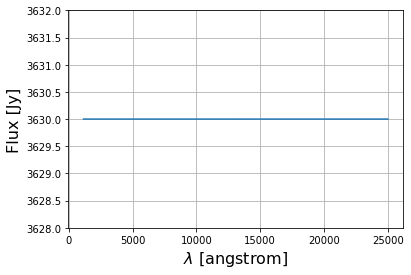

In [213]:
checkab = ABnphot(example_spec.wave)
checkab_ = S.ArraySpectrum(example_spec.wave, checkab, name='Flat AB spectrum')
#plt.plot(checkab_.wave,checkab_.flux)
checkab_.convert('fnu')
plt.plot(checkab_.wave,checkab_.flux*10**23.)
plt.ylim(3.628*10.**3,3.632*10**3.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel('Flux [Jy]',fontsize=16)

Now, we define our function to compute the AB magnitudes: 
$$m_{AB} = -2.5 \log_{10} \frac{\int F_{\nu}^E(\lambda) \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda) \frac{d\lambda}{h \lambda}}{\int F_{\nu, AB}^E \cdot S_{eff} \cdot t_{exp} \cdot S_{throughput}(\lambda) \frac{d\lambda}{h \lambda}} = -2.5 \log_{10} \frac{A}{B} \, . $$ 
Now, we want to compute the error for the AB magnitudes. The denominator is constant for a given $S_{throughput}(\lambda)$, so we assume it does not contribute to the error. Then, we can approximate $A$ as 
$$A \approx \sum_i F_{\nu}^E(\lambda_i) \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda_i) \frac{\Delta \lambda_i}{h \lambda_i} = \sum_i n_i \cdot S_{passband}(\lambda_i) \, , $$ 
where $n_i$ is the number of photo-electrons received within a given bin of wavelength, $\Delta \lambda_i$. Then, we can assume that $n_i$ is a Poisson random variable, so 
$$\sigma^2_{n_i} = n_i . $$ 
Taking this into account, we can write the error of $A$ as 
$$\sigma^2_A = \sum_i \left( \frac{\partial A}{\partial n_i} \right)^2 \sigma^2_{n_i} = \sum_i n_i \cdot S_{passband}^2(\lambda_i) \, , $$ 
therefore, 
$$\sigma_A = \sqrt{n_i} \, . $$
Finally, the error on $m_{AB}$ is given by 
$$\sigma^2_{m_{AB}} = \left( \frac{\partial m_{AB}}{\partial A} \right)^2 \sigma^2_A = \left( \frac{-2.5}{A \log 10} \right)^2 \cdot \sum_i n_i \cdot S_{passband}^2(\lambda_i) \, . $$ 


In [215]:
def myAB(spec,passband,filter,return_error=False):
    f_units = str(spec.fluxunits)
    if f_units!='fnu':
        print('ATTENTION: converting flux units to fnu')
        spec.convert('fnu')
        
    observation = S.Observation(spec,passband,force='taper')
    print('Observation units = ', observation.fluxunits)
    nan_mask = np.isnan(observation.flux)
    
    obs_wave_ = observation.wave[~nan_mask]
    obs_flux_ = observation.flux[~nan_mask]
    wave_min = np.min(observation.wave[~nan_mask])
    wave_max = np.max(observation.wave[~nan_mask])

    num = np.trapz(obs_flux_/obs_wave_,x=obs_wave_)*Seff*exptime/h_planck
    #obmag = -2.5*np.log10(num)
    
    if return_error:
        finterp_pb = interp1d(passband.wave,passband.throughput,bounds_error=False,fill_value=0.)
        pb_interp = finterp_pb(spec.wave)
        
        delta_lambda = list(np.diff(spec.wave))
        delta_lambda.append(spec.wave[-1]-spec.wave[-2])
        delta_lambda = np.array(delta_lambda)
        assert len(delta_lambda)==len(spec.wave)
        
        assert str(spec.fluxunits)=='fnu'
        n_i = spec.flux*delta_lambda*Seff*exptime/(spec.wave*h_planck)
        #print(len(n_i),len(pb_interp))
        print('n_i = ', n_i)
        print('Number of collected photoelectrons = {0:.2e}'.format(np.sum(n_i*pb_interp)))
        err2_num = np.sum(n_i*np.array(pb_interp)**2.)
    
    spec.convert(f_units)
    
    print('Numerator = {0:.2e}'.format(num))
    if return_error:
        print('Variance of the numerator = {0:.2e}'.format(err2_num))
    
    #flatsp = S.FlatSpectrum(f_ref,fluxunits='fnu')
    #flatsp_vals = np.ones(len(spec.wave))*f_ref
    #flatsp = S.ArraySpectrum(spec.wave,flatsp_vals)
    
    flatsp_nphot = ABnphot(spec.wave)
    flatsp_ = S.ArraySpectrum(spec.wave, flatsp_nphot, name='Flat AB spectrum')
    
    flatsp_.convert('fnu')
    ab_obs = S.Observation(flatsp_,filter,force='taper')
    print('AB observation units = ', ab_obs.fluxunits)
    
    ab_wave_ = ab_obs.wave[~nan_mask]
    ab_flux_ = ab_obs.flux[~nan_mask]
    
    den = np.trapz(ab_flux_/ab_wave_,x=ab_wave_)*Seff*exptime/h_planck
    
    print('Denominator = {0:.2e}'.format(den))
    #print(num/den)
    #print(obmag)
    mab = -2.5*np.log10(num/den)
    print('AB magnitude = ', mab)
    print('---------')
    
    if return_error:
        err2_mab = (2.5**2./np.log(10.)**2.)*err2_num/num**2.
        err_mab = np.sqrt(err2_mab)
        
        return mab,err_mab
    else:
        return mab

In [75]:
# This function gives the flux of an AB source in photons / s / cm^2 / Angstrom 
flatsp_nphot = ABnphot(example_spec.wave)

In [76]:
#Let's write this in pysynphot format (note that the result will be in photlam units, then we use ABnphot as input)
flatsp = S.ArraySpectrum(example_spec.wave, flatsp_nphot, name='Flat AB spectrum')

In [77]:
flatsp.fluxunits

photlam


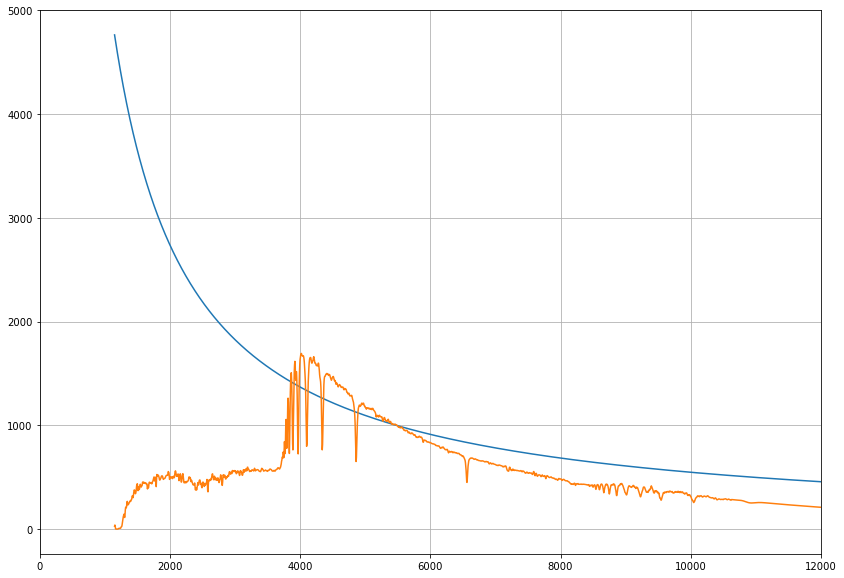

In [78]:
print(flatsp.fluxunits)
flatsp.convert('photlam')
example_spec.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux)
plt.plot(example_spec.wave,example_spec.flux)
plt.xlim(0.,12000.)
plt.grid()

Here we verify that creating a pysynphot AB flat spectrum and transforming it to photlam gives the same as directly creating the same spectrum in photlam units with ABnphot 

In [79]:
flatsp0 = S.FlatSpectrum(f_ref,fluxunits='fnu')
flatsp0.fluxunits

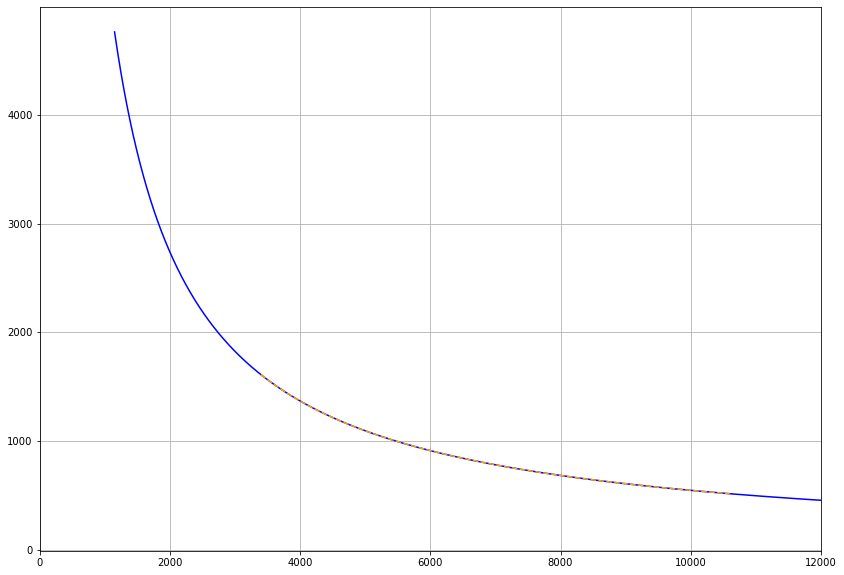

In [80]:
flatsp0.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux,color='b')
plt.plot(flatsp0.wave,flatsp0.flux,ls='--',color='orange')
plt.xlim(0.,12000.)
plt.grid()

To further check it, let's transform it to flam and compare with the analytical expression: 

$$F_{\lambda} = F_{\nu} \frac{c}{\lambda^2}$$

In [81]:
flambda = f_ref*c_light/flatsp.wave**2.

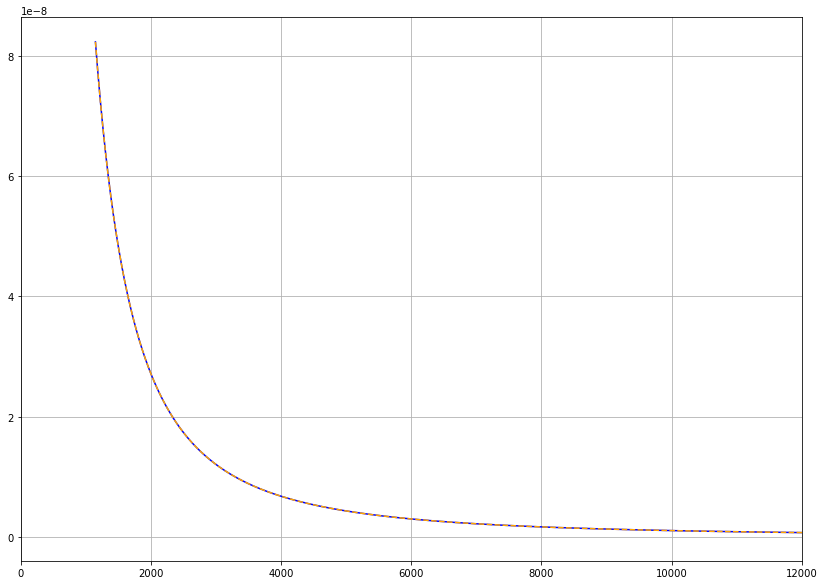

In [82]:
flatsp.convert('flam')
flatsp.waveunits
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux,color='b')
plt.plot(flatsp.wave,flambda,color='orange',ls='--')
plt.xlim(0.,12000.)
plt.grid()
flatsp.convert('photlam')

Now we check that the AB magnitudes are zero for the flat AB spectrum (they have to be through any filter, by definition) 

In [83]:
for filter in lsst_bp:
    myAB(flatsp,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.09e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.0
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.0
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.16e+12
(r) does not have a defined binset in the w

We check the same for the total passband. Note that, given the definition of AB magnitudes that we have implemented, the denominator only considers the throughput of the telescope, even when the spectra pass through the total passband, since the "reference" we want to compare to is when there is no effect of the atmosphere, but in any case the light passes through the telescope, so we consider the telescope's throughput to be the reference (i.e. as if it had a transmission = 1) with respect to which the flux is attenuated. Therefore, the following AB magnitudes of a flat AB spectrum should be different from (greater than) zero  

In [84]:
for fi,filter in enumerate(filters):
    myAB(flatsp,total_passband[filter][0],lsst_bp[fi])

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.79e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5907842494301049
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.54e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2490206415575848
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obse

Make the flat spectrum pass through the throughputs and total passbands 

In [85]:
flat_dict_t = {}
for fi,filter in enumerate(filters):
    flat_spec_t_ = S.Observation(flatsp,lsst_bp[fi],force='taper')
    flat_dict_t[filter] = flat_spec_t_

flat_dict = {}
for fi,filter in enumerate(filters):
    flat_dict[filter] = []
    for i in range(n_sim):
        flat_spec_ = S.Observation(flatsp,total_passband[filter][i],force='taper')
        flat_dict[filter].append(flat_spec_)

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum wi

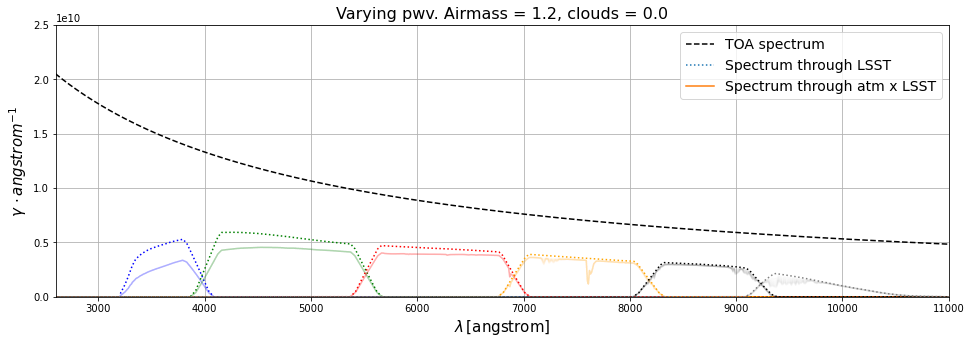

In [86]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
#sed_dict[example_spec].convert('photlam')
if str(flatsp.fluxunits)!='photlam':
    flatsp.convert('photlam')
plt.plot(flatsp.wave,flatsp.flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(flat_dict_t[filter].wave,flat_dict_t[filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = flat_dict[filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)

plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.ylim(0.,2.5e10)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'flat_spectrum_toa_throughput_total_passband_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Now we check that the error is equal to $n_i$ in the case of a flat unitary filter, that is, when $S_{passband}(\lambda) = S_{throughput}(\lambda) = 1 \, \forall \lambda$, so 
$$\sigma_A^2 = \sum_i \sigma_i^2 \, .$$ 

770 970


Text(0, 0.5, '$S(\\lambda)$')

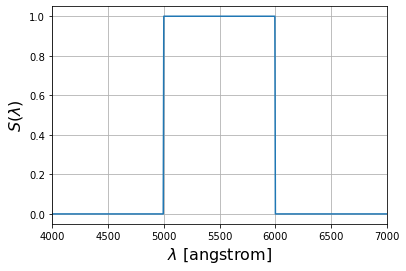

In [184]:
flat_filter_ = np.zeros(len(example_spec.wave))
wmin_index = np.where(example_spec.wave>=5000.)[0][0]
wmax_index = np.where(example_spec.wave<=6000.)[0][-1]
print(wmin_index,wmax_index)
flat_filter_[wmin_index:wmax_index] = 1.0
flat_filter = S.ArrayBandpass(example_spec.wave,flat_filter_)
plt.plot(flat_filter.wave,flat_filter.throughput)
plt.xlim(4000.,7000.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$S(\lambda)$',fontsize=16)

photlam
photlam


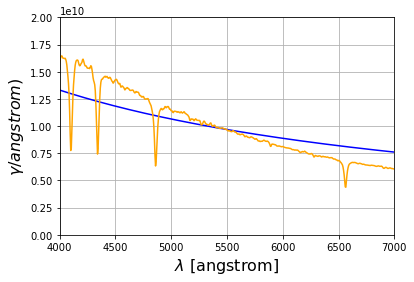

In [185]:
f_units_ = str(example_spec.fluxunits)
print(f_units_)
example_spec.convert('photlam')
flatsp.convert('photlam')
plt.plot(flatsp.wave,flatsp.flux*Seff*exptime,color='b')
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,color='orange')
plt.xlim(4000.,7000.)
plt.ylim(0.,2e10)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$)',fontsize=16)
example_spec.convert(f_units_)
print(example_spec.fluxunits)

In [186]:
myAB(example_spec,flat_filter,flat_filter,return_error=True)

ATTENTION: converting flux units to fnu
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 9.69e+12
Numerator = 9.69e+12
Variance of the numerator = 9.69e+12
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 9.71e+12
AB magnitude =  0.0028401999586074277
---------


(0.0028401999586074277, 3.488265780768848e-07)

We confirm that the value of the number of collected photoelectrons, $n_i$, is equal to its variance, $\sigma^2_{n_i}$. 

Check with a $m_{AB}=25$ source 

Text(0, 0.5, '$m_{AB}(\\lambda)$')

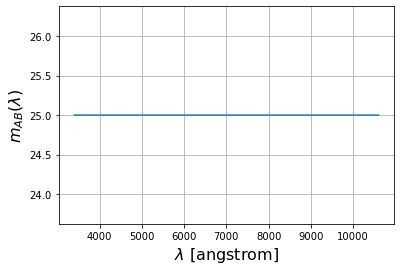

In [190]:
mb = 25
mab25spec = S.FlatSpectrum(mb,fluxunits='abmag')
plt.plot(mab25spec.wave,mab25spec.flux)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$m_{AB}(\lambda)$',fontsize=16)

[1.61159734e-07 1.61112348e-07 1.61064990e-07 ... 5.17073791e-08
 5.17025002e-08 5.16976221e-08]


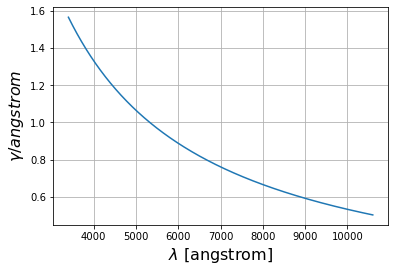

In [191]:
mab25spec.convert('photlam')
plt.plot(mab25spec.wave,mab25spec.flux*Seff*exptime)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$',fontsize=16)
print(mab25spec.flux)
mab25spec.convert('abmag')

[3.63078055e-30 3.63078055e-30 3.63078055e-30 ... 3.63078055e-30
 3.63078055e-30 3.63078055e-30]


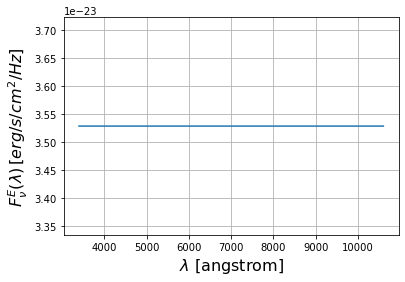

In [192]:
mab25spec.convert('fnu')
plt.plot(mab25spec.wave,mab25spec.flux*Seff*exptime)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$F^E_{\nu}(\lambda) \, [erg/s/cm^2/Hz]$',fontsize=16)
print(mab25spec.flux)

In [193]:
mean25 = np.mean(mab25spec.flux)
flat25_ = np.ones(len(flatsp.wave))*mean25
flat25 = S.ArraySpectrum(flatsp.wave,flat25_,fluxunits='fnu')

photlam


Text(0, 0.5, '$F^E_{\\nu}(\\lambda) \\, [erg/s/cm^2/Hz]$')

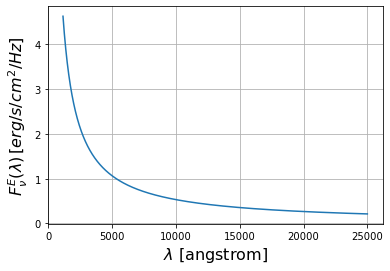

In [201]:
print(flat25.fluxunits)
plt.plot(flat25.wave,flat25.flux*Seff*exptime)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$F^E_{\nu}(\lambda) \, [erg/s/cm^2/Hz]$',fontsize=16)

We evaluate the ratio between the $m_{AB} = 25$ flat spectrum, $F^{E,m_{AB}=25}_{\nu}(\lambda)$, and the reference $m_{AB} = 0$ flat spectrum, $F^{E,m_{AB}=0}_{\nu}(\lambda)$. This should be: 
$$m_{AB} = 25 = -2.5 \log_{10} \left( \frac{F^{E,m_{AB}=25}_{\nu}(\lambda)}{F^{E,m_{AB}=0}_{\nu}(\lambda)} \right) \implies \frac{F^{E,m_{AB}=25}_{\nu}(\lambda)}{F^{E,m_{AB}=0}_{\nu}(\lambda)} = 10^{-10} \, . $$ 

Note that this is also true given our definition of AB magnitude, since 
$$m_{AB} = -2.5 \log_{10} \frac{\int F_{\nu, AB}^E \cdot 10^{-10} \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda) \frac{d\lambda}{h \lambda}}{\int F_{\nu, AB}^E \cdot S_{eff} \cdot t_{exp} \cdot S_{throughput}(\lambda) \frac{d\lambda}{h \lambda}} = -2.5 \log_{10} 10^{-10} = 25 \, .$$ 

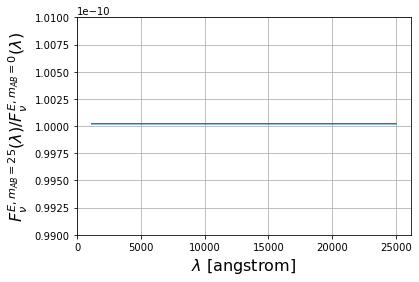

In [216]:
flat_units = str(flatsp.fluxunits)
flatsp.convert('fnu')
flat25.convert('fnu')
plt.plot(flat25.wave,flat25.flux/flatsp.flux)
plt.grid()
plt.ylim(0.99e-10,1.01e-10)
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$F^{E,m_{AB}=25}_{\nu}(\lambda) / F^{E,m_{AB}=0}_{\nu}(\lambda)$',fontsize=16)
flatsp.convert(flat_units)

In [204]:
myAB(flat25,flat_filter,flat_filter,return_error=True)

ATTENTION: converting flux units to fnu
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [23.15765718 23.05740885 22.95802235 ...  1.0656785   1.06546531
  1.06525221]
Number of collected photoelectrons = 9.72e+02
Numerator = 9.72e+02
Variance of the numerator = 9.72e+02
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 9.71e+12
AB magnitude =  24.999766562931462
---------


(24.999766562931462, 0.03483331765369222)

Since the AB mag = 25 spectrum is flat, it should have the same magnitude for any filter, given our definition of $m_{AB}$ as established above, the same way as the reference AB flat spectrum (3631.1 Jy or mag = 0) 

In [205]:
for filter in lsst_bp:
    myAB(flat25,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.09e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.99976656278364
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.22e+02
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  24.999766564158396
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.16e+02
(r) does not hav

Check with a fainter star 

photlam
photlam


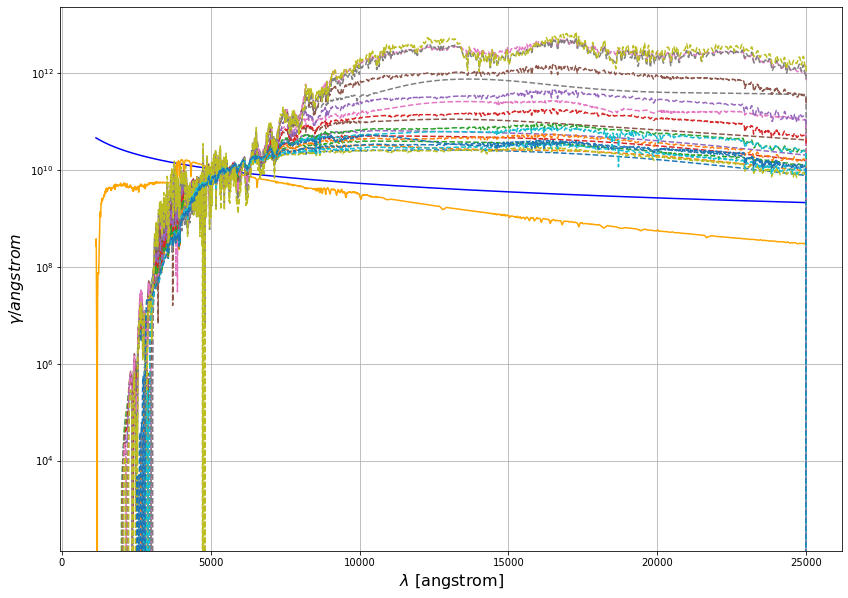

In [206]:
test_type2 = 'M'
f_units_ = str(example_spec.fluxunits)
print(f_units_)
example_spec.convert('photlam')
flatsp.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux*Seff*exptime,color='b')
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,color='orange')
for spec_ in spec_by_type[test_type2]:
    spec_.convert('photlam')
    plt.plot(spec_.wave,spec_.flux*Seff*exptime,ls='--')
plt.grid()
plt.yscale("log")
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$',fontsize=16)
example_spec.convert(f_units_)
print(example_spec.fluxunits)


In [98]:
example_spec2 = spec_by_type[test_type2][0]

In [99]:
myAB(example_spec2,flat_filter,flat_filter,return_error=True)

ATTENTION: converting flux units to fnu
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 9.67e+12
Numerator = 9.67e+12
Variance of the numerator = 9.67e+12
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 9.71e+12
AB magnitude =  0.004915114156117043
---------


(0.004915114156117043, 3.491600528108183e-07)

Now, let's see the AB magnitudes of the example spectrum with myAB function. To better understand it, we can compare the AB spectrum and the example spectrum (Vega) flux amplitudes in each range of wavelengths (see plot below) 

photlam


Text(0, 0.5, '$\\gamma / angstrom$')

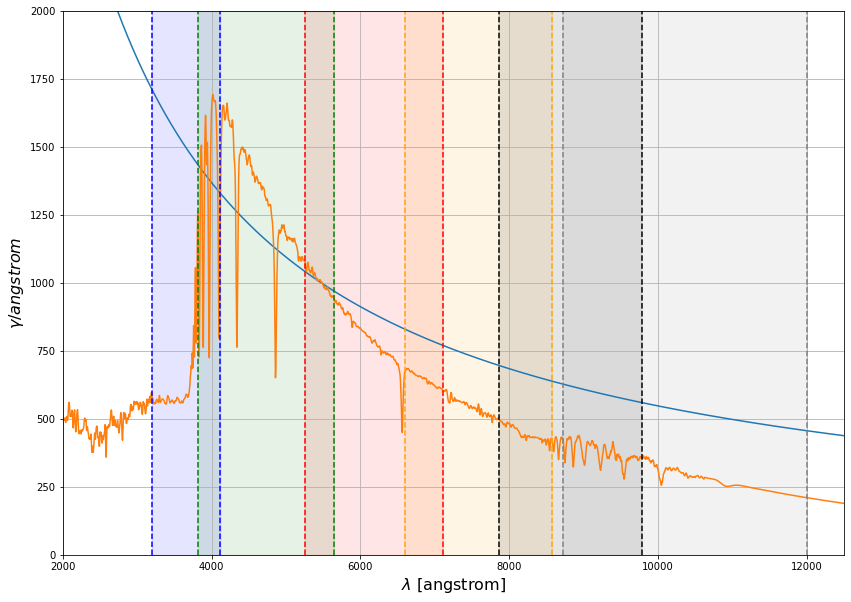

In [212]:
print(flatsp.fluxunits)
flatsp.convert('photlam')
example_spec.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux)
plt.plot(example_spec.wave,example_spec.flux)

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*2000.,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*2000.,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*2000.,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*2000.,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*2000.,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*2000.,color=filter_colors[5],alpha=0.1)

plt.xlim(2000.,12500.)
plt.ylim(0.,2000.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$',fontsize=16)

In [101]:
for filter in lsst_bp:
    myAB(example_spec,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.59e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7222408197036627
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.09224087927554477
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not 

In [102]:
for fi,filter in enumerate(filters):
    myAB(example_spec,total_passband[filter][0],lsst_bp[fi])

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.59e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.2700717573625688
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.15895508931776064
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obs

# Calculate magnitudes and colours

We compute the magnitudes for the spectra of each spectral type for each atmosphere 

In [103]:
calc_mag_err = True

In [104]:
# Magnitudes of spectra passing through atm x throughput 
mag_dict = {}
mag_dict_ref = {}
mag_err_dict = {}
mag_err_dict_ref = {}
for st in spectral_types:
    print(st)
    
    mag_dict_st = {}
    mag_dict_ref_st = {}
    mag_err_dict_st = {}
    mag_err_dict_ref_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        mag_dict_ = {}
        mag_dict_ref_ = {}
        mag_err_dict_ = {}
        mag_err_dict_ref_ = {}
        for fi,filter in enumerate(filters):
            mag_dict_[filter] = []
            mag_err_dict_[filter] = []
            for i in range(n_sim):
                #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
                if calc_mag_err:
                    mag_ab_, mag_ab_err_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],return_error=True)
                    mag_err_dict_[filter].append(mag_ab_err_)
                else:
                    mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
                mag_dict_[filter].append(mag_ab_)
                
            #mag_dict[sed_] = mag_dict_
            
            if calc_mag_err:
                mag_ab_, mag_ab_err_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],return_error=True)
                mag_err_dict_ref_[filter] = mag_ab_err_
            else:
                mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
            mag_dict_ref_[filter] = mag_ab_
        mag_dict_st[si] = mag_dict_
        mag_dict_ref_st[si] = mag_dict_ref_
        mag_err_dict_st[si] = mag_err_dict_
        mag_err_dict_ref_st[si] = mag_err_dict_ref_
    mag_dict[st] = mag_dict_st
    mag_dict_ref[st] = mag_dict_ref_st
    mag_err_dict[st] = mag_err_dict_st
    mag_err_dict_ref[st] = mag_err_dict_ref_st
        

O
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.66e+12
Numerator = 3.66e+12
Variance of the numerator = 6.33e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.18506956392796864
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.66e+12
Numerator = 3.66e+12
Variance of the numerator = 6.33

n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.68e+12
Numerator = 8.68e+12
Variance of the numerator = 3.15e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.059440689853362566
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.68e+12
Numerator = 8.68e+12
Variance of the numerator = 3.15e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.0594651581

Denominator = 6.16e+12
AB magnitude =  0.3961330756933751
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.32e+12
Numerator = 2.32e+12
Variance of the numerator = 1.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.730208783965599
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons =

Number of collected photoelectrons = 1.22e+12
Numerator = 1.22e+12
Variance of the numerator = 5.10e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.0019187022743627
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.22e+12
Numerator = 1.22e+12
Variance of the numerator = 5.07e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.0070457750608273
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined bins

Denominator = 1.65e+12
AB magnitude =  1.3665921921328557
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.24e+11
Numerator = 5.23e+11
Variance of the numerator = 1.15e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.2449914766798447
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons 

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.52e+12
Numerator = 8.52e+12
Variance of the numerator = 3.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.03836197755636573
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.52e+12
Numerator = 8.52e+12
Variance of the numerator = 3.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.03838408936

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.20e+12
Numerator = 4.20e+12
Variance of the numerator = 1.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.4164708614673373
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.33e+12
Numerator = 2.33e+12
Variance of the numerator = 1.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.72650282184766

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.22e+12
Numerator = 1.22e+12
Variance of the numerator = 5.11e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.0052661296532246
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.22e+12
Numerator = 1.22e+12
Variance of the numerator = 5.07e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.01048595738321

Denominator = 3.09e+12
AB magnitude =  -0.10847767867027797
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 3.41e+12
Numerator = 3.41e+12
Variance of the numerator = 5.88e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.10849071895062021
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectr

n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 8.46e+12
Numerator = 8.46e+12
Variance of the numerator = 3.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.03086438936537498
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 8.46e+12
Numerator = 8.46e+12
Variance of the numerator = 3.08e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.03128756293

n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 2.31e+12
Numerator = 2.31e+12
Variance of the numerator = 1.00e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.7362413461161937
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 2.31e+12
Numerator = 2.31e+12
Variance of the numerator = 9.99e+11
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.73892252344651

n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 1.19e+12
Numerator = 1.19e+12
Variance of the numerator = 4.90e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.0324792325714625
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 1.23e+12
Numerator = 1.23e+12
Variance of the numerator = 5.14e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.00069297405528

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.21e+12
Numerator = 3.21e+12
Variance of the numerator = 5.57e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.0430793147050029
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.21e+12
Numerator = 3.21e+12
Variance of the numerator = 5.57e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.043192859398

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.30e+12
Numerator = 4.30e+12
Variance of the numerator = 1.82e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.38961604089901064
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.30e+12
Numerator = 4.30e+12
Variance of the numerator = 1.82e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3899364754401

((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.32e+12
Numerator = 1.32e+12
Variance of the numerator = 5.58e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.9193768787074978
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.31e+12
Numerator = 1.31e+12
Variance of the numerator = 5.53e+11
(z) does not have a defined binset in t

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.32e+11
Numerator = 5.32e+11
Variance of the numerator = 1.11e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.2271826967590518
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.22e+11
Numerator = 5.22e+11
Variance of the numerator = 1.07e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.24766850256224

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 8.04e+12
Numerator = 8.04e+12
Variance of the numerator = 2.93e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.024433366805828208
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 8.04e+12
Numerator = 8.04e+12
Variance of the numerator = 2.93e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.024451107139

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 4.42e+12
Numerator = 4.42e+12
Variance of the numerator = 1.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.36093213334555996
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 4.42e+12
Numerator = 4.42e+12
Variance of the numerator = 1.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3612992928035

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 1.43e+12
Numerator = 1.43e+12
Variance of the numerator = 5.95e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8348009781652731
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 1.42e+12
Numerator = 1.42e+12
Variance of the numerator = 5.91e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.83991377690224

((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 6.14e+11
Numerator = 6.14e+11
Variance of the numerator = 1.35e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.0726733141448106
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.13e+12
Numerator = 2.13e+12
Variance of the numerator = 3.70e+11
(u) does not have a defined binset in t

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.91e+12
Numerator = 7.91e+12
Variance of the numerator = 2.89e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.042160354461953924
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.91e+12
Numerator = 7.91e+12
Variance of the numerator = 2.89e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.042157757697

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.70e+12
Numerator = 2.70e+12
Variance of the numerator = 1.18e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5660008979149829
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.70e+12
Numerator = 2.70e+12
Variance of the numerator = 1.18e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.56874376286658

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.05e+11
Numerator = 7.05e+11
Variance of the numerator = 1.68e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.9213568542839221
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.83e+11
Numerator = 6.83e+11
Variance of the numerator = 1.56e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.95606764051671

Denominator = 3.09e+12
AB magnitude =  0.6994001915860432
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 1.62e+12
Numerator = 1.62e+12
Variance of the numerator = 2.84e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.699217874998041
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons =

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 4.59e+12
Numerator = 4.59e+12
Variance of the numerator = 1.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3200398684798039
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 4.59e+12
Numerator = 4.59e+12
Variance of the numerator = 1.94e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.32036138310838

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 2.83e+12
Numerator = 2.83e+12
Variance of the numerator = 1.22e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5174381721783837
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 2.82e+12
Numerator = 2.82e+12
Variance of the numerator = 1.21e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.52122304564047

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 6.89e+11
Numerator = 6.89e+11
Variance of the numerator = 1.40e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.9472773594871435
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 6.77e+11
Numerator = 6.77e+11
Variance of the numerator = 1.35e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.96620993884472

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.35e+12
Numerator = 1.35e+12
Variance of the numerator = 2.36e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.8998071403048229
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 7.51e+12
Numerator = 7.51e+12
Variance of the numerator = 2.75e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.09867690873959

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 4.71e+12
Numerator = 4.71e+12
Variance of the numerator = 1.99e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.290685369480307
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 4.73e+12
Numerator = 4.73e+12
Variance of the numerator = 2.01e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.287222763203248

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.80e+12
Numerator = 1.80e+12
Variance of the numerator = 7.57e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5825422213897616
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.79e+12
Numerator = 1.79e+12
Variance of the numerator = 7.51e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.58824877211030

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.19e+12
Numerator = 1.19e+12
Variance of the numerator = 2.09e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.035548132592116
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.19e+12
Numerator = 1.19e+12
Variance of the numerator = 2.09e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.035535781633137

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 7.27e+12
Numerator = 7.27e+12
Variance of the numerator = 2.68e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.13320518891444091
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 7.27e+12
Numerator = 7.27e+12
Variance of the numerator = 2.68e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1330955032037

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 2.96e+12
Numerator = 2.96e+12
Variance of the numerator = 1.29e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4671835673379188
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 2.95e+12
Numerator = 2.95e+12
Variance of the numerator = 1.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.46984851934444

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.78e+12
Numerator = 1.78e+12
Variance of the numerator = 7.33e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5986973274884457
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.83e+12
Numerator = 1.83e+12
Variance of the numerator = 7.69e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.56697209403114

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 2.73e+12
Numerator = 2.73e+12
Variance of the numerator = 4.70e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.13507280750460926
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 2.73e+12
Numerator = 2.73e+12
Variance of the numerator = 4.70e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.1349593042697

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 4.40e+12
Numerator = 4.40e+12
Variance of the numerator = 1.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3649877970554643
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 4.40e+12
Numerator = 4.40e+12
Variance of the numerator = 1.86e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.36531056633253

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 1.44e+12
Numerator = 1.44e+12
Variance of the numerator = 6.11e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8247995743515426
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 1.43e+12
Numerator = 1.43e+12
Variance of the numerator = 6.05e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.83135567327577

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 5.74e+11
Numerator = 5.74e+11
Variance of the numerator = 1.19e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.14467730313381
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 5.64e+11
Numerator = 5.64e+11
Variance of the numerator = 1.15e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.1646328637335543

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 7.58e+12
Numerator = 7.58e+12
Variance of the numerator = 2.78e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.08774057733990988
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 7.58e+12
Numerator = 7.58e+12
Variance of the numerator = 2.78e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0877585553728

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 4.68e+12
Numerator = 4.68e+12
Variance of the numerator = 1.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2976012927530165
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 4.68e+12
Numerator = 4.68e+12
Variance of the numerator = 1.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.29797188089666

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.73e+12
Numerator = 1.73e+12
Variance of the numerator = 7.17e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.6285651272325135
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.72e+12
Numerator = 1.72e+12
Variance of the numerator = 7.11e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.63454221470893

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.80e+12
Numerator = 2.80e+12
Variance of the numerator = 4.87e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.10684849227421758
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.80e+12
Numerator = 2.80e+12
Variance of the numerator = 4.87e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.1068374521231

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 8.16e+12
Numerator = 8.16e+12
Variance of the numerator = 2.98e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.007623240947852888
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 4.36e+12
Numerator = 4.36e+12
Variance of the numerator = 1.85e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.374169325033

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.49e+12
Numerator = 2.49e+12
Variance of the numerator = 1.08e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6554457201955726
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.48e+12
Numerator = 2.48e+12
Variance of the numerator = 1.08e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.65799815283740

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 5.80e+11
Numerator = 5.80e+11
Variance of the numerator = 1.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.1335262962113213
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 5.67e+11
Numerator = 5.67e+11
Variance of the numerator = 1.22e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.15852013822297

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 2.10e+12
Numerator = 2.10e+12
Variance of the numerator = 3.66e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.41773062930702015
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 2.11e+12
Numerator = 2.11e+12
Variance of the numerator = 3.67e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.4158351479018

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 4.40e+12
Numerator = 4.40e+12
Variance of the numerator = 1.86e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3653004968903747
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 4.40e+12
Numerator = 4.40e+12
Variance of the numerator = 1.86e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.36596734219504

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 2.67e+12
Numerator = 2.67e+12
Variance of the numerator = 1.17e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5779675996742252
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 1.57e+12
Numerator = 1.57e+12
Variance of the numerator = 6.64e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.73189062398499

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 5.86e+11
Numerator = 5.86e+11
Variance of the numerator = 1.13e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.123134803257067
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 6.54e+11
Numerator = 6.54e+11
Variance of the numerator = 1.44e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.002927670508325

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 7.78e+12
Numerator = 7.78e+12
Variance of the numerator = 2.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.060191415148214134
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 7.78e+12
Numerator = 7.78e+12
Variance of the numerator = 2.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.060209888933

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 2.83e+12
Numerator = 2.83e+12
Variance of the numerator = 1.24e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5164639682680437
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 2.82e+12
Numerator = 2.82e+12
Variance of the numerator = 1.23e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.51918759098531

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 1.61e+12
Numerator = 1.61e+12
Variance of the numerator = 6.71e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7018553888978136
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 1.61e+12
Numerator = 1.61e+12
Variance of the numerator = 6.66e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.70704855353343

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.17e+12
Numerator = 1.17e+12
Variance of the numerator = 2.05e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.0523283535445362
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.17e+12
Numerator = 1.17e+12
Variance of the numerator = 2.06e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.05215020322344

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 7.45e+12
Numerator = 7.45e+12
Variance of the numerator = 2.74e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.10662695092979832
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 7.45e+12
Numerator = 7.45e+12
Variance of the numerator = 2.74e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1070865472836

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 2.90e+12
Numerator = 2.90e+12
Variance of the numerator = 1.25e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4907325115787697
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 2.89e+12
Numerator = 2.89e+12
Variance of the numerator = 1.25e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.49452922096627

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 8.67e+11
Numerator = 8.67e+11
Variance of the numerator = 1.96e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6975608936950427
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 8.45e+11
Numerator = 8.45e+11
Variance of the numerator = 1.85e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.72572378185458

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 2.50e+12
Numerator = 2.50e+12
Variance of the numerator = 4.33e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.23041947689901876
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 7.78e+12
Numerator = 7.78e+12
Variance of the numerator = 2.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0596083304750

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 4.41e+12
Numerator = 4.41e+12
Variance of the numerator = 1.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.362226158466093
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 4.41e+12
Numerator = 4.41e+12
Variance of the numerator = 1.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.362656402400872

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 1.47e+12
Numerator = 1.47e+12
Variance of the numerator = 6.18e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8042794303787202
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 1.46e+12
Numerator = 1.46e+12
Variance of the numerator = 6.13e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.80984281076441

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 5.64e+11
Numerator = 5.64e+11
Variance of the numerator = 1.10e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.1632775695588526
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 5.56e+11
Numerator = 5.56e+11
Variance of the numerator = 1.07e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.17907681828304

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 7.55e+12
Numerator = 7.55e+12
Variance of the numerator = 2.77e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.09262503759298873
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 7.55e+12
Numerator = 7.55e+12
Variance of the numerator = 2.77e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0925096598558

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 2.76e+12
Numerator = 2.76e+12
Variance of the numerator = 1.21e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5448887911797528
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 2.75e+12
Numerator = 2.75e+12
Variance of the numerator = 1.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.54773656967156

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 1.53e+12
Numerator = 1.53e+12
Variance of the numerator = 6.31e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7612719626010994
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 1.57e+12
Numerator = 1.57e+12
Variance of the numerator = 6.61e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.72976664463904

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.89e+12
Numerator = 2.89e+12
Variance of the numerator = 4.99e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.07172073591410881
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.89e+12
Numerator = 2.89e+12
Variance of the numerator = 4.99e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.0717008036110

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 4.37e+12
Numerator = 4.37e+12
Variance of the numerator = 1.85e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.37312004353292155
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 4.37e+12
Numerator = 4.37e+12
Variance of the numerator = 1.85e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3734415330730

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.54e+12
Numerator = 2.54e+12
Variance of the numerator = 1.10e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6316286260953234
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.54e+12
Numerator = 2.54e+12
Variance of the numerator = 1.09e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.63542410404004

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 5.56e+11
Numerator = 5.56e+11
Variance of the numerator = 1.16e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.179468573436671
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 5.46e+11
Numerator = 5.46e+11
Variance of the numerator = 1.11e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.199891402255793

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.63e+12
Numerator = 2.63e+12
Variance of the numerator = 4.57e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.17404208982991623
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.75e+12
Numerator = 7.75e+12
Variance of the numerator = 2.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0635863723284

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.57e+12
Numerator = 4.57e+12
Variance of the numerator = 1.93e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.32514371428875277
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.56e+12
Numerator = 4.56e+12
Variance of the numerator = 1.93e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3255174064603

((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.48e+12
Numerator = 1.48e+12
Variance of the numerator = 6.22e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.796017769907394
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.47e+12
Numerator = 1.47e+12
Variance of the numerator = 6.16e+11
(z) does not have a defined binset in th

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 2.18e+12
Numerator = 2.18e+12
Variance of the numerator = 3.80e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.37739929272123873
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 2.18e+12
Numerator = 2.18e+12
Variance of the numerator = 3.80e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.3773883525710

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 7.58e+12
Numerator = 7.58e+12
Variance of the numerator = 2.77e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.08845492230779123
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 7.58e+12
Numerator = 7.58e+12
Variance of the numerator = 2.77e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0884370780583

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 2.78e+12
Numerator = 2.78e+12
Variance of the numerator = 1.21e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5344244194749682
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 2.78e+12
Numerator = 2.78e+12
Variance of the numerator = 1.21e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.53700526505118

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 1.54e+12
Numerator = 1.54e+12
Variance of the numerator = 6.38e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7498913195697365
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 1.54e+12
Numerator = 1.54e+12
Variance of the numerator = 6.34e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.75417962711486

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 1.95e+12
Numerator = 1.95e+12
Variance of the numerator = 3.44e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.4964838892870163
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 1.96e+12
Numerator = 1.96e+12
Variance of the numerator = 3.45e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.49459553016705

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 4.73e+12
Numerator = 4.73e+12
Variance of the numerator = 2.01e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.28694085510770506
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 4.73e+12
Numerator = 4.73e+12
Variance of the numerator = 2.01e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2872635651275

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 3.06e+12
Numerator = 3.06e+12
Variance of the numerator = 1.34e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.432482069152469
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 1.89e+12
Numerator = 1.89e+12
Variance of the numerator = 8.01e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.530673623154456

Numerator = 7.94e+11
Variance of the numerator = 1.69e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.7927701190502158
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 7.78e+11
Numerator = 7.78e+11
Variance of the numerator = 1.62e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.8147027747998641
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the sp

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.09e+12
Numerator = 7.09e+12
Variance of the numerator = 2.61e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1610522558460026
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.09e+12
Numerator = 7.09e+12
Variance of the numerator = 2.61e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.16107254699200

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.73e+12
Numerator = 4.73e+12
Variance of the numerator = 2.00e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.28777292732908627
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.72e+12
Numerator = 4.72e+12
Variance of the numerator = 2.00e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2891248151281

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.96e+12
Numerator = 1.96e+12
Variance of the numerator = 8.17e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4925501882098649
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.95e+12
Numerator = 1.95e+12
Variance of the numerator = 8.10e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.49766283101745

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.89e+11
Numerator = 8.89e+11
Variance of the numerator = 1.95e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6694387545926019
---------
A
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 9.59e+11
Numerator = 9.59e+11
Variance of the numerator = 1.67e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.270071757362

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 7.10e+12
Numerator = 7.10e+12
Variance of the numerator = 2.62e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.15857633079653383
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 7.10e+12
Numerator = 7.10e+12
Variance of the numerator = 2.62e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1589965313615

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 3.09e+12
Numerator = 3.09e+12
Variance of the numerator = 1.35e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.419163175664647
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 3.09e+12
Numerator = 3.09e+12
Variance of the numerator = 1.35e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.421782113492271

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 9.06e+11
Numerator = 9.06e+11
Variance of the numerator = 2.06e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6499058314614377
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 8.82e+11
Numerator = 8.82e+11
Variance of the numerator = 1.94e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.67798964496423

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.13e+11
Numerator = 9.13e+11
Variance of the numerator = 1.59e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.3235640038174654
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.13e+11
Numerator = 9.13e+11
Variance of the numerator = 1.59e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.32293651129070

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.84e+12
Numerator = 4.84e+12
Variance of the numerator = 2.06e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2617000617225304
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.84e+12
Numerator = 4.84e+12
Variance of the numerator = 2.05e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.26213159195010

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.13e+12
Numerator = 3.13e+12
Variance of the numerator = 1.35e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4055356505516608
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.18e+12
Numerator = 3.18e+12
Variance of the numerator = 1.39e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.38864452355342

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.52e+11
Numerator = 8.52e+11
Variance of the numerator = 1.69e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.7163525140773181
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.38e+11
Numerator = 8.38e+11
Variance of the numerator = 1.63e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.73430636293386

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.76e+12
Numerator = 6.76e+12
Variance of the numerator = 2.50e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.21191968641181516
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.76e+12
Numerator = 6.76e+12
Variance of the numerator = 2.50e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2119412985642

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.96e+12
Numerator = 4.96e+12
Variance of the numerator = 2.11e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.23553621215497725
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.34e+12
Numerator = 3.34e+12
Variance of the numerator = 1.46e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3377246365130

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.07e+12
Numerator = 2.07e+12
Variance of the numerator = 8.65e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4336292940731942
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.06e+12
Numerator = 2.06e+12
Variance of the numerator = 8.58e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.43897807285898

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 8.02e+11
Numerator = 8.02e+11
Variance of the numerator = 1.41e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.463753627856494
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 8.02e+11
Numerator = 8.02e+11
Variance of the numerator = 1.41e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.463738869017847

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 6.53e+12
Numerator = 6.53e+12
Variance of the numerator = 2.42e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.24958937630910946
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 6.53e+12
Numerator = 6.53e+12
Variance of the numerator = 2.42e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2492807802130

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 3.45e+12
Numerator = 3.45e+12
Variance of the numerator = 1.50e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3014589956036343
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 3.44e+12
Numerator = 3.44e+12
Variance of the numerator = 1.49e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.30434018701666

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 2.24e+12
Numerator = 2.24e+12
Variance of the numerator = 9.40e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.34655049300067103
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 1.15e+12
Numerator = 1.15e+12
Variance of the numerator = 2.74e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.3905983913977

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 7.55e+11
Numerator = 7.55e+11
Variance of the numerator = 1.33e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.5292237591380906
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 7.53e+11
Numerator = 7.53e+11
Variance of the numerator = 1.32e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.53199424204321

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 5.23e+12
Numerator = 5.23e+12
Variance of the numerator = 2.23e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.17841650299904724
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 5.23e+12
Numerator = 5.23e+12
Variance of the numerator = 2.22e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1787422697653

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 2.45e+12
Numerator = 2.45e+12
Variance of the numerator = 1.03e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.24972519473399696
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 2.43e+12
Numerator = 2.43e+12
Variance of the numerator = 1.02e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.2560002412692

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 1.13e+12
Numerator = 1.13e+12
Variance of the numerator = 2.27e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.41141904685090763
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 1.11e+12
Numerator = 1.11e+12
Variance of the numerator = 2.19e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.4298431736381

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 7.33e+12
Numerator = 7.33e+12
Variance of the numerator = 2.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1241599488632996
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 7.33e+12
Numerator = 7.33e+12
Variance of the numerator = 2.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.12414484872373

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 4.77e+12
Numerator = 4.77e+12
Variance of the numerator = 2.02e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.27677041172336053
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 4.79e+12
Numerator = 4.79e+12
Variance of the numerator = 2.03e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2733150650407

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 1.85e+12
Numerator = 1.85e+12
Variance of the numerator = 7.62e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.556797404893529
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 1.84e+12
Numerator = 1.84e+12
Variance of the numerator = 7.58e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.561154154225295

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 8.53e+11
Numerator = 8.53e+11
Variance of the numerator = 1.51e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.3965392170601083
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 8.53e+11
Numerator = 8.53e+11
Variance of the numerator = 1.51e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.39652697890826

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 4.95e+12
Numerator = 4.95e+12
Variance of the numerator = 2.10e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.23768371964881352
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 4.95e+12
Numerator = 4.95e+12
Variance of the numerator = 2.10e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2380079513173

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 3.31e+12
Numerator = 3.31e+12
Variance of the numerator = 1.44e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3467699763780764
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 3.30e+12
Numerator = 3.30e+12
Variance of the numerator = 1.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.34944948084570

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 9.89e+11
Numerator = 9.89e+11
Variance of the numerator = 2.11e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5541698247817141
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 9.69e+11
Numerator = 9.69e+11
Variance of the numerator = 2.01e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.57618733330686

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 9.56e+11
Numerator = 9.56e+11
Variance of the numerator = 1.67e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.272957391803076
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 9.56e+11
Numerator = 9.56e+11
Variance of the numerator = 1.67e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.272850043119305

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 4.83e+12
Numerator = 4.83e+12
Variance of the numerator = 2.05e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2643330896440849
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 4.82e+12
Numerator = 4.82e+12
Variance of the numerator = 2.04e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.26568112209735

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 1.93e+12
Numerator = 1.93e+12
Variance of the numerator = 8.19e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5054678512437092
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 1.92e+12
Numerator = 1.92e+12
Variance of the numerator = 8.10e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.51224806779921

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 8.97e+11
Numerator = 8.97e+11
Variance of the numerator = 1.97e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6598277187234048
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.05e+11
Numerator = 8.05e+11
Variance of the numerator = 1.41e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.45993572594538

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.62e+12
Numerator = 6.62e+12
Variance of the numerator = 2.45e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.23503799345510384
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.62e+12
Numerator = 6.62e+12
Variance of the numerator = 2.45e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2350584795306

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.28e+12
Numerator = 3.28e+12
Variance of the numerator = 1.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3570115466460782
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.27e+12
Numerator = 3.27e+12
Variance of the numerator = 1.42e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.35966073292687

Denominator = 1.65e+12
AB magnitude =  0.5780271337303957
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.46e+11
Numerator = 9.46e+11
Variance of the numerator = 2.01e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6022946836101799
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons 

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 6.48e+12
Numerator = 6.48e+12
Variance of the numerator = 2.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2578520263300283
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 6.48e+12
Numerator = 6.48e+12
Variance of the numerator = 2.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.25787359644843

((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 3.53e+12
Numerator = 3.53e+12
Variance of the numerator = 1.54e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.27693336382214256
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 3.52e+12
Numerator = 3.52e+12
Variance of the numerator = 1.53e+12
(i) does not have a defined binset in 

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 1.10e+12
Numerator = 1.10e+12
Variance of the numerator = 2.40e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.4437032855176453
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 1.07e+12
Numerator = 1.07e+12
Variance of the numerator = 2.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.46829788799353

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.34e+12
Numerator = 6.34e+12
Variance of the numerator = 2.35e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.28257927408490197
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.34e+12
Numerator = 6.34e+12
Variance of the numerator = 2.35e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2826016942577

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.74e+12
Numerator = 3.74e+12
Variance of the numerator = 1.64e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.2127999761145895
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.73e+12
Numerator = 3.73e+12
Variance of the numerator = 1.63e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.21563018663045

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.19e+12
Numerator = 1.19e+12
Variance of the numerator = 2.61e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.35048240432542155
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.17e+12
Numerator = 1.17e+12
Variance of the numerator = 2.48e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.3745647997387

((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 7.04e+12
Numerator = 7.04e+12
Variance of the numerator = 2.59e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.16803496592481187
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 7.04e+12
Numerator = 7.04e+12
Variance of the numerator = 2.59e+12
(g) does not have a defined binset in 

n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.23e+12
Variance of the numerator = 1.40e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.37430776653409104
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.22e+12
Variance of the numerator = 1.40e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3768655266934

n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 2.06e+12
Numerator = 2.06e+12
Variance of the numerator = 8.55e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4354897406714333
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 2.06e+12
Numerator = 2.06e+12
Variance of the numerator = 8.50e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.43976763725461

Numerator = 1.11e+12
Variance of the numerator = 2.02e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.107670576477272
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 1.11e+12
Numerator = 1.11e+12
Variance of the numerator = 2.02e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.1070376174954073
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spe

Denominator = 6.16e+12
AB magnitude =  0.2127903131215292
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 5.06e+12
Numerator = 5.06e+12
Variance of the numerator = 2.15e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.21311440705182239
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons

Numerator = 2.15e+12
Variance of the numerator = 8.99e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.3920181884631644
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 2.14e+12
Numerator = 2.14e+12
Variance of the numerator = 8.92e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.39714056604623993
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the s

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 7.09e+11
Numerator = 7.09e+11
Variance of the numerator = 1.24e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.597563189758517
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 7.09e+11
Numerator = 7.09e+11
Variance of the numerator = 1.24e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.597548190630814

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 5.49e+12
Numerator = 5.49e+12
Variance of the numerator = 2.34e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1258637878178892
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 5.48e+12
Numerator = 5.48e+12
Variance of the numerator = 2.34e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.12619153119566

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 4.13e+12
Numerator = 4.13e+12
Variance of the numerator = 1.79e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.10594643098591651
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 4.12e+12
Numerator = 4.12e+12
Variance of the numerator = 1.78e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.1096968933479

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 1.27e+12
Numerator = 1.27e+12
Variance of the numerator = 2.69e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.281451373327237
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 1.25e+12
Numerator = 1.25e+12
Variance of the numerator = 2.57e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.302540402731468

Number of collected photoelectrons = 5.73e+12
Numerator = 5.73e+12
Variance of the numerator = 2.14e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.39129917348532356
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.73e+12
Numerator = 5.73e+12
Variance of the numerator = 2.14e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3913229795402095
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined bin

n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.61e+12
Numerator = 5.61e+12
Variance of the numerator = 2.39e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.10232703373817818
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.62e+12
Numerator = 5.62e+12
Variance of the numerator = 2.40e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0988218199466

n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.02e+12
Numerator = 3.02e+12
Variance of the numerator = 1.26e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.020355369024857732
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.01e+12
Numerator = 3.01e+12
Variance of the numerator = 1.25e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.025636309350

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.55e+11
Numerator = 6.55e+11
Variance of the numerator = 1.16e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6844908175414246
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.55e+11
Numerator = 6.55e+11
Variance of the numerator = 1.16e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.68448008049883

Denominator = 8.22e+12
AB magnitude =  0.4272475143300747
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.55e+12
Numerator = 5.55e+12
Variance of the numerator = 2.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4270154539582294
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons 

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.58e+12
Numerator = 4.58e+12
Variance of the numerator = 2.00e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.006254358093019009
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.57e+12
Numerator = 4.57e+12
Variance of the numerator = 1.99e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.0035330149

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.10e+12
Numerator = 3.10e+12
Variance of the numerator = 1.28e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.006390054180669876
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.08e+12
Numerator = 3.08e+12
Variance of the numerator = 1.27e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.0004050942

n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 7.02e+11
Numerator = 7.02e+11
Variance of the numerator = 1.25e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.607783257053645
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 7.02e+11
Numerator = 7.02e+11
Variance of the numerator = 1.25e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.607772551120768

n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 5.55e+12
Numerator = 5.55e+12
Variance of the numerator = 2.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.42634817719444607
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 5.55e+12
Numerator = 5.55e+12
Variance of the numerator = 2.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4265906439034

n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 4.64e+12
Numerator = 4.64e+12
Variance of the numerator = 2.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.02033222951774613
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 4.63e+12
Numerator = 4.63e+12
Variance of the numerator = 2.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.01769579131

n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 3.16e+12
Numerator = 3.16e+12
Variance of the numerator = 1.33e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.02628890377910859
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 1.59e+12
Numerator = 1.59e+12
Variance of the numerator = 3.74e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.041832828976

n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.24e+11
Numerator = 6.23e+11
Variance of the numerator = 1.10e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.7372424169743228
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.24e+11
Numerator = 6.24e+11
Variance of the numerator = 1.10e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.73722316582684

n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.87e+12
Numerator = 5.87e+12
Variance of the numerator = 2.51e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.05217404303049361
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.87e+12
Numerator = 5.87e+12
Variance of the numerator = 2.51e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0525050294262

n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.37e+12
Numerator = 3.37e+12
Variance of the numerator = 1.42e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.09797596517290057
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.35e+12
Numerator = 3.35e+12
Variance of the numerator = 1.40e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.09218388638

n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.53e+12
Numerator = 1.53e+12
Variance of the numerator = 3.02e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.08216663668046882
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.50e+12
Numerator = 1.50e+12
Variance of the numerator = 2.91e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.1002889494577

n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 5.39e+12
Numerator = 5.39e+12
Variance of the numerator = 2.02e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.45754962074476535
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 5.39e+12
Numerator = 5.39e+12
Variance of the numerator = 2.02e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4575744142919

Denominator = 6.16e+12
AB magnitude =  0.0319832655190182
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 5.97e+12
Numerator = 5.97e+12
Variance of the numerator = 2.55e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.03336188452284729
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons

n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 3.46e+12
Numerator = 3.46e+12
Variance of the numerator = 1.44e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.12654245720818136
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 3.45e+12
Numerator = 3.45e+12
Variance of the numerator = 1.43e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.12122478824

n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 1.81e+12
Numerator = 1.81e+12
Variance of the numerator = 3.91e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.10166347268327768
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.55e+11
Numerator = 5.55e+11
Variance of the numerator = 9.84e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.864236326938

n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.30e+12
Numerator = 5.30e+12
Variance of the numerator = 1.98e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.47558653287775554
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.31e+12
Numerator = 5.31e+12
Variance of the numerator = 1.98e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4753738208463

n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.00e+12
Numerator = 5.00e+12
Variance of the numerator = 2.17e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.10255739920193392
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.99e+12
Numerator = 4.99e+12
Variance of the numerator = 2.16e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.09967210878

Denominator = 3.08e+12
AB magnitude =  -0.17885850553722066
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.92e+12
Numerator = 1.92e+12
Variance of the numerator = 4.53e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.1684437042793807
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectro

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.95e+11
Numerator = 5.95e+11
Variance of the numerator = 1.06e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.7884797858177937
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.96e+11
Numerator = 5.96e+11
Variance of the numerator = 1.06e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.78662174192453

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.98e+12
Numerator = 5.98e+12
Variance of the numerator = 2.55e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.032955153103527174
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.97e+12
Numerator = 5.97e+12
Variance of the numerator = 2.55e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.033287039228

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 4.92e+12
Numerator = 4.92e+12
Variance of the numerator = 2.12e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.08446587602046418
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.00e+12
Numerator = 5.00e+12
Variance of the numerator = 2.18e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.10130542440

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 1.67e+12
Numerator = 1.67e+12
Variance of the numerator = 3.64e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.01470371638309818
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 1.63e+12
Numerator = 1.63e+12
Variance of the numerator = 3.46e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.009184824977

n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.17e+11
Numerator = 5.17e+11
Variance of the numerator = 9.17e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.9405738892897388
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.16e+11
Numerator = 5.16e+11
Variance of the numerator = 9.12e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.94340716593052

n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 6.11e+12
Numerator = 6.11e+12
Variance of the numerator = 2.61e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.008777674978281913
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.40e+12
Numerator = 5.40e+12
Variance of the numerator = 2.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.18493565621

n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 3.62e+12
Numerator = 3.62e+12
Variance of the numerator = 1.50e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.1758039474828938
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 3.61e+12
Numerator = 3.61e+12
Variance of the numerator = 1.49e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.171462572066

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 7.02e+11
Numerator = 7.02e+11
Variance of the numerator = 1.25e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.60814101952252
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 7.03e+11
Numerator = 7.03e+11
Variance of the numerator = 1.25e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.607503353993146


n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 5.58e+12
Numerator = 5.58e+12
Variance of the numerator = 2.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.10771994023133906
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 5.58e+12
Numerator = 5.58e+12
Variance of the numerator = 2.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1084005170339

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 4.29e+12
Numerator = 4.29e+12
Variance of the numerator = 1.87e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.06541916478393198
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 2.88e+12
Numerator = 2.88e+12
Variance of the numerator = 1.22e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.0741527772036

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 1.23e+12
Numerator = 1.23e+12
Variance of the numerator = 2.34e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.3198051051442128
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 1.37e+12
Numerator = 1.37e+12
Variance of the numerator = 3.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.20185273067173

n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.72e+12
Numerator = 5.72e+12
Variance of the numerator = 2.13e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3929517969906129
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.72e+12
Numerator = 5.72e+12
Variance of the numerator = 2.13e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.39297552035982

n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.64e+12
Numerator = 4.64e+12
Variance of the numerator = 2.04e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.021138597541124276
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.63e+12
Numerator = 4.63e+12
Variance of the numerator = 2.03e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.0183482505

n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.10e+12
Numerator = 3.10e+12
Variance of the numerator = 1.29e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.006935066442755539
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.09e+12
Numerator = 3.09e+12
Variance of the numerator = 1.28e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.0017529644

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.23e+11
Numerator = 5.23e+11
Variance of the numerator = 9.22e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.9274641914840638
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.23e+11
Numerator = 5.23e+11
Variance of the numerator = 9.22e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.92744895972918

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.93e+12
Numerator = 5.93e+12
Variance of the numerator = 2.53e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.04119853371906763
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.93e+12
Numerator = 5.93e+12
Variance of the numerator = 2.53e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0415292563419

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.92e+12
Numerator = 4.92e+12
Variance of the numerator = 2.13e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.08351792174449403
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.90e+12
Numerator = 4.90e+12
Variance of the numerator = 2.12e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.07974552450

Denominator = 1.65e+12
AB magnitude =  0.0036056564180022505
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.61e+12
Numerator = 1.61e+12
Variance of the numerator = 3.25e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.023094395188124006
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelect

n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 6.15e+12
Numerator = 6.15e+12
Variance of the numerator = 2.29e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.31431353318691074
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 6.15e+12
Numerator = 6.15e+12
Variance of the numerator = 2.29e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3142327366941

Numerator = 5.35e+12
Variance of the numerator = 2.28e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.15259365553971938
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 3.95e+12
Numerator = 3.95e+12
Variance of the numerator = 1.73e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.15427431822483384
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the 

n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 2.65e+12
Numerator = 2.65e+12
Variance of the numerator = 1.09e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.1645239203949125
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 2.73e+12
Numerator = 2.73e+12
Variance of the numerator = 1.15e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.13239332203707

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 6.46e+11
Numerator = 6.46e+11
Variance of the numerator = 1.15e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6986711847079232
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 5.65e+12
Numerator = 5.65e+12
Variance of the numerator = 2.11e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.40692908051676

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 4.44e+12
Numerator = 4.44e+12
Variance of the numerator = 1.94e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.026857700322494224
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 4.43e+12
Numerator = 4.43e+12
Variance of the numerator = 1.93e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.029580692905

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 1.54e+12
Numerator = 1.54e+12
Variance of the numerator = 3.48e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.07370386346448542
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 1.50e+12
Numerator = 1.50e+12
Variance of the numerator = 3.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.1011353857043

n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 5.64e+12
Numerator = 5.64e+12
Variance of the numerator = 2.11e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4085027586926525
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 5.64e+12
Numerator = 5.64e+12
Variance of the numerator = 2.11e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.40852615120456

n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 4.61e+12
Numerator = 4.61e+12
Variance of the numerator = 2.00e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.013633059629747677
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 4.60e+12
Numerator = 4.60e+12
Variance of the numerator = 1.99e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.0107417261

n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 1.53e+12
Numerator = 1.53e+12
Variance of the numerator = 3.09e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.07919671182175021
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 1.51e+12
Numerator = 1.51e+12
Variance of the numerator = 2.97e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.0973878846283

Number of collected photoelectrons = 6.55e+12
Numerator = 6.55e+12
Variance of the numerator = 2.43e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.24651300560784548
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 6.55e+12
Numerator = 6.55e+12
Variance of the numerator = 2.43e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.24650487100418392
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined bi

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 3.59e+12
Numerator = 3.59e+12
Variance of the numerator = 1.55e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.2585397876469288
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 3.58e+12
Numerator = 3.58e+12
Variance of the numerator = 1.54e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.26231772365465

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 1.11e+12
Numerator = 1.11e+12
Variance of the numerator = 2.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.4333616658677254
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 1.09e+12
Numerator = 1.09e+12
Variance of the numerator = 2.19e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.45262288668266

((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 5.91e+12
Numerator = 5.91e+12
Variance of the numerator = 2.20e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.35885788233793114
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 5.91e+12
Numerator = 5.91e+12
Variance of the numerator = 2.20e+12
(g) does not have a defined binset in 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 4.07e+12
Numerator = 4.08e+12
Variance of the numerator = 1.77e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.12032289129544059
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 4.07e+12
Numerator = 4.07e+12
Variance of the numerator = 1.76e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.1229258044121

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 1.29e+12
Numerator = 1.29e+12
Variance of the numerator = 2.55e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.26816923808576937
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 1.27e+12
Numerator = 1.27e+12
Variance of the numerator = 2.46e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.2861247125860

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.38e+12
Numerator = 6.38e+12
Variance of the numerator = 2.37e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2749593427690405
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.38e+12
Numerator = 6.38e+12
Variance of the numerator = 2.37e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.27496512437417

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.92e+12
Numerator = 3.92e+12
Variance of the numerator = 1.71e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.16133280017597762
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.74e+12
Numerator = 2.74e+12
Variance of the numerator = 1.16e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.1290803757986

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.54e+11
Numerator = 6.54e+11
Variance of the numerator = 1.20e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6848741689170303
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.54e+11
Numerator = 6.54e+11
Variance of the numerator = 1.20e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.68486211455432

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.49e+12
Numerator = 5.49e+12
Variance of the numerator = 2.34e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.12472743196253391
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.49e+12
Numerator = 5.49e+12
Variance of the numerator = 2.34e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1250549223042

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.86e+12
Numerator = 2.86e+12
Variance of the numerator = 1.19e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.08166493426029571
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.84e+12
Numerator = 2.84e+12
Variance of the numerator = 1.18e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.0871302105209

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2360480686741413
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 3.94e+11
Numerator = 3.94e+11
Variance of the numerator = 7.21e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2360294976160127
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 5.94e+12
Numerator = 5.94e+12
Variance of the numerator = 2.54e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.03971047780341654
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 5.94e+12
Numerator = 5.94e+12
Variance of the numerator = 2.53e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0401512798270

n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 3.14e+12
Numerator = 3.14e+12
Variance of the numerator = 1.30e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.020941584207729194
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 3.13e+12
Numerator = 3.13e+12
Variance of the numerator = 1.29e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.0156205217

((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.11e+11
Numerator = 5.11e+11
Variance of the numerator = 9.07e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.9539876538867094
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.12e+11
Numerator = 5.12e+11
Variance of the numerator = 9.11e+10
(u) does not have a defined binset in t

Numerator = 6.07e+12
Variance of the numerator = 2.59e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.016330136527253486
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.06e+12
Numerator = 6.06e+12
Variance of the numerator = 2.59e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.01701694116160791
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.76e+12
Numerator = 3.76e+12
Variance of the numerator = 1.57e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.21576763700815538
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.74e+12
Numerator = 3.74e+12
Variance of the numerator = 1.56e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.21035911727

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.31e+11
Numerator = 5.31e+11
Variance of the numerator = 9.46e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.911653590235734
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.31e+11
Numerator = 5.31e+11
Variance of the numerator = 9.46e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.911472457209211

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 6.09e+12
Numerator = 6.09e+12
Variance of the numerator = 2.60e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.011667260177837058
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 6.09e+12
Numerator = 6.09e+12
Variance of the numerator = 2.60e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.012110634958

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 3.73e+12
Numerator = 3.73e+12
Variance of the numerator = 1.55e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2078629166201313
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 3.71e+12
Numerator = 3.71e+12
Variance of the numerator = 1.54e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.202587988610

Denominator = 3.09e+12
AB magnitude =  2.0356656848153545
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 4.74e+11
Numerator = 4.74e+11
Variance of the numerator = 8.37e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.0350186295740618
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons 

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 6.21e+12
Numerator = 6.21e+12
Variance of the numerator = 2.65e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.007951859797219678
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 6.20e+12
Numerator = 6.20e+12
Variance of the numerator = 2.65e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0075092222

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 3.91e+12
Numerator = 3.91e+12
Variance of the numerator = 1.62e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.25982589966270003
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 3.89e+12
Numerator = 3.89e+12
Variance of the numerator = 1.61e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.25373820379

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 4.55e+11
Numerator = 4.55e+11
Variance of the numerator = 8.06e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.0782241930519048
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 4.55e+11
Numerator = 4.55e+11
Variance of the numerator = 8.06e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.07811427270792

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 6.22e+12
Numerator = 6.22e+12
Variance of the numerator = 2.65e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.01028166759877103
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 6.24e+12
Numerator = 6.24e+12
Variance of the numerator = 2.67e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.01384434613

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 3.98e+12
Numerator = 3.98e+12
Variance of the numerator = 1.67e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2785380572924472
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 2.15e+12
Numerator = 2.15e+12
Variance of the numerator = 5.07e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.289790149083

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.97e+12
Numerator = 4.97e+12
Variance of the numerator = 1.87e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5463490088805659
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.97e+12
Numerator = 4.97e+12
Variance of the numerator = 1.87e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.54637585811544

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.59e+12
Numerator = 5.59e+12
Variance of the numerator = 2.44e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.2223531841567836
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.57e+12
Numerator = 5.57e+12
Variance of the numerator = 2.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.219728945078

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.03e+12
Numerator = 2.03e+12
Variance of the numerator = 4.17e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.22455115855371674
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.99e+12
Numerator = 1.99e+12
Variance of the numerator = 4.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.20555422136

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.02e+12
Numerator = 5.02e+12
Variance of the numerator = 1.88e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5351445494241901
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.02e+12
Numerator = 5.02e+12
Variance of the numerator = 1.88e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.53509843193883

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.34e+12
Numerator = 5.34e+12
Variance of the numerator = 2.32e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.1732985807022183
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.33e+12
Numerator = 5.33e+12
Variance of the numerator = 2.31e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.170418596970

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 1.72e+12
Numerator = 1.72e+12
Variance of the numerator = 3.33e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.0446196374705524
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 1.69e+12
Numerator = 1.69e+12
Variance of the numerator = 3.23e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.029062661721

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 4.93e+12
Numerator = 4.93e+12
Variance of the numerator = 1.85e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5539648179474996
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 4.93e+12
Numerator = 4.93e+12
Variance of the numerator = 1.85e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.55410526232134

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 4.10e+12
Numerator = 4.10e+12
Variance of the numerator = 1.74e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.31062478681570144
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 4.08e+12
Numerator = 4.08e+12
Variance of the numerator = 1.72e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.30372589907

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.37e+11
Numerator = 3.37e+11
Variance of the numerator = 5.85e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.4052397616386703
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.37e+11
Numerator = 3.37e+11
Variance of the numerator = 5.85e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.40522893282328

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.55e+12
Numerator = 6.55e+12
Variance of the numerator = 2.81e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.06638845666572488
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.55e+12
Numerator = 6.55e+12
Variance of the numerator = 2.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.06605486516

((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.41e+12
Numerator = 4.41e+12
Variance of the numerator = 1.86e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.3884908769869336
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.38e+12
Numerator = 4.38e+12
Variance of the numerator = 1.84e+12
(z) does not have a defined binset in 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 4.63e+11
Numerator = 4.63e+11
Variance of the numerator = 8.14e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.0611088056972613
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 4.63e+11
Numerator = 4.63e+11
Variance of the numerator = 8.14e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.06109360480829

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 6.09e+12
Numerator = 6.09e+12
Variance of the numerator = 2.60e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.012926681967925967
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 6.09e+12
Numerator = 6.09e+12
Variance of the numerator = 2.60e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.013370948323

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 3.64e+12
Numerator = 3.64e+12
Variance of the numerator = 1.52e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.1803497173502528
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 3.62e+12
Numerator = 3.62e+12
Variance of the numerator = 1.50e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.175050233083

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.92e+11
Numerator = 3.92e+11
Variance of the numerator = 6.84e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.241215405836119
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.93e+11
Numerator = 3.93e+11
Variance of the numerator = 6.86e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.239345415243469

Numerator = 6.17e+12
Variance of the numerator = 2.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.002207263955831599
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 6.19e+12
Numerator = 6.19e+12
Variance of the numerator = 2.65e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0057691682371189155
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.81e+12
Numerator = 3.81e+12
Variance of the numerator = 1.57e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2311774107712998
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.93e+12
Numerator = 3.93e+12
Variance of the numerator = 1.65e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.263232863979

Numerator = 4.82e+12
Variance of the numerator = 1.82e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5790473045204824
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 4.82e+12
Numerator = 4.82e+12
Variance of the numerator = 1.81e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5790746367329013
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the sp

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 5.76e+12
Numerator = 5.76e+12
Variance of the numerator = 2.52e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.2552256404492901
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 5.75e+12
Numerator = 5.75e+12
Variance of the numerator = 2.51e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.252635081665

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 2.02e+12
Numerator = 2.02e+12
Variance of the numerator = 4.16e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.21843545402460673
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 1.98e+12
Numerator = 1.98e+12
Variance of the numerator = 3.99e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.19860812117

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.65e+12
Numerator = 4.65e+12
Variance of the numerator = 1.75e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6189502327770953
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.65e+12
Numerator = 4.65e+12
Variance of the numerator = 1.75e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.61880533191316

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.16e+12
Numerator = 6.16e+12
Variance of the numerator = 2.66e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3288098096951989
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.26e+12
Numerator = 6.26e+12
Variance of the numerator = 2.73e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.345585470742

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.06e+11
Numerator = 4.06e+11
Variance of the numerator = 7.12e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2028573646095344
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.06e+11
Numerator = 4.06e+11
Variance of the numerator = 7.12e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.20284665055363

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.33e+12
Numerator = 6.33e+12
Variance of the numerator = 2.71e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.029206980544061276
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.33e+12
Numerator = 6.33e+12
Variance of the numerator = 2.71e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0288743784

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.08e+12
Numerator = 4.08e+12
Variance of the numerator = 1.72e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.3051744653081874
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.06e+12
Numerator = 4.06e+12
Variance of the numerator = 1.71e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.298877425550

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.51e+11
Numerator = 2.51e+11
Variance of the numerator = 4.37e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.7242389136523752
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.51e+11
Numerator = 2.51e+11
Variance of the numerator = 4.37e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.72421961381687

Denominator = 6.16e+12
AB magnitude =  -0.09369556816337173
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.71e+12
Numerator = 6.71e+12
Variance of the numerator = 2.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09336018073600283
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectr

(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4456055465905476
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.62e+12
Numerator = 4.62e+12
Variance of the numerator = 1.93e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.44037073776456276
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 3.21e+11
Numerator = 3.21e+11
Variance of the numerator = 5.76e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.4571686578783627
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 3.21e+11
Numerator = 3.21e+11
Variance of the numerator = 5.77e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.45653127470108

Number of collected photoelectrons = 6.71e+12
Numerator = 6.71e+12
Variance of the numerator = 2.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09304894951210957
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 6.70e+12
Numerator = 6.70e+12
Variance of the numerator = 2.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09165637133294335
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 4.59e+12
Numerator = 4.59e+12
Variance of the numerator = 1.90e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4334313976608783
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 4.57e+12
Numerator = 4.57e+12
Variance of the numerator = 1.88e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.428983958530

((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 2.51e+11
Numerator = 2.51e+11
Variance of the numerator = 4.34e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.7272738879798526
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 2.51e+11
Numerator = 2.51e+11
Variance of the numerator = 4.34e+10
(u) does not have a defined binset in t

Denominator = 6.16e+12
AB magnitude =  -0.10370471205764926
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 6.78e+12
Numerator = 6.78e+12
Variance of the numerator = 2.89e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.10332131949570461
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectr

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 4.77e+12
Numerator = 4.77e+12
Variance of the numerator = 2.01e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.47435026084775767
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 2.55e+12
Numerator = 2.55e+12
Variance of the numerator = 5.99e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.47297738037

Number of collected photoelectrons = 4.37e+12
Numerator = 4.37e+12
Variance of the numerator = 1.65e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6859453454442332
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 4.37e+12
Numerator = 4.37e+12
Variance of the numerator = 1.65e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6859742995408067
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in 

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.54e+12
Numerator = 6.54e+12
Variance of the numerator = 2.85e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.39344448113868086
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.53e+12
Numerator = 6.53e+12
Variance of the numerator = 2.84e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3909245078190002
------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.47e+12
Numerator = 2.47e+12
Variance of the numerator = 4.94e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.4404234242525657
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.43e+12
Numerator = 2.43e+12
Variance of the numerator = 4.77e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.4227658621889599
-------

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 4.52e+12
Numerator = 4.52e+12
Variance of the numerator = 1.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6492726061795946
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 4.52e+12
Numerator = 4.52e+12
Variance of the numerator = 1.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.64929270523418

((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 6.53e+12
Numerator = 6.53e+12
Variance of the numerator = 2.85e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3914882292076215
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 5.07e+12
Numerator = 5.07e+12
Variance of the numerator = 2.15e+12
(z) does not have a defined binset in 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 2.34e+12
Numerator = 2.34e+12
Variance of the numerator = 4.42e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.37874975902115166
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 2.59e+12
Numerator = 2.59e+12
Variance of the numerator = 5.60e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.49161390227

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 6.71e+12
Numerator = 6.71e+12
Variance of the numerator = 2.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09249416240401409
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 6.71e+12
Numerator = 6.71e+12
Variance of the numerator = 2.87e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09215779649

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 4.51e+12
Numerator = 4.51e+12
Variance of the numerator = 1.90e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4141288881116899
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 4.49e+12
Numerator = 4.49e+12
Variance of the numerator = 1.89e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.407871468183

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.4671949894189047
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 3.18e+11
Numerator = 3.18e+11
Variance of the numerator = 5.74e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.4671800111321662
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 3.18e+11


Number of collected photoelectrons = 6.45e+12
Numerator = 6.45e+12
Variance of the numerator = 2.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.04978986582702076
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 6.45e+12
Numerator = 6.45e+12
Variance of the numerator = 2.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.04945676481024336
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used ins

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 3.67e+12
Numerator = 3.67e+12
Variance of the numerator = 1.53e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.18935988750861826
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 3.65e+12
Numerator = 3.65e+12
Variance of the numerator = 1.52e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.18411171857542233
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset o

Denominator = 3.09e+12
AB magnitude =  2.7756492782259463
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.40e+11
Numerator = 2.40e+11
Variance of the numerator = 4.29e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.7750128701831867
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.61e+12
Numerator = 6.61e+12
Variance of the numerator = 2.83e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.07642585134880932
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.60e+12
Numerator = 6.60e+12
Variance of the numerator = 2.82e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.07503686740

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.88e+12
Numerator = 3.88e+12
Variance of the numerator = 1.61e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.25135417136571186
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.86e+12
Numerator = 3.86e+12
Variance of the numerator = 1.60e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.24537494452

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 1.74e+11
Numerator = 1.74e+11
Variance of the numerator = 3.09e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.1223912635619167
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 1.74e+11
Numerator = 1.74e+11
Variance of the numerator = 3.09e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.12228329250758

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 6.88e+12
Numerator = 6.88e+12
Variance of the numerator = 2.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.12015588297852972
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 6.88e+12
Numerator = 6.88e+12
Variance of the numerator = 2.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.11982085103

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.42e+12
Numerator = 4.42e+12
Variance of the numerator = 1.88e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.3919400280007186
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.39e+12
Numerator = 4.39e+12
Variance of the numerator = 1.86e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.385158790206

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 2.14e+12
Numerator = 2.14e+12
Variance of the numerator = 4.37e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.2818328743754127
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 2.10e+12
Numerator = 2.10e+12
Variance of the numerator = 4.20e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.262956333967

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.87e+12
Numerator = 3.87e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8191190224626863
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.87e+12
Numerator = 3.87e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.81915022816151

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.52e+12
Numerator = 7.52e+12
Variance of the numerator = 3.22e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.21660110559596132
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.52e+12
Numerator = 7.52e+12
Variance of the numerator = 3.22e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.21621796097

Denominator = 3.08e+12
AB magnitude =  -0.551871683159776
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.09e+12
Numerator = 5.09e+12
Variance of the numerator = 2.11e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5458004809632545
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 3.19e+11
Numerator = 3.19e+11
Variance of the numerator = 5.60e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.466071082982949
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 3.18e+11
Numerator = 3.18e+11
Variance of the numerator = 5.58e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.468897901191065

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09495935621805689
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09462656563

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 4.66e+12
Numerator = 4.66e+12
Variance of the numerator = 1.96e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4478877744488394
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 4.63e+12
Numerator = 4.63e+12
Variance of the numerator = 1.94e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.441495933651

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 2.24e+12
Numerator = 2.24e+12
Variance of the numerator = 4.51e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.3337984818506779
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 2.20e+12
Numerator = 2.20e+12
Variance of the numerator = 4.35e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.315566343657

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.628969355319393
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.61e+12
Numerator = 4.61e+12
Variance of the numerator = 1.73e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6289813147825235
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.75e+12
Numerator = 6.75e+12
Variance of the numerator = 2.89e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0992671986209036
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.77e+12
Numerator = 6.77e+12
Variance of the numerator = 2.90e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.102842783394

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.49e+12
Numerator = 4.49e+12
Variance of the numerator = 1.85e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.409464798611682
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.47e+12
Numerator = 4.47e+12
Variance of the numerator = 1.84e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4049816531356

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.8618820568317394
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 2.21e+11
Numerator = 2.21e+11
Variance of the numerator = 3.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.86186944007081
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i = 

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 7.12e+12
Numerator = 7.12e+12
Variance of the numerator = 3.06e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.15655608384256997
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 7.11e+12
Numerator = 7.11e+12
Variance of the numerator = 3.05e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.15622273868

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 6.75e+12
Numerator = 6.75e+12
Variance of the numerator = 2.94e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.427292443308423
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 6.73e+12
Numerator = 6.73e+12
Variance of the numerator = 2.92e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4246720357939

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 2.62e+12
Numerator = 2.62e+12
Variance of the numerator = 5.52e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5027183285880785
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 2.57e+12
Numerator = 2.57e+12
Variance of the numerator = 5.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.481588249688

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.94e+11
Numerator = 1.94e+11
Variance of the numerator = 3.38e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0064208189311383
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.94e+11
Numerator = 1.94e+11
Variance of the numerator = 3.38e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.00631132814682

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.48e+12
Numerator = 7.48e+12
Variance of the numerator = 3.21e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.21115088593825937
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.47e+12
Numerator = 7.47e+12
Variance of the numerator = 3.20e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.20975461486

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.01e+12
Numerator = 6.01e+12
Variance of the numerator = 2.54e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7248327943500303
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.97e+12
Numerator = 5.97e+12
Variance of the numerator = 2.52e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.717798967754

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.07e+12
Numerator = 3.07e+12
Variance of the numerator = 6.68e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6773091150454148
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 1.57e+11
Numerator = 1.57e+11
Variance of the numerator = 2.77e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.2323988123502

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 4.01e+12
Numerator = 4.01e+12
Variance of the numerator = 1.51e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.779840006733063
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 4.01e+12
Numerator = 4.01e+12
Variance of the numerator = 1.51e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.77986805590769


n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 8.47e+12
Numerator = 8.47e+12
Variance of the numerator = 3.70e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.673780459689338
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 8.45e+12
Numerator = 8.45e+12
Variance of the numerator = 3.69e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6711915143734

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 6.63e+12
Numerator = 6.63e+12
Variance of the numerator = 2.75e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.831022824029876
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 6.59e+12
Numerator = 6.59e+12
Variance of the numerator = 2.72e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8249202480887

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 1.10e+11
Numerator = 1.10e+11
Variance of the numerator = 1.89e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.621859746068725
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 1.10e+11
Numerator = 1.10e+11
Variance of the numerator = 1.89e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.621216652112307

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 3.70e+12
Numerator = 3.70e+12
Variance of the numerator = 1.39e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8664888733436062
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 8.41e+12
Numerator = 8.41e+12
Variance of the numerator = 3.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3381839270955

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 9.23e+12
Numerator = 9.23e+12
Variance of the numerator = 3.99e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7676704742898672
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 9.38e+12
Numerator = 9.38e+12
Variance of the numerator = 4.10e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.784398859493

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 4.17e+12
Numerator = 4.17e+12
Variance of the numerator = 9.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0082052368597012
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 4.08e+12
Numerator = 4.08e+12
Variance of the numerator = 8.56e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.984844492618

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.41e+12
Numerator = 3.41e+12
Variance of the numerator = 1.28e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9556509955643611
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.41e+12
Numerator = 3.41e+12
Variance of the numerator = 1.28e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.95568146799869

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.76e+12
Numerator = 8.76e+12
Variance of the numerator = 3.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.38266183636826456
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.76e+12
Numerator = 8.76e+12
Variance of the numerator = 3.77e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.38196017164

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.69e+12
Numerator = 9.69e+12
Variance of the numerator = 4.04e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.244079218522626
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.64e+12
Numerator = 9.64e+12
Variance of the numerator = 4.01e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.2387054273270

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.88e+12
Numerator = 4.88e+12
Variance of the numerator = 9.23e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.1797336933306999
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.42e+12
Numerator = 5.42e+12
Variance of the numerator = 1.17e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.293135460614

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 4.35e+12
Numerator = 4.35e+12
Variance of the numerator = 1.64e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.689700708579431
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 4.35e+12
Numerator = 4.35e+12
Variance of the numerator = 1.64e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.689722379187170

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 6.74e+12
Numerator = 6.74e+12
Variance of the numerator = 2.95e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4267641664659549
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 6.73e+12
Numerator = 6.73e+12
Variance of the numerator = 2.94e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.424052465885

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 2.89e+12
Numerator = 2.89e+12
Variance of the numerator = 6.78e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6103883292239886
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 2.80e+12
Numerator = 2.80e+12
Variance of the numerator = 6.29e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.577321352263

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 1.98e+11
Numerator = 1.98e+11
Variance of the numerator = 3.44e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.983620933651717
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 1.98e+11
Numerator = 1.98e+11
Variance of the numerator = 3.44e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.983440345799088

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 7.27e+12
Numerator = 7.27e+12
Variance of the numerator = 3.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.18022507888130632
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 7.27e+12
Numerator = 7.27e+12
Variance of the numerator = 3.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.17988634105

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 7.06e+12
Numerator = 7.06e+12
Variance of the numerator = 3.05e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4756759080929964
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 7.04e+12
Numerator = 7.04e+12
Variance of the numerator = 3.03e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.473304987962

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 2.83e+12
Numerator = 2.83e+12
Variance of the numerator = 5.54e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5869738055562709
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 2.78e+12
Numerator = 2.78e+12
Variance of the numerator = 5.35e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.569420029770

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 3.86e+12
Numerator = 3.86e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8196167027061798
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 3.86e+12
Numerator = 3.86e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.81964745891398

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 7.58e+12
Numerator = 7.58e+12
Variance of the numerator = 3.26e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2257909055555578
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 8.01e+12
Numerator = 8.01e+12
Variance of the numerator = 3.51e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.613413207503

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 6.41e+12
Numerator = 6.41e+12
Variance of the numerator = 2.68e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7944431890188158
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 6.37e+12
Numerator = 6.37e+12
Variance of the numerator = 2.66e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.788988321838

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 1.83e+11
Numerator = 1.83e+11
Variance of the numerator = 3.16e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0696859308281237
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 1.83e+11
Numerator = 1.83e+11
Variance of the numerator = 3.16e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0696708377583204
---------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 4.38e+12
Numerator = 4.38e+12
Variance of the numerator = 1.65e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6840014983738378
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 4.38e+12
Numerator = 4.38e+12
Variance of the numerator = 1.66e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6838917636373505
---------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.79e+12
Numerator = 6.79e+12
Variance of the numerator = 2.95e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.43392254469204206
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.77e+12
Numerator = 6.77e+12
Variance of the numerator = 2.93e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.43108155236321266
-----

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 5.24e+12
Numerator = 5.24e+12
Variance of the numerator = 2.20e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5757745723699174
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.92e+12
Numerator = 2.92e+12
Variance of the numerator = 6.82e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6198549204444243
-------

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 2.37e+11
Numerator = 2.37e+11
Variance of the numerator = 4.20e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.788655766127002
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 2.36e+11
Numerator = 2.36e+11
Variance of the numerator = 4.18e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.791459395619760

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 6.87e+12
Numerator = 6.87e+12
Variance of the numerator = 2.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.11838841722071893
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 6.87e+12
Numerator = 6.87e+12
Variance of the numerator = 2.94e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.11805479264

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 5.12e+12
Numerator = 5.12e+12
Variance of the numerator = 2.16e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5515031294391344
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 5.09e+12
Numerator = 5.09e+12
Variance of the numerator = 2.14e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.545259661057

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 2.46e+12
Numerator = 2.46e+12
Variance of the numerator = 4.93e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.43677490089569143
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 2.42e+12
Numerator = 2.42e+12
Variance of the numerator = 4.75e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.41911465004

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 4.27e+12
Numerator = 4.27e+12
Variance of the numerator = 1.61e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7101584747564188
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 4.27e+12
Numerator = 4.27e+12
Variance of the numerator = 1.61e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.71017608340128

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 7.06e+12
Numerator = 7.06e+12
Variance of the numerator = 3.02e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.14858753642030034
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 7.09e+12
Numerator = 7.09e+12
Variance of the numerator = 3.04e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.15218750583

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 5.26e+12
Numerator = 5.26e+12
Variance of the numerator = 2.18e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.579906723218707
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 5.24e+12
Numerator = 5.24e+12
Variance of the numerator = 2.16e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5755469475325

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.53e+11
Numerator = 1.53e+11
Variance of the numerator = 2.64e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.260167443432907
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.53e+11
Numerator = 1.53e+11
Variance of the numerator = 2.64e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.260154991619981

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.19e+12
Numerator = 4.19e+12
Variance of the numerator = 1.59e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7310411170698273
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.19e+12
Numerator = 7.19e+12
Variance of the numerator = 3.09e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1682390502171

Denominator = 4.55e+12
AB magnitude =  -0.4810512346605952
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.20e+12
Numerator = 7.20e+12
Variance of the numerator = 3.14e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4977241025259041
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectron

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.96e+12
Numerator = 2.96e+12
Variance of the numerator = 6.16e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6343699355816161
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.90e+12
Numerator = 2.90e+12
Variance of the numerator = 5.90e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.614175963026

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 4.22e+12
Numerator = 4.22e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.722849166025509
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 4.22e+12
Numerator = 4.22e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.722878821531924

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 7.04e+12
Numerator = 7.04e+12
Variance of the numerator = 3.02e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.14527217001053747
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 7.04e+12
Numerator = 7.04e+12
Variance of the numerator = 3.02e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.14457792008

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 5.34e+12
Numerator = 5.34e+12
Variance of the numerator = 2.24e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5961863493451752
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 5.31e+12
Numerator = 5.31e+12
Variance of the numerator = 2.22e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.590780451750

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 1.21e+11
Numerator = 1.21e+11
Variance of the numerator = 2.08e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.514977443804366
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 1.21e+11
Numerator = 1.21e+11
Variance of the numerator = 2.08e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.514799552586667

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.28e+12
Numerator = 7.28e+12
Variance of the numerator = 3.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.18191546108685097
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.28e+12
Numerator = 7.28e+12
Variance of the numerator = 3.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.18122150186

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 5.75e+12
Numerator = 5.75e+12
Variance of the numerator = 2.39e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.6764597324398858
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 5.72e+12
Numerator = 5.72e+12
Variance of the numerator = 2.37e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.671070154593

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 3.14e+12
Numerator = 3.14e+12
Variance of the numerator = 6.72e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6997105366850405
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 1.34e+11
Numerator = 1.34e+11
Variance of the numerator = 2.34e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.4088575409518

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 4.03e+12
Numerator = 4.03e+12
Variance of the numerator = 1.52e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7734364401769058
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 4.03e+12
Numerator = 4.03e+12
Variance of the numerator = 1.52e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.77341037762264

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 7.75e+12
Numerator = 7.75e+12
Variance of the numerator = 3.39e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5776308933150405
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 7.73e+12
Numerator = 7.73e+12
Variance of the numerator = 3.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.575065940784

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 6.23e+12
Numerator = 6.23e+12
Variance of the numerator = 2.62e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7641500048591867
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 3.49e+12
Numerator = 3.49e+12
Variance of the numerator = 8.12e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.813661511070

Denominator = 3.09e+12
AB magnitude =  3.3203412750095227
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 4.18e+12
Numerator = 4.18e+12
Variance of the numerator = 1.58e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7347124046772577
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 7.30e+12
Numerator = 7.30e+12
Variance of the numerator = 3.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5126939853392046
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 7.28e+12
Numerator = 7.28e+12
Variance of the numerator = 3.19e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.509909922528

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 3.06e+12
Numerator = 3.06e+12
Variance of the numerator = 6.80e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6717665133317605
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 2.99e+12
Numerator = 2.99e+12
Variance of the numerator = 6.42e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.645651502460

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 3.89e+12
Numerator = 3.89e+12
Variance of the numerator = 1.47e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8133825005431139
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 3.89e+12
Numerator = 3.89e+12
Variance of the numerator = 1.47e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.81341333032865

Numerator = 7.75e+12
Variance of the numerator = 3.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5769815651588172
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 7.73e+12
Numerator = 7.73e+12
Variance of the numerator = 3.36e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.574429770185353
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the s

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.711300340196632
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 3.12e+12
Numerator = 3.12e+12
Variance of the numerator = 6.22e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6924634848061008
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.86e+12
Numerator = 3.86e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8204122267896076
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.86e+12
Numerator = 3.86e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.82036310358201

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.91e+12
Numerator = 7.91e+12
Variance of the numerator = 3.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5992912718877994
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.03e+12
Numerator = 8.03e+12
Variance of the numerator = 3.51e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.615860790092

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 1.31e+11
Numerator = 1.31e+11
Variance of the numerator = 2.26e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.432190149223872
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 1.31e+11
Numerator = 1.31e+11
Variance of the numerator = 2.26e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.432179580258772

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 3.95e+12
Numerator = 3.95e+12
Variance of the numerator = 1.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7969141969692016
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 7.47e+12
Numerator = 7.47e+12
Variance of the numerator = 3.21e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2093783015574

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 7.98e+12
Numerator = 7.98e+12
Variance of the numerator = 3.49e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.608717760322988
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 6.53e+12
Numerator = 6.53e+12
Variance of the numerator = 2.76e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8149064150697

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 3.42e+12
Numerator = 3.42e+12
Variance of the numerator = 7.17e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7933921797541694
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 3.36e+12
Numerator = 3.36e+12
Variance of the numerator = 6.86e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.772569649719

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 3.68e+12
Numerator = 3.68e+12
Variance of the numerator = 1.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8715401211420775
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 3.68e+12
Numerator = 3.68e+12
Variance of the numerator = 1.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.87157233803943

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 7.72e+12
Numerator = 7.72e+12
Variance of the numerator = 3.31e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2448908911856617
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 7.71e+12
Numerator = 7.71e+12
Variance of the numerator = 3.30e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.243486521363

(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8502978449310359
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 6.71e+12
Numerator = 6.71e+12
Variance of the numerator = 2.81e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8443881870817591
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 3.40e+12
Numerator = 3.40e+12
Variance of the numerator = 6.61e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7861943731164671
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 3.35e+12
Numerator = 3.35e+12
Variance of the numerator = 6.39e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.768960583093

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.46e+12
Numerator = 3.46e+12
Variance of the numerator = 1.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9403066182249152
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.46e+12
Numerator = 3.46e+12
Variance of the numerator = 1.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.94033989432656

Number of collected photoelectrons = 8.06e+12
Numerator = 8.06e+12
Variance of the numerator = 3.46e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.29148848946945916
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.05e+12
Numerator = 8.05e+12
Variance of the numerator = 3.45e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2911011728618214
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined b

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.77e+12
Numerator = 7.77e+12
Variance of the numerator = 3.22e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.0047209097835217
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.73e+12
Numerator = 7.73e+12
Variance of the numerator = 3.19e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.998532417880

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 7.56e+10
Numerator = 7.57e+10
Variance of the numerator = 1.29e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.027307300046665
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 7.56e+10
Numerator = 7.57e+10
Variance of the numerator = 1.29e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.027296655653706

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 3.59e+12
Numerator = 3.59e+12
Variance of the numerator = 1.36e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9000325835849908
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 8.08e+12
Numerator = 8.08e+12
Variance of the numerator = 3.47e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2942998401085

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 9.02e+12
Numerator = 9.02e+12
Variance of the numerator = 3.93e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7421438174819752
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 9.00e+12
Numerator = 9.00e+12
Variance of the numerator = 3.91e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.739661457911

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 4.19e+12
Numerator = 4.19e+12
Variance of the numerator = 9.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0130076812772666
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 4.10e+12
Numerator = 4.10e+12
Variance of the numerator = 8.56e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.990341149081

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 7.16e+10
Numerator = 7.16e+10
Variance of the numerator = 1.21e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.086822806463498
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 7.17e+10
Numerator = 7.17e+10
Variance of the numerator = 1.21e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.084958051804117

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 8.10e+12
Numerator = 8.10e+12
Variance of the numerator = 3.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.29686704934611186
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 8.09e+12
Numerator = 8.09e+12
Variance of the numerator = 3.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.29616678361

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 9.14e+12
Numerator = 9.14e+12
Variance of the numerator = 3.99e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7568968179946318
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 8.12e+12
Numerator = 8.12e+12
Variance of the numerator = 3.44e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.051616070130

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 4.17e+12
Numerator = 4.17e+12
Variance of the numerator = 7.97e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.008531101349869
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 4.12e+12
Numerator = 4.12e+12
Variance of the numerator = 7.74e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.9937560890864

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9424384473755711
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 3.45e+12
Numerator = 3.45e+12
Variance of the numerator = 1.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9424711440707662
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 8.38e+12
Numerator = 8.38e+12
Variance of the numerator = 3.59e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.33460111812888743
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 8.41e+12
Numerator = 8.41e+12
Variance of the numerator = 3.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.33825053863

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 9.44e+12
Numerator = 9.44e+12
Variance of the numerator = 3.89e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.2156114471988397
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 9.73e+12
Numerator = 9.73e+12
Variance of the numerator = 4.09e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.248729281054

Denominator = 3.09e+12
AB magnitude =  4.518126684327352
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 4.81e+10
Numerator = 4.81e+10
Variance of the numerator = 8.41e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.5181078497228215
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons =

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 3.32e+12
Numerator = 3.32e+12
Variance of the numerator = 1.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.985360908791115
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 8.65e+12
Numerator = 8.65e+12
Variance of the numerator = 3.72e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.36802985282304

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 1.10e+13
Numerator = 1.10e+13
Variance of the numerator = 4.77e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.9543185723134344
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 1.09e+13
Numerator = 1.09e+13
Variance of the numerator = 4.75e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.951747019084

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 5.93e+12
Numerator = 5.93e+12
Variance of the numerator = 1.38e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.391052281888641
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 5.76e+12
Numerator = 5.76e+12
Variance of the numerator = 1.28e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.3587515238148

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 9.52e+10
Numerator = 9.53e+10
Variance of the numerator = 1.66e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.7771687337140047
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 9.53e+10
Numerator = 9.53e+10
Variance of the numerator = 1.66e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.77653238579847

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 7.48e+12
Numerator = 7.48e+12
Variance of the numerator = 3.21e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.21023444690063867
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 7.47e+12
Numerator = 7.47e+12
Variance of the numerator = 3.21e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.20989780896

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 7.43e+12
Numerator = 7.43e+12
Variance of the numerator = 3.21e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.531634000293907
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 7.41e+12
Numerator = 7.41e+12
Variance of the numerator = 3.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5293470395336

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 3.10e+12
Numerator = 3.10e+12
Variance of the numerator = 6.32e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.684955537184943
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 3.04e+12
Numerator = 3.04e+12
Variance of the numerator = 6.07e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6662998420253

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 5.48e+10
Numerator = 5.48e+10
Variance of the numerator = 9.41e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.378252409476765
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 3.48e+12
Numerator = 3.48e+12
Variance of the numerator = 1.32e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.933866800648123

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 8.03e+12
Numerator = 8.03e+12
Variance of the numerator = 3.44e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.28730834378411857
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 8.02e+12
Numerator = 8.02e+12
Variance of the numerator = 3.44e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.28692179476

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 7.52e+12
Numerator = 7.52e+12
Variance of the numerator = 3.13e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.9679496990971679
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 7.47e+12
Numerator = 7.47e+12
Variance of the numerator = 3.10e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.961846843825

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 5.51e+10
Numerator = 5.51e+10
Variance of the numerator = 9.62e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.371054024608722
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 5.51e+10
Numerator = 5.51e+10
Variance of the numerator = 9.62e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.370946891224531
---------
A

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 8.06e+12
Numerator = 8.06e+12
Variance of the numerator = 3.46e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.292349630480915
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 8.09e+12
Numerator = 8.09e+12
Variance of the numerator = 3.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.29597578135209335
-------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.78e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8457968593625511
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.92e+12
Numerator = 6.92e+12
Variance of the numerator = 2.92e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8787068861752967
-------

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.22e+12
Variance of the numerator = 1.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0171812472729003
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.22e+12
Variance of the numerator = 1.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.01721558121852

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.96e+12
Numerator = 9.96e+12
Variance of the numerator = 4.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.8495619190203341
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.93e+12
Numerator = 9.93e+12
Variance of the numerator = 4.35e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.847080252722

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.40e+12
Numerator = 4.40e+12
Variance of the numerator = 9.14e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0670111349685394
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.32e+12
Numerator = 4.32e+12
Variance of the numerator = 8.75e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.047208778293

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.08e+12
Numerator = 3.08e+12
Variance of the numerator = 1.17e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0644522621739623
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.08e+12
Numerator = 3.08e+12
Variance of the numerator = 1.17e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.06449504431896

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.15e+13
Numerator = 1.15e+13
Variance of the numerator = 4.98e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.0055793189527231
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.15e+13
Numerator = 1.15e+13
Variance of the numerator = 4.95e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.001910647825

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.82e+12
Numerator = 5.82e+12
Variance of the numerator = 1.13e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.3697617059689455
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.73e+12
Numerator = 5.73e+12
Variance of the numerator = 1.09e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.352991673177

Numerator = 3.49e+12
Variance of the numerator = 1.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9307364558946296
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 3.49e+12
Numerator = 3.49e+12
Variance of the numerator = 1.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9306574535272455
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the sp

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 1.16e+13
Numerator = 1.16e+13
Variance of the numerator = 4.91e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.4409333198154195
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 1.15e+13
Numerator = 1.15e+13
Variance of the numerator = 4.86e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.433839802885

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 9.01e+10
Numerator = 9.01e+10
Variance of the numerator = 1.59e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.837210323371725
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 9.01e+10
Numerator = 9.01e+10
Variance of the numerator = 1.59e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.837195457269083

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.72e+12
Numerator = 8.72e+12
Variance of the numerator = 3.75e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3773750256387798
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.72e+12
Numerator = 8.72e+12
Variance of the numerator = 3.75e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.376918120851

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 1.34e+13
Numerator = 1.34e+13
Variance of the numerator = 5.55e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.5990646725489994
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 1.34e+13
Numerator = 1.34e+13
Variance of the numerator = 5.50e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.592830584982

Denominator = 3.09e+12
AB magnitude =  3.755374270922972
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.72e+10
Numerator = 9.72e+10
Variance of the numerator = 1.72e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.755267050044254
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.19e+12
Numerator = 9.20e+12
Variance of the numerator = 3.97e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4348291898883415
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.57e+13
Numerator = 1.57e+13
Variance of the numerator = 6.90e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.343490834531

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.04e+13
Numerator = 1.04e+13
Variance of the numerator = 2.32e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.001854181452351
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.02e+13
Numerator = 1.02e+13
Variance of the numerator = 2.19e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.9754550811203

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 3.27e+12
Numerator = 3.27e+12
Variance of the numerator = 1.24e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.99998734056089
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 3.27e+12
Numerator = 3.27e+12
Variance of the numerator = 1.24e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0000208675925455

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 1.84e+13
Numerator = 1.84e+13
Variance of the numerator = 8.04e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.5186931203201763
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 1.84e+13
Numerator = 1.84e+13
Variance of the numerator = 8.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.516278744418

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 1.23e+13
Numerator = 1.23e+13
Variance of the numerator = 2.44e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.1795476584878344
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 1.21e+13
Numerator = 1.21e+13
Variance of the numerator = 2.36e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.161949293745

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.001274206053771
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 3.27e+12
Numerator = 3.27e+12
Variance of the numerator = 1.23e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0013087514282297
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 2.17e+13
Numerator = 2.17e+13
Variance of the numerator = 9.47e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.6940021137836485
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 2.57e+13
Numerator = 2.57e+13
Variance of the numerator = 1.08e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.304160262468

Denominator = 3.09e+12
AB magnitude =  4.255354850017564
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 6.13e+10
Numerator = 6.13e+10
Variance of the numerator = 1.05e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.255342759311093
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 9.51e+12
Numerator = 9.51e+12
Variance of the numerator = 4.07e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4714461104689759
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 9.51e+12
Numerator = 9.51e+12
Variance of the numerator = 4.07e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.471064457206

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 3.56e+13
Numerator = 3.56e+13
Variance of the numerator = 1.46e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.657033935316325
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 3.54e+13
Numerator = 3.54e+13
Variance of the numerator = 1.45e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.6511446048672

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.06e+10
Numerator = 6.06e+10
Variance of the numerator = 1.03e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.267298639983999
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.07e+10
Numerator = 6.07e+10
Variance of the numerator = 1.03e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.267192655250812

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.97e+12
Numerator = 9.97e+12
Variance of the numerator = 4.29e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.5231759046625801
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.81e+13
Numerator = 3.81e+13
Variance of the numerator = 1.67e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.307646369669

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.90e+13
Numerator = 3.90e+13
Variance of the numerator = 8.53e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.435155179177122
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.81e+13
Numerator = 3.81e+13
Variance of the numerator = 8.06e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.4103995015335

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 1.15e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0937907975907233
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 1.15e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.09383056042454

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 5.78e+13
Numerator = 5.78e+13
Variance of the numerator = 2.47e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.7586013213966116
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 5.76e+13
Numerator = 5.76e+13
Variance of the numerator = 2.46e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.755762367924

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 7.87e+13
Numerator = 7.87e+13
Variance of the numerator = 1.49e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -4.197685067286347
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 7.77e+13
Numerator = 7.77e+13
Variance of the numerator = 1.45e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -4.1833300914285

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 3.43e+12
Numerator = 3.43e+12
Variance of the numerator = 1.30e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9493384719252904
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 8.44e+12
Numerator = 8.44e+12
Variance of the numerator = 3.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3413829165753

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 1.11e+13
Numerator = 1.11e+13
Variance of the numerator = 4.66e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.386561082747446
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 1.10e+13
Numerator = 1.10e+13
Variance of the numerator = 4.61e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.3800440130218

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 5.98e+10
Numerator = 5.98e+10
Variance of the numerator = 1.07e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.282761864292692
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 5.98e+10
Numerator = 5.98e+10
Variance of the numerator = 1.07e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.28274311091246


n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 8.45e+12
Numerator = 8.45e+12
Variance of the numerator = 3.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3436787073952877
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 8.45e+12
Numerator = 8.45e+12
Variance of the numerator = 3.61e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.342961898495

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 1.20e+13
Numerator = 1.20e+13
Variance of the numerator = 4.96e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.4795358830160752
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 1.20e+13
Numerator = 1.20e+13
Variance of the numerator = 4.93e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.474972474874

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 5.76e+10
Numerator = 5.76e+10
Variance of the numerator = 1.02e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.323744169916805
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 3.39e+12
Numerator = 3.39e+12
Variance of the numerator = 1.28e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.960569694581469

Numerator = 1.39e+13
Variance of the numerator = 6.09e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.2136437536925362
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 1.39e+13
Numerator = 1.39e+13
Variance of the numerator = 6.07e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.2109513208119702
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the 

((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 8.90e+12
Numerator = 8.90e+12
Variance of the numerator = 2.06e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.8313061840436984
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 8.64e+12
Numerator = 8.64e+12
Variance of the numerator = 1.92e+12
(Y) does not have a defined binset in 

Number of collected photoelectrons = 3.46e+12
Numerator = 3.46e+12
Variance of the numerator = 1.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9391494862500704
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 3.46e+12
Numerator = 3.46e+12
Variance of the numerator = 1.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9391818639801475
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined bins

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 1.63e+13
Numerator = 1.63e+13
Variance of the numerator = 7.11e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.3848131691473302
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 1.63e+13
Numerator = 1.63e+13
Variance of the numerator = 7.08e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.382334913484

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 1.09e+13
Numerator = 1.09e+13
Variance of the numerator = 2.27e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.052854119611309
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 1.07e+13
Numerator = 1.07e+13
Variance of the numerator = 2.17e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.0328724011187

((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 3.55e+12
Numerator = 3.55e+12
Variance of the numerator = 1.34e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9113710788649837
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 3.55e+12
Numerator = 3.55e+12
Variance of the numerator = 1.34e+12
(g) does not have a defined binset in t

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.08e+13
Numerator = 2.08e+13
Variance of the numerator = 9.05e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.6514098041675054
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.60e+13
Numerator = 2.60e+13
Variance of the numerator = 1.09e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.314626969583

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 1.70e+13
Numerator = 1.70e+13
Variance of the numerator = 3.62e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.5320126576674227
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 1.08e+11
Numerator = 1.08e+11
Variance of the numerator = 1.95e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.6450719954410

Denominator = 6.16e+12
AB magnitude =  -0.3293272443321152
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 8.34e+12
Numerator = 8.34e+12
Variance of the numerator = 3.51e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.32891004736176555
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectro

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 4.02e+13
Numerator = 4.02e+13
Variance of the numerator = 1.66e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.788707719038119
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 4.00e+13
Numerator = 4.00e+13
Variance of the numerator = 1.64e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.7825169464655

Denominator = 3.09e+12
AB magnitude =  3.3375536906062884
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 1.43e+11
Numerator = 1.43e+11
Variance of the numerator = 2.59e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.336934723546197
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons =

Denominator = 6.16e+12
AB magnitude =  -0.378629803836363
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 8.77e+12
Numerator = 8.77e+12
Variance of the numerator = 3.66e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3829806637538299
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 6.07e+13
Numerator = 6.07e+13
Variance of the numerator = 1.32e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.915293955680662
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 5.93e+13
Numerator = 5.93e+13
Variance of the numerator = 1.25e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.8911082930713

Denominator = 8.22e+12
AB magnitude =  0.8004487095709181
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 3.93e+12
Numerator = 3.93e+12
Variance of the numerator = 1.47e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8004777797355054
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons 

((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 6.15e+13
Numerator = 6.15e+13
Variance of the numerator = 2.55e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.825881856108061
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 6.13e+13
Numerator = 6.13e+13
Variance of the numerator = 2.54e+13
(i) does not have a defined binset in t

Numerator = 1.50e+14
Variance of the numerator = 3.10e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -4.896370270575865
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.70e+11
Numerator = 3.70e+11
Variance of the numerator = 6.88e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.3050406536396357
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the sp

Numerator = 1.12e+13
Variance of the numerator = 4.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.6516116562359748
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 1.12e+13
Numerator = 1.12e+13
Variance of the numerator = 4.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.6510989017934855
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the 

Denominator = 3.08e+12
AB magnitude =  -4.726411642577841
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 2.38e+14
Numerator = 2.38e+14
Variance of the numerator = 9.51e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.718377845020685
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 4.05e+11
Numerator = 4.05e+11
Variance of the numerator = 7.60e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.206870527326495
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 4.05e+11
Numerator = 4.05e+11
Variance of the numerator = 7.61e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.206241833356312

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 9.83e+12
Numerator = 9.84e+12
Variance of the numerator = 3.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.5079133204998725
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 9.83e+12
Numerator = 9.83e+12
Variance of the numerator = 3.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.507316661239

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 2.83e+14
Numerator = 2.83e+14
Variance of the numerator = 6.02e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.587647616168519
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 2.77e+14
Numerator = 2.77e+14
Variance of the numerator = 5.65e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.5626768382504

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 4.26e+12
Numerator = 4.26e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7135080035480424
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 4.26e+12
Numerator = 4.26e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.71353764673478

((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 6.22e+13
Numerator = 6.22e+13
Variance of the numerator = 2.56e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.8382781213342643
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 6.20e+13
Numerator = 6.20e+13
Variance of the numerator = 2.55e+13
(i) does not have a defined binset in 

Denominator = 1.65e+12
AB magnitude =  -5.7571148874309275
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 3.58e+14
Numerator = 3.58e+14
Variance of the numerator = 7.04e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.842492684501593
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.24e+12
Numerator = 9.24e+12
Variance of the numerator = 3.94e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4398033853830235
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.23e+12
Numerator = 9.23e+12
Variance of the numerator = 3.94e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.439441092910

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.17e+13
Numerator = 2.17e+13
Variance of the numerator = 9.06e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.117172145621221
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.15e+13
Numerator = 2.15e+13
Variance of the numerator = 8.98e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.1115035938065

Denominator = 3.09e+12
AB magnitude =  4.741979666822396
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.92e+10
Numerator = 3.92e+10
Variance of the numerator = 7.08e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.741360086926724
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 

Denominator = 6.16e+12
AB magnitude =  -0.46979528388689384
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.53e+12
Numerator = 9.53e+12
Variance of the numerator = 4.08e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4735683547820694
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectro

((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.23e+13
Numerator = 1.23e+13
Variance of the numerator = 2.61e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.1816499791984665
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.20e+13
Numerator = 1.20e+13
Variance of the numerator = 2.49e+12
(Y) does not have a defined binset in 

In [105]:
print(len(sed_dict.keys()))
print(len(obs_dict.keys()))
print(len(mag_dict.keys()))
print(len(mag_dict[test_type].keys()))
print(len(mag_dict[test_type][test_spec].keys()))
print(len(mag_dict[test_type][test_spec]['u']))
print(mag_dict[test_type][test_spec]['u'][test_spec])

131
7
7
13
6
9
1.2700717573625688


In [106]:
print(len(mag_dict_ref.keys()))
print(len(mag_dict_ref[test_type].keys()))
print(len(mag_dict_ref[test_type][test_spec].keys()))
print(mag_dict_ref[test_type][test_spec]['u'])

7
13
6
1.27004900323179


In [107]:
# Magnitudes of spectra passing only through throughput. We define this in case we want to use the TOA observations 
# as reference, instead of a given atmosphere 
mag_dict_t = {}
for st in spectral_types:
    print(st)
    
    mag_dict_t_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        
        mag_dict_ = {}
        for index,filter in enumerate(lsst_bp):
            #mag_dict_[filter] = obs_spec_[filter].effstim("abmag")
            mag_ab_ = myAB(obs_spec_,lsst_bp[index],lsst_bp[index])
            mag_dict_[filters[index]] = mag_ab_
        
        mag_dict_t_st[si] = mag_dict_
    mag_dict_t[st] = mag_dict_t_st

O
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.35e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.782974805695664
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+13
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.32072723602950265
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.87e+12
(r) does no

Numerator = 2.61e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6049093059009857
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.38e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8719272487432919
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.35e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.03530727544

Numerator = 2.25e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.34509740005852296
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.15598083877527721
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.14739998

Denominator = 4.55e+12
AB magnitude =  0.4129023975553456
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.86e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.546806011576396
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.18e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6352774444138283
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used ins

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.41e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.14657593561090937
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.37e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.14950782946658875
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.19e+12
(i) does not have a defined binset in the wavecat ta

Numerator = 6.63e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.9881349850628568
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.54e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.4174197673639637
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.80e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.191415116

Numerator = 5.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.14696889905302862
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.38e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.32271223945975636
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.10e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.416934402

Denominator = 8.22e+12
AB magnitude =  0.0018513553171941475
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.69e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.08616677304229503
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.79e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.20006674406663966
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be us

Denominator = 3.08e+12
AB magnitude =  0.3589344213908144
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.15e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.38627113382497114
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.58e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7261520302954565
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

Numerator = 3.70e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.22440092147612234
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.29e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.32103920587700374
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.12e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.416160291

Denominator = 6.16e+12
AB magnitude =  -0.07230526027450958
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.05e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.11362105936816347
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.34e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.08614974754728813
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be u

Numerator = 6.77e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.10298995878503642
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.45e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.1950588679996923
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.62e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.1751166

Denominator = 3.09e+12
AB magnitude =  1.3613270163465736
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.63e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.23398321950457007
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.73e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09566864289748346
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

Denominator = 3.08e+12
AB magnitude =  -0.09602710255451019
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.85e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.12330858263961328
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.22e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.0122481997935906
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be use

Denominator = 6.16e+12
AB magnitude =  -0.01245557096962616
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.57e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.0035900867840360524
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.04e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.015130442160196848
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be

Denominator = 8.22e+12
AB magnitude =  0.2587714387525763
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.04e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.14471586065709505
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3032878730758519
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

Numerator = 6.42e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.7055668026149704
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.12e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.32044132387093716
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.23e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.174384029

Numerator = 2.23e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.32814903920196103
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.67e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.8400416022344268
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.97e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.347171605

Numerator = 6.84e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4421092018047706
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.96e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5173422635998646
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.70e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.53694997

Numerator = 7.68e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.23917669720466944
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.11e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4841173069244708
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.29e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5871697

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.35038982429684085
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.88e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.5745160610100353
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.08e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5228308435653081
---------
ATT

Numerator = 7.67e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.23838254860893315
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.71e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.42161107577878487
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.88e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.498969

Numerator = 4.01e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.9666514222015771
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.84e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0617680709532866
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.54e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6435343177

Numerator = 7.79e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5826833945247715
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.04e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7301526055697731
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.45e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.80351688

Numerator = 2.77e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.616804059387365
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.48408116439944054
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.02e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2869597033

Numerator = 3.55e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.8317789522622316
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.21e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.861662589020656
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.54985209468

Numerator = 8.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.36624618453373414
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.75e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7092170626109104
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.84e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8653570

Numerator = 1.26e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.4701286547644243
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.39e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6816979765721153
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.13e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4268717263

Numerator = 1.05e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.3288618584670144
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.36e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.4662757900257748
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.58e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.226172997

Numerator = 1.09e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.943148004162965
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.27e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.0716986126899417
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.07e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.220196722

Denominator = 6.16e+12
AB magnitude =  -0.5654197959167481
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.70e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.4304107088725355
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.71e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.860681335766592
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used 

Numerator = 3.80e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8379981073858634
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.12e+13
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.6499572171905281
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.12e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.391675684

Numerator = 9.46e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.7841782483970943
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.14e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7444278140042564
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.75e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4980658625

Numerator = 3.39e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.283868447587921
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.32e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.809554052736301
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.607884625445

Denominator = 3.08e+12
AB magnitude =  -4.532003983211218
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.00e+14
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.651264499091858
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.29e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.4284820262175173
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used in

In [108]:
print(len(obs_dict.keys()))
print(len(mag_dict_t.keys()))
print(len(mag_dict_t[test_type].keys()))
print(len(mag_dict_t[test_type][test_spec].keys()))
print(mag_dict_t[test_type][test_spec]['u'])

7
7
13
6
0.7222408197036627


Now we compute the colours from the magnitudes 

In [109]:
colour_dict = {}
colour_err_dict = {}
for st in spectral_types:
    print(st)
    
    colour_dict_st = {}
    colour_err_dict_st = {}
    for si in mag_dict[st]:
        c_dict = {}
        c_err_dict = {}
        for fi in range(len(filters)-1):
            mag1 = np.array(mag_dict[st][si][filters[fi]])
            mag2 = np.array(mag_dict[st][si][filters[fi+1]])
            #print(mag1)
            #print(mag2)
            if calc_mag_err:
                err_mag1 = np.array(mag_err_dict[st][si][filters[fi]])
                err_mag2 = np.array(mag_err_dict[st][si][filters[fi+1]])
            
            colour_ = mag1-mag2
            colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
            c_dict[colour_name] = colour_
            if calc_mag_err:
                err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
                c_err_dict[colour_name] = err_colour_
            
        colour_dict_st[si] = c_dict
        colour_err_dict_st[si] = c_err_dict
    colour_dict[st] = colour_dict_st
    colour_err_dict[st] = colour_err_dict_st

O
B
A
F
G
K
M


In [110]:
print(len(mag_dict.keys()))
print(len(colour_dict.keys()))
print(len(colour_dict[test_type].keys()))
print(len(colour_dict[test_type][test_spec].keys()))
print(len(colour_dict[test_type][test_spec]['u-g']))

7
7
13
5
9


In [111]:
colour_dict_ref = {}
colour_err_dict_ref = {}
for st in spectral_types:
    print(st)
    
    colour_dict_ref_st = {}
    colour_err_dict_ref_st = {}
    for si in mag_dict_ref[st]:
        c_dict = {}
        c_err_dict = {}
        for fi in range(len(filters)-1):
            mag1 = np.array(mag_dict_ref[st][si][filters[fi]])
            mag2 = np.array(mag_dict_ref[st][si][filters[fi+1]])
            #print(mag1)
            #print(mag2)
            if calc_mag_err:
                err_mag1 = np.array(mag_err_dict_ref[st][si][filters[fi]])
                err_mag2 = np.array(mag_err_dict_ref[st][si][filters[fi+1]])
            
            colour_ = mag1-mag2
            colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
            c_dict[colour_name] = colour_
            if calc_mag_err:
                err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
                c_err_dict[colour_name] = err_colour_
            
        colour_dict_ref_st[si] = c_dict
        colour_err_dict_ref_st[si] = c_err_dict
    colour_dict_ref[st] = colour_dict_ref_st
    colour_err_dict_ref[st] = colour_err_dict_ref_st
    

O
B
A
F
G
K
M


In [112]:
print(len(mag_dict_ref.keys()))
print(len(colour_dict_ref.keys()))
print(len(colour_dict_ref[test_type].keys()))
print(len(colour_dict_ref[test_type][test_spec].keys()))
print(colour_dict_ref[test_type][test_spec]['u-g'])

7
7
13
5
1.1110524718702728


In [113]:
np.save('output_files/colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),colour_dict)
np.save('output_files/colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),colour_dict_ref)
if calc_mag_err:
    np.save('output_files/colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),colour_err_dict)
    np.save('output_files/colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),colour_err_dict_ref)

Let's do the same for the flat spectrum 

In [114]:
# Magnitudes of flat spectrum passing through atm x throughput 
flat_mag_dict = {}
flat_mag_dict_ref = {}
for fi,filter in enumerate(filters):
    flat_mag_dict[filter] = []
    for i in range(n_sim):
        mag_ab_ = myAB(flatsp,total_passband[filter][i],lsst_bp[fi])
        flat_mag_dict[filter].append(mag_ab_)
    mag_ab_ = myAB(flatsp,total_passband_ref[filter],lsst_bp[fi])
    flat_mag_dict_ref[filter] = mag_ab_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.79e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5907842494301049
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.79e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5907731791449082
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obse

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.13701711487597668
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1373481880220927
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitud

Numerator = 2.87e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.07719925880590825
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.86e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.08249343834926211
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.84e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

And we compute the colours as well 

In [115]:
flat_colour_dict = {}

for fi in range(len(filters)-1):
    mag1 = np.array(flat_mag_dict[filters[fi]])
    mag2 = np.array(flat_mag_dict[filters[fi+1]])
    #print(mag1)
    #print(mag2)
    
    colour_ = mag1-mag2
    colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
    flat_colour_dict[colour_name] = colour_

In [116]:
flat_colour_dict_ref = {}

for fi in range(len(filters)-1):
    mag1 = np.array(flat_mag_dict_ref[filters[fi]])
    mag2 = np.array(flat_mag_dict_ref[filters[fi+1]])
    #print(mag1)
    #print(mag2)
    
    colour_ = mag1-mag2
    colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
    flat_colour_dict_ref[colour_name] = colour_
    

# Evaluate the dependency of the colours with the variable atmospheric parameter (for the example spectral type) 

First, we look at the dependency of some magnitudes with the atm. parameters 

Text(0, 0.5, 'Magnitude (u)')

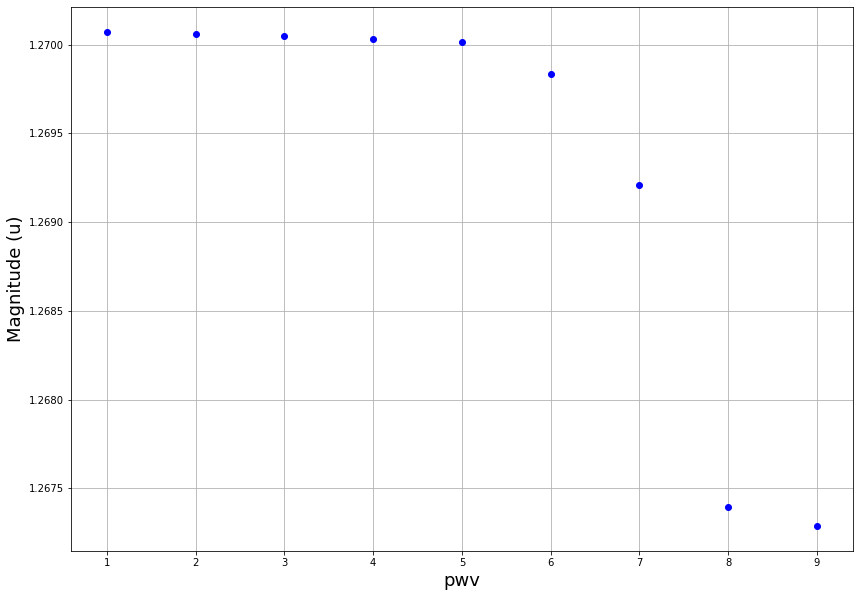

In [117]:
band = 'u'
plt.figure(figsize=(14,10))
plt.plot(atm_vals,mag_dict[test_type][test_spec][band],ls='',marker='o',color='b',label=band)
plt.grid()
plt.xlabel(variable_param,fontsize=18)
plt.ylabel('Magnitude ({0})'.format(band),fontsize=18)
#plt.legend(loc="best")

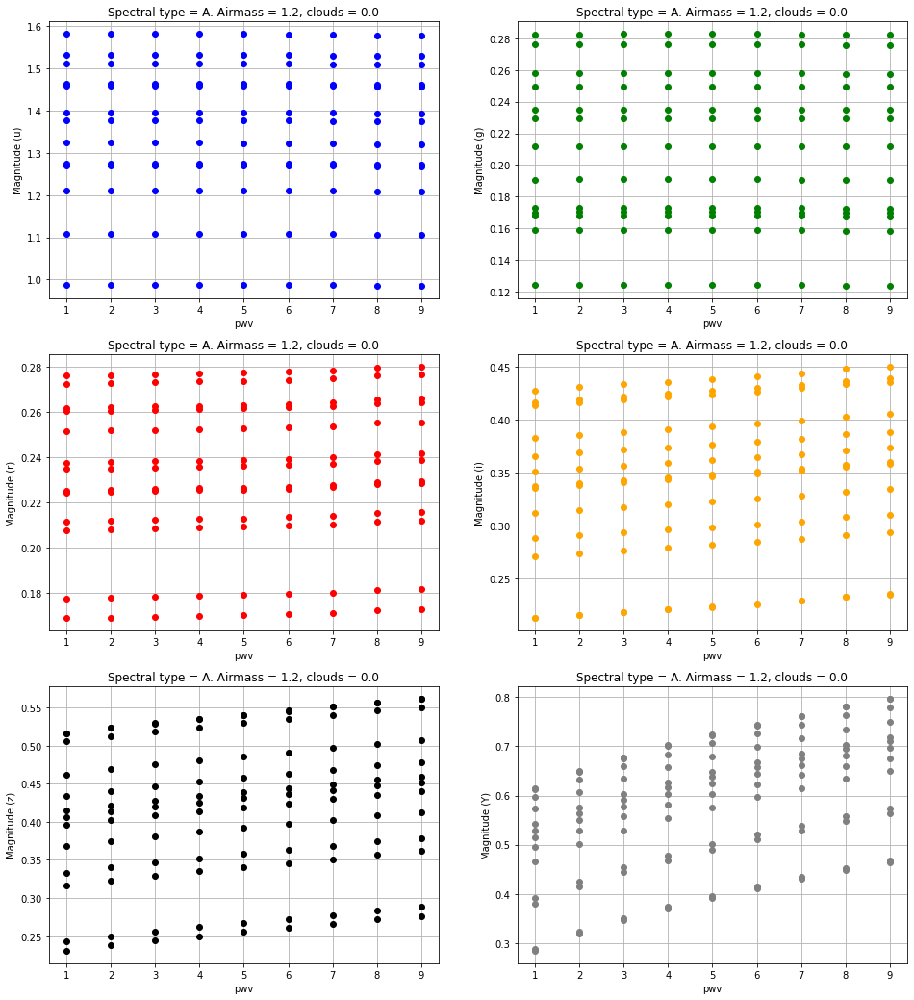

In [118]:
fig_rows = 3
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(16,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters):
            band = filters[i]
            for si in mag_dict[test_type]:
                axs[row,col].plot(atm_vals,mag_dict[test_type][si][band],ls='',marker='o',color=filter_colors[i])
            axs[row,col].grid()
            axs[row,col].set_xlabel(variable_param)
            axs[row,col].set_ylabel('Magnitude ({0})'.format(band))
            axs[row,col].set_title('Spectral type = {0}. Airmass = {1}, clouds = {2}'.format(test_type,am0,cloud0))
            i += 1
            

Now we do the same for the colours: 

Text(0, 0.5, 'u-g')

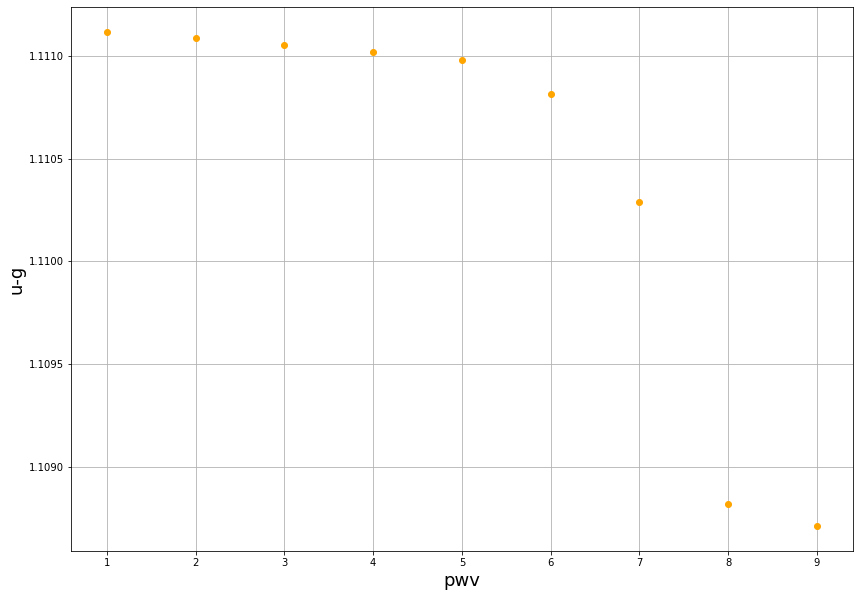

In [119]:
plt.figure(figsize=(14,10))
col = 'u-g'
color_ = colour_dict[test_type][test_spec][col]
plt.plot(atm_vals,color_,ls='',marker='o',color='orange')
plt.grid()
plt.xlabel(variable_param,fontsize=18)
plt.ylabel('{0}'.format(col),fontsize=18)

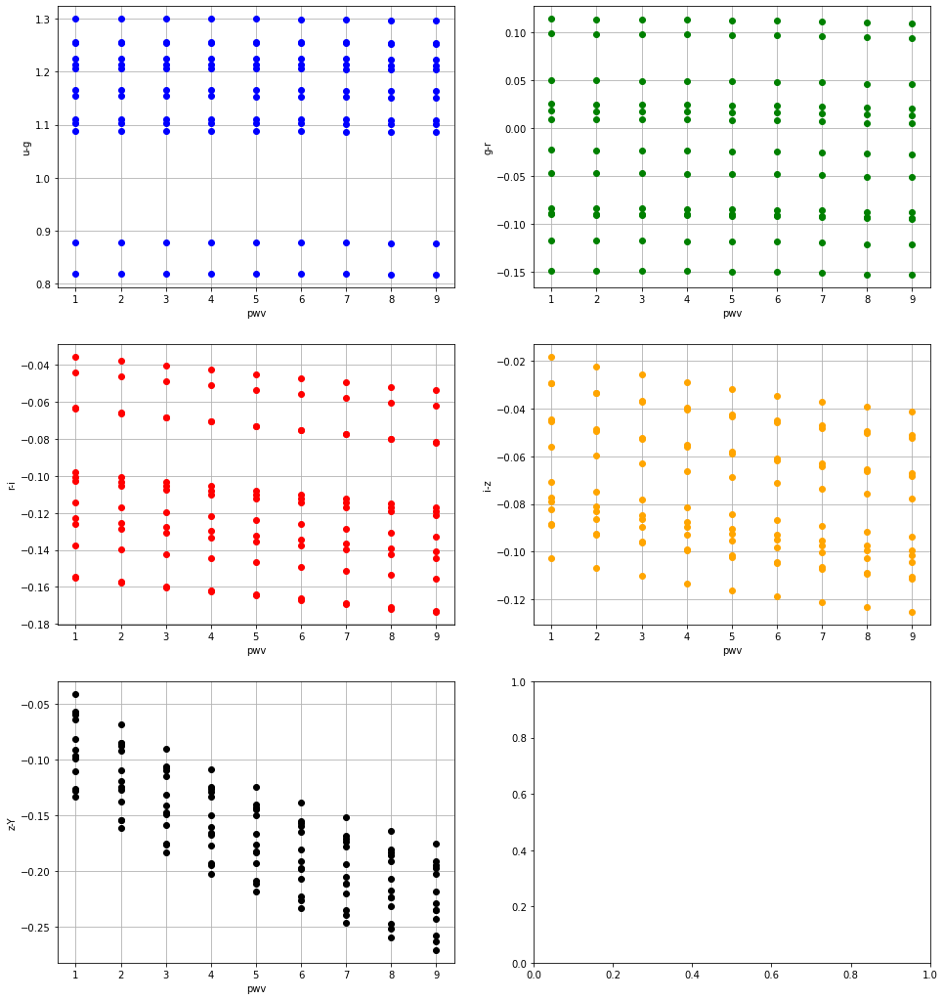

In [120]:
fig_rows = 3
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(16,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-1:
            c = '{0}-{1}'.format(filters[i],filters[i+1])
            for si in colour_dict[test_type]:
                axs[row,col].plot(atm_vals,colour_dict[test_type][si][c.lower()],ls='',marker='o',color=filter_colors[i])
            axs[row,col].grid()
            axs[row,col].set_xlabel(variable_param)
            axs[row,col].set_ylabel(c)
            #axs[row,col].legend()
            i += 1

Doing the same but with respect to the reference atmosphere, that is, $\Delta c = c - c_{ref}$: 

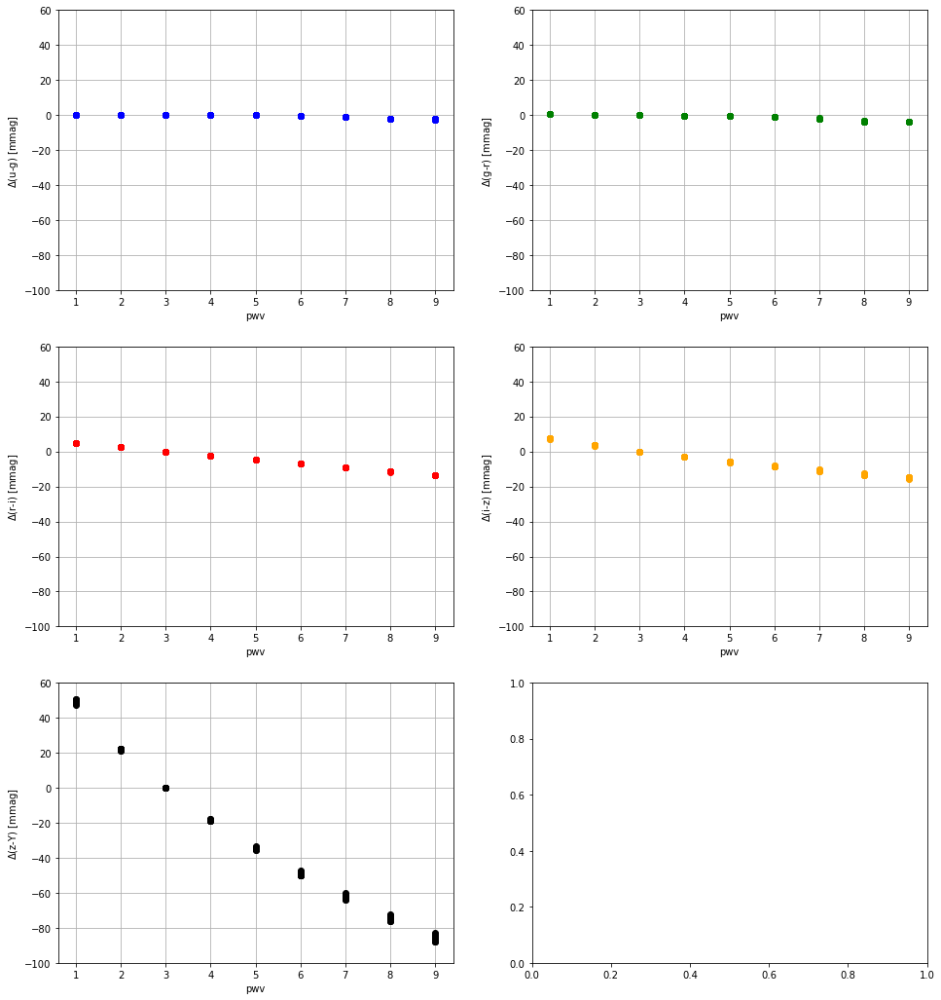

In [121]:
fig_rows = 3
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(16,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-1:
            c = '{0}-{1}'.format(filters[i],filters[i+1])
            for si in range(len(colour_dict[test_type])):
                #if si not in [15,16,17,18]:
                axs[row,col].plot(atm_vals,(colour_dict[test_type][si][c.lower()]-colour_dict_ref[test_type][si][c.lower()])*1000.,ls='',marker='o',color=filter_colors[i])
            
            axs[row,col].grid()
            axs[row,col].set_ylim(-100,60)
            axs[row,col].set_xlabel(variable_param)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+c+') [mmag]')
            #axs[row,col].legend()
            i += 1

# Evaluate the colour - colour plot as a function of the atmospheric parameter values 

Let's check first with the example spectrum: 

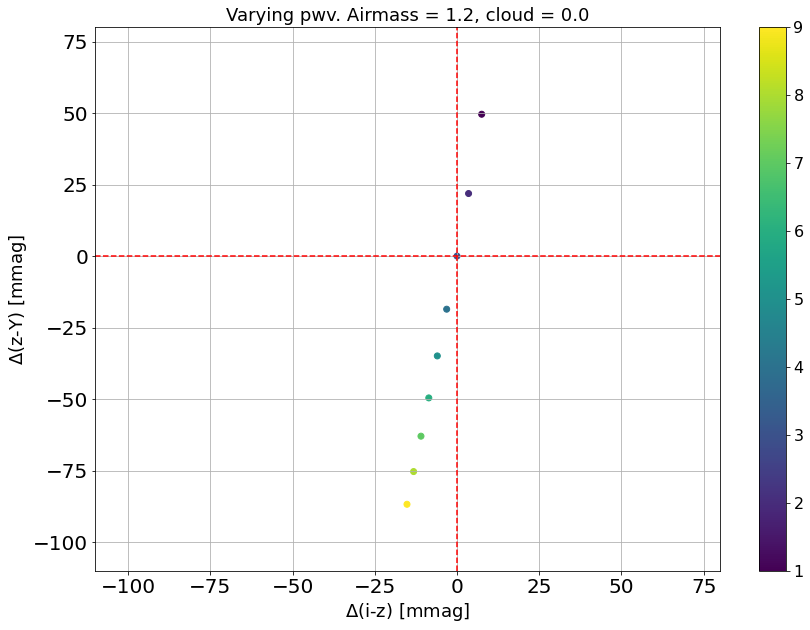

In [122]:
colorx = 'i-z'
colory = 'z-Y'
plt.figure(figsize=(14,10))
delta1 = (colour_dict[test_type][test_spec][colorx.lower()]-colour_dict_ref[test_type][test_spec][colorx.lower()])*1000.
delta2 = (colour_dict[test_type][test_spec][colory.lower()]-colour_dict_ref[test_type][test_spec][colory.lower()])*1000.
plt.scatter(delta1,delta2,c=atm_vals)
plt.axhline(y=0.,ls='--',color='r')
plt.axvline(x=0.,ls='--',color='r')
plt.grid()
plt.xlim(-110,80)
plt.ylim(-110,80)
#plt.xticks(fontsize=20,rotation=45,ha='right')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
plt.ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=16)
plt.title('Varying {0}. Airmass = {1}, cloud = {2}'.format(variable_param,am0,cloud0),fontsize=18)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_colour_colour_plot_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))

Select Delta_color ranges 

In [123]:
rangex = (-110,80)
rangey = (-110,80)

Now we evaluate the colour - colour plot for all spectra of the example spectral type: 

In [124]:
save_plot = True

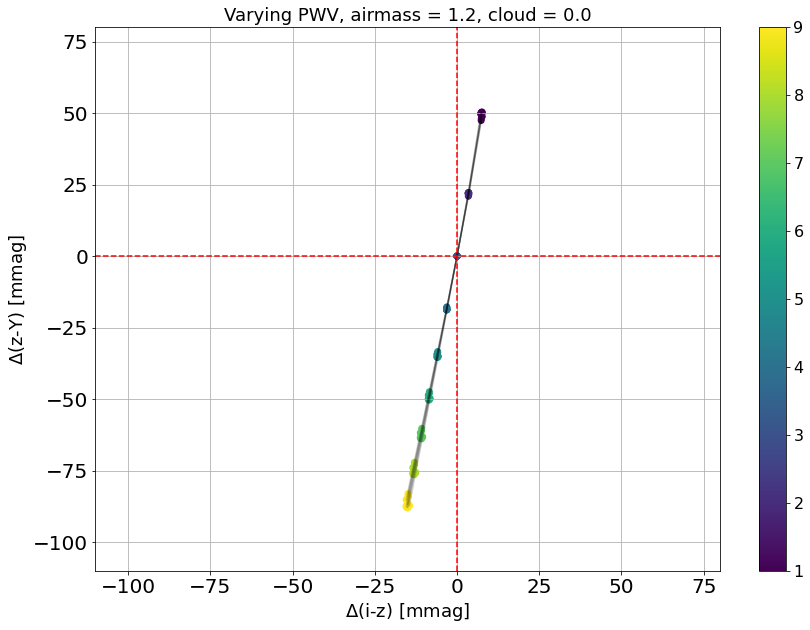

In [125]:
colorx = 'i-z'
colory = 'z-Y'
plt.figure(figsize=(14,10))
for si in colour_dict[test_type]:
    delta1 = (colour_dict[test_type][si][colorx.lower()]-colour_dict_ref[test_type][si][colorx.lower()])*1000.
    delta2 = (colour_dict[test_type][si][colory.lower()]-colour_dict_ref[test_type][si][colory.lower()])*1000.
    plt.plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
    plt.scatter(delta1,delta2,c=atm_vals)
plt.axhline(y=0.,ls='--',color='r')
plt.axvline(x=0.,ls='--',color='r')
plt.grid()
plt.xlim(rangex)
plt.ylim(rangey)
#plt.xticks(fontsize=20,rotation=45,ha='right')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
plt.ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=16)
#plt.title('Spectral type: {0}. Number of spectra = {1}'.format(test_type,len(colour_dict[test_type].keys())),fontsize=16)
if save_plot:
    if variable_param=='airmass' or variable_param=='cloud':
        plt.title('Varying {0}'.format(variable_param.upper()),fontsize=18)
    else:
        plt.title('Varying {0}, airmass = {1}, cloud = {2}'.format(variable_param.upper(),am0,cloud0),fontsize=18)
    if variable_param=='airmass' or variable_param=='cloud':
        plt.savefig(os.path.join(outdir_plots,'spectral_type_{0}_colour_colour_plot_varying{1}.png'.format(test_type,variable_param)))
    else:
        plt.savefig(os.path.join(outdir_plots,'spectral_type_{0}_colour_colour_plot_varying_{1}_airmass_{2}_cloud_{3}.png'.format(test_type,variable_param,am0,cloud0)))


Let's evaluate the same colour - colour plot for the different spectral types: 

O
B
A
F
G
K
M


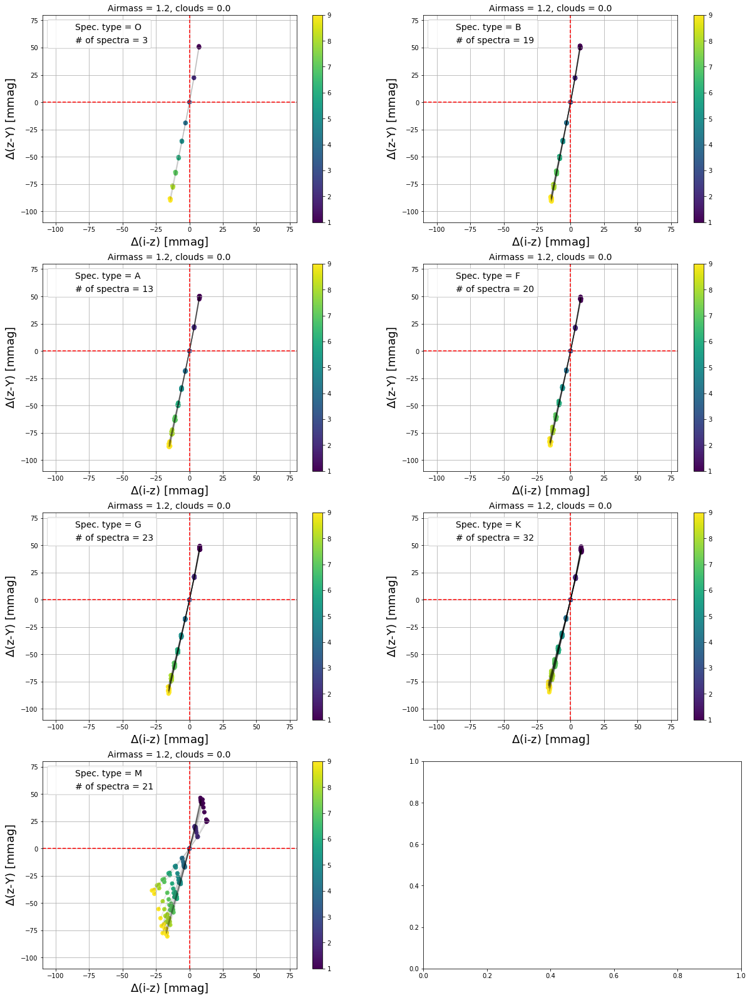

In [126]:
colorx = 'i-z'
colory = 'z-Y'

fig_rows = 4
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,28))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(spectral_types):
            spec_type = spectral_types[i]
            print(spec_type)
            
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][colorx.lower()]-colour_dict_ref[spec_type][si][colorx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][colory.lower()]-colour_dict_ref[spec_type][si][colory.lower()])*1000.
                if si==0:
                    im = axs[row,col].scatter(delta1,delta2,c=atm_vals)
                else:
                    axs[row,col].scatter(delta1,delta2,c=atm_vals)
                axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            axs[row,col].plot([],[],ls='',label='Spec. type = {0}'.format(spec_type))
            axs[row,col].plot([],[],ls='',label='# of spectra = {0}'.format(len(colour_dict[spec_type].keys())))
            axs[row,col].set_xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
            axs[row,col].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            i += 1


Now we evaluate the different colour - colour plots for the example spectral type: 

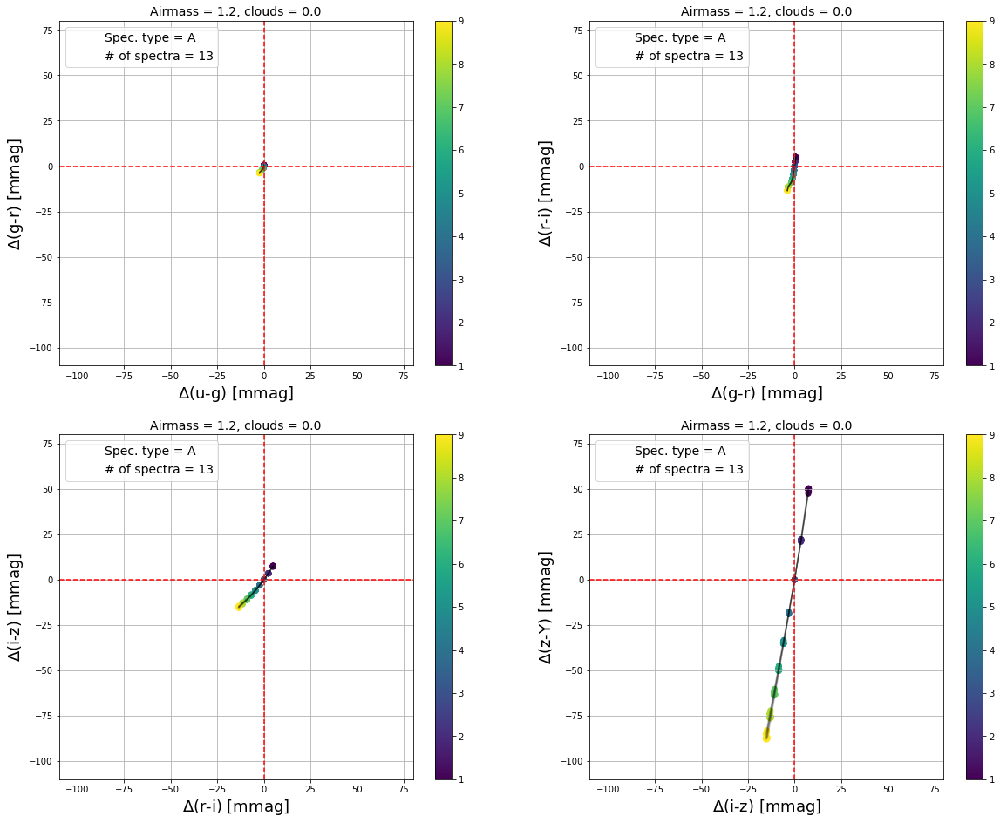

In [127]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for si in colour_dict[test_type]:
                delta1 = (colour_dict[test_type][si][cx.lower()]-colour_dict_ref[test_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[test_type][si][cy.lower()]-colour_dict_ref[test_type][si][cy.lower()])*1000.
                if si==0:
                    im = axs[row,col].scatter(delta1,delta2,c=atm_vals)
                else:
                    axs[row,col].scatter(delta1,delta2,c=atm_vals)
                axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            #axs[row,col].set_xlim(-0.012,0.021)
            #axs[row,col].set_ylim(-0.065,0.126)
            axs[row,col].plot([],[],ls='',label='Spec. type = {0}'.format(test_type))
            axs[row,col].plot([],[],ls='',label='# of spectra = {0}'.format(len(colour_dict[test_type].keys())))
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            i += 1

We also evaluate the dependency of the colours with the atmospheric parameters for each spectral type: 

In [128]:
type_markers = {'O':'s','B':'x','A':'o','F':'v','G':'^','K':'P','M':'*'}

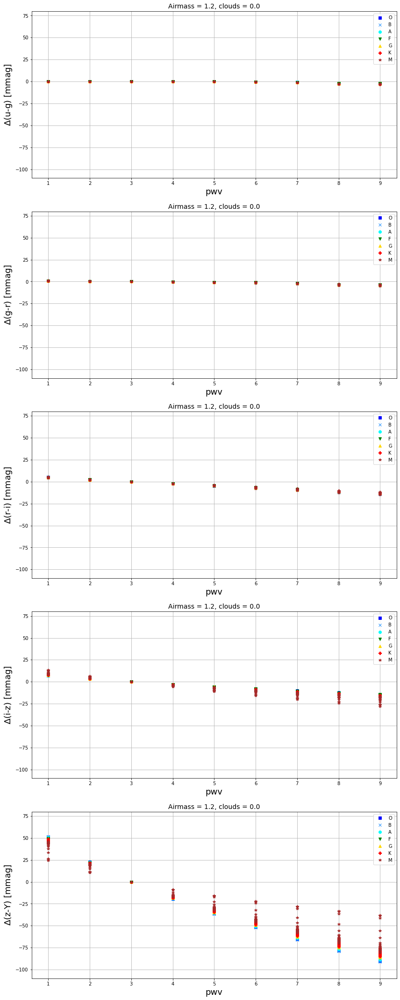

In [129]:
fig_rows = len(filters)-1
fig_cols = 1
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(14,38))
for row in range(fig_rows):
    c = '{0}-{1}'.format(filters[row],filters[row+1])
    for spec_type in spectral_types:
        for si in mag_dict[spec_type]:
            delta_c_ = (colour_dict[spec_type][si][c.lower()]-colour_dict_ref[spec_type][si][c.lower()])*1000.
            axs[row].plot(atm_vals,delta_c_,ls='',marker=type_markers[spec_type],color=type_colors[spec_type])
        axs[row].plot([],[],ls='',marker=type_markers[spec_type],color=type_colors[spec_type],label = spec_type)
    axs[row].set_ylim(rangey)
    axs[row].grid()
    axs[row].set_xlabel(variable_param,fontsize=18)
    axs[row].set_ylabel(r'$\Delta$'+'('+c+') [mmag]',fontsize=18)
    axs[row].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
    axs[row].legend()
plt.savefig(os.path.join(outdir_plots,'delta_colours_vs_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))
    

Let's have a look now at the colour-colour plots for all spectral types together 

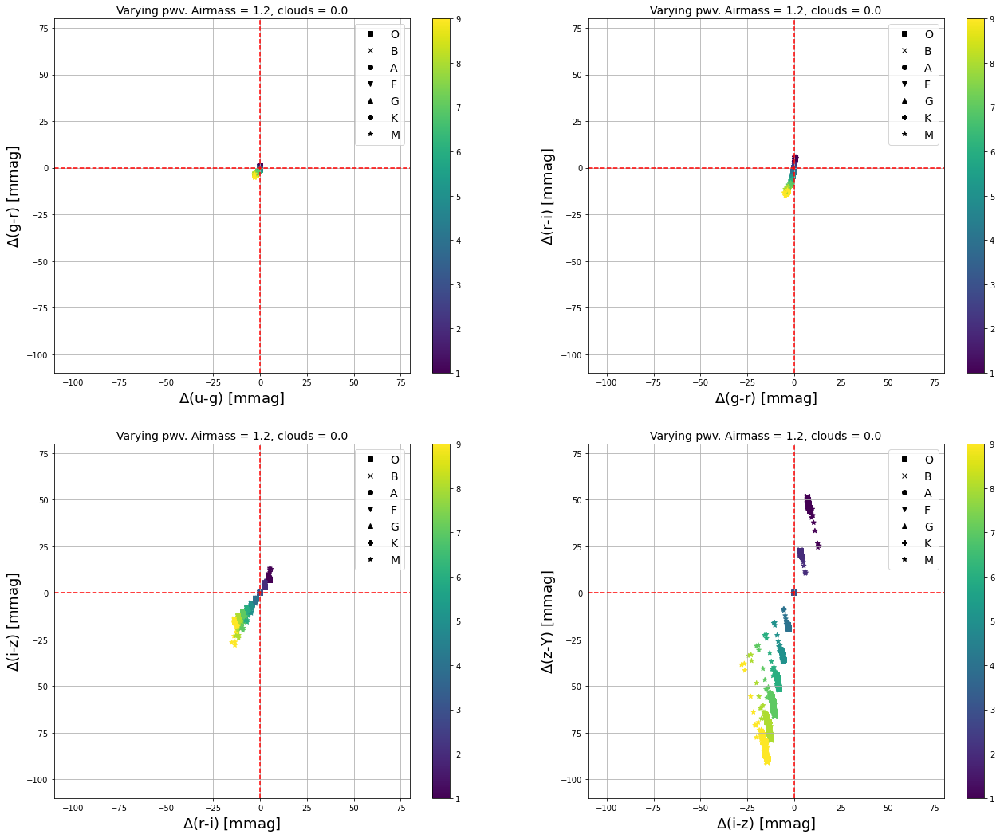

In [130]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(22,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for spec_type in spectral_types:
                for si in colour_dict[spec_type]:
                    delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    if sed_==0:
                        im = axs[row,col].scatter(delta1,delta2,c=atm_vals,marker=type_markers[spec_type])
                    else:
                        axs[row,col].scatter(delta1,delta2,c=atm_vals,marker=type_markers[spec_type])
                    #axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
                axs[row,col].plot([],[],c='k',ls='',marker=type_markers[spec_type],label=spec_type)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            #axs[row,col].set_xlim(-21.,33.)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            i += 1
plt.savefig(os.path.join(outdir_plots,'colour_colour_plots_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

An alternative way of plotting this: 

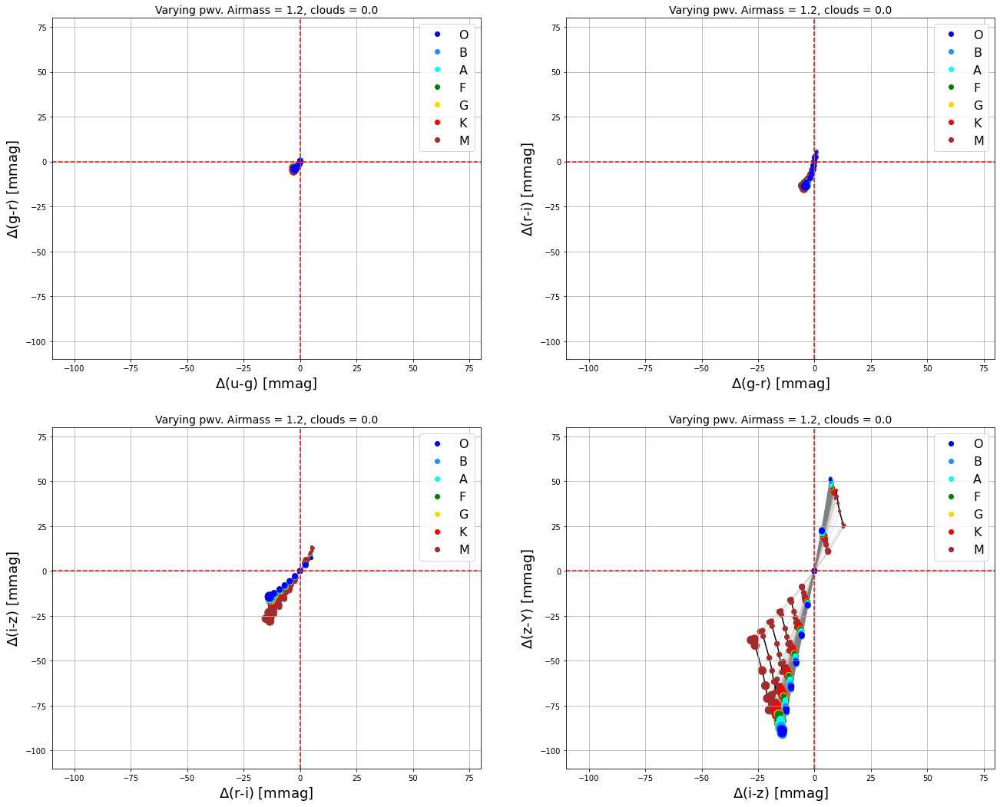

In [131]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(22,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            iso_vals1 = []
            iso_vals2 = []
            for spec_type in spectral_types[::-1]:
                for si in colour_dict[spec_type]:
                    delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    msize = [10.]
                    msize = msize+[40.]*(len(delta1)-2)
                    msize.append(110.)
                    
                    iso_vals1.append(delta1)
                    iso_vals2.append(delta2)
                    
                    axs[row,col].scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                    axs[row,col].plot(delta1,delta2,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
            for spec_type in spectral_types:
                axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
                
            iso_vals1 = np.array(iso_vals1)
            iso_vals2 = np.array(iso_vals2)
            for val in range(iso_vals1.shape[1]):
                #print(iso_vals1[:,val])
                sort_index = np.argsort(iso_vals1[:,val])
                axs[row,col].plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            #axs[row,col].set_xlim(-21.,33.)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=16)
            i += 1
            
plt.savefig(os.path.join(outdir_plots,'colour_colour_plots_varying_{0}_airmass_{1}_clouds_{2}_v2.png'.format(variable_param,am0,cloud0)))

Plot and save them individually: 

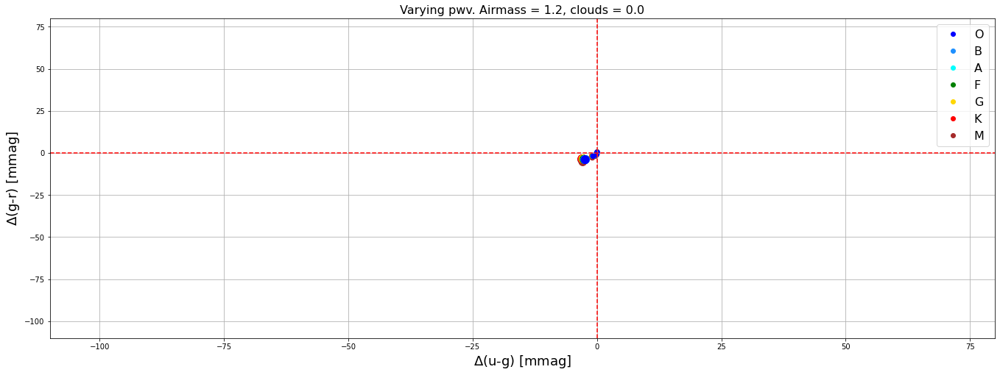

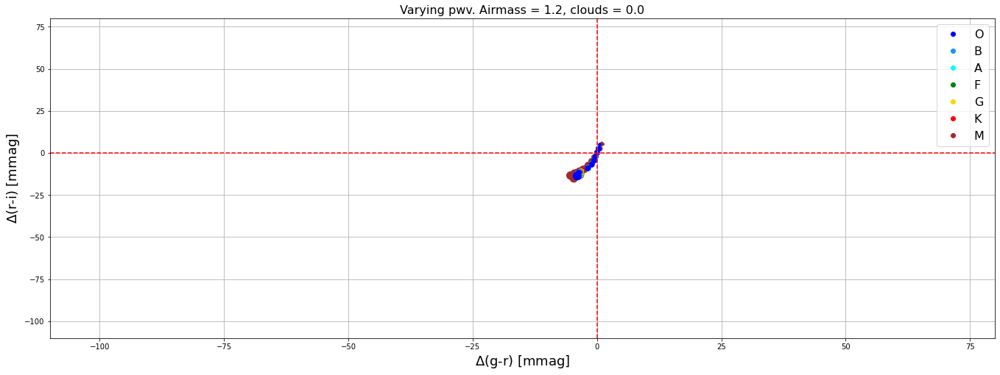

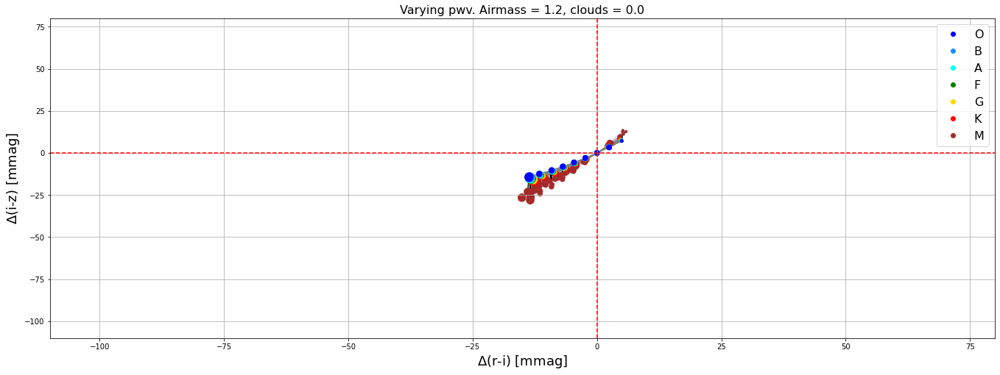

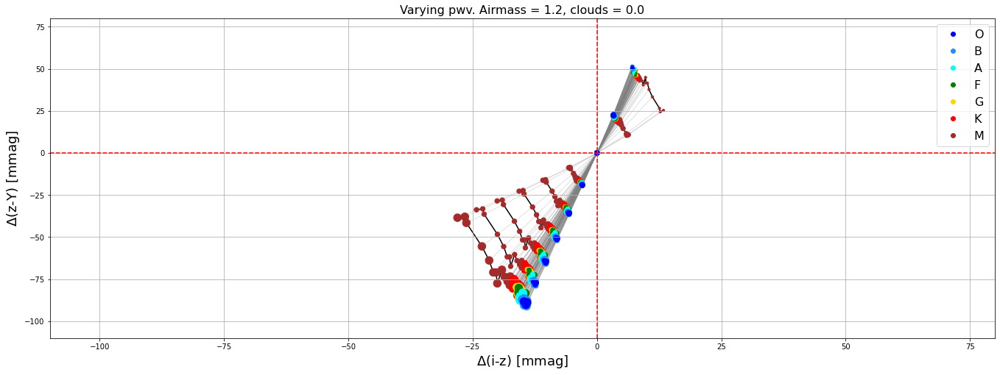

In [132]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(23,8))
    if i<len(filters)-2:
        cx = '{0}-{1}'.format(filters[i],filters[i+1])
        cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangex)
        #axs.set_xlim(-50,30)
        axs.set_ylim(rangey)
        #axs.set_ylim(-140,90)
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=16)
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0,cx,cy)))

Now we look at the same information but restricted to the most extreme atmospheric parameter values: 

u
g
r
i
z
Y
photlam


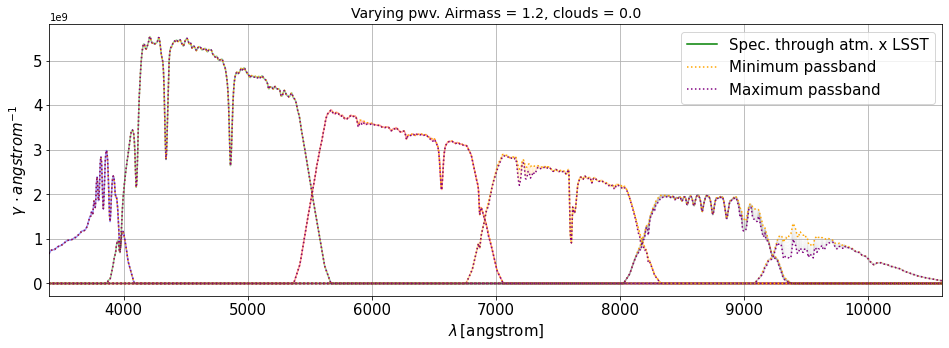

In [133]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)

for index,filter in enumerate(obstotal_dict.keys()):
    print(filter)
    for obs in obstotal_dict[filter]:
        ax.plot(obs.binwave,obs.binflux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.05)
    ax.plot(obstotal_dict[filter][min_ind_].binwave,obstotal_dict[filter][min_ind_].binflux*Seff*exptime,ls=':',color='orange')
    ax.plot(obstotal_dict[filter][max_ind_].binwave,obstotal_dict[filter][max_ind_].binflux*Seff*exptime,ls=':',color='purple')
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.plot([],[],ls='-',color='g',label='Spec. through atm. x LSST')
plt.plot([],[],ls=':',color='orange',label='Minimum passband')
plt.plot([],[],ls=':',color='purple',label='Maximum passband')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_min_max_total_passband_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))
print(spec.fluxunits)

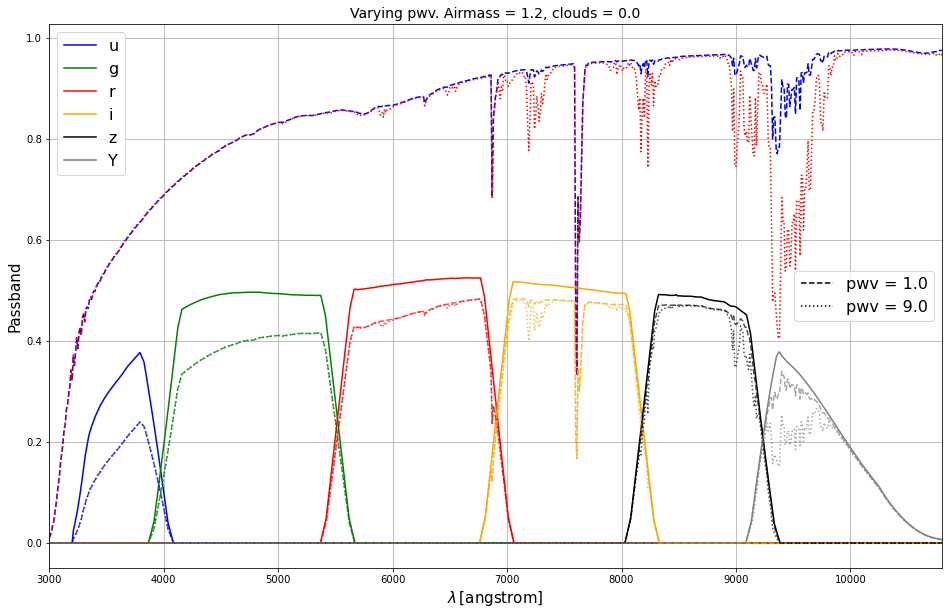

In [134]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
legend_lines1 = []
for index,bp in enumerate(lsst_bp):
    line_, = ax.plot(bp.wave,bp.throughput,label=filter_names[index],color=filter_colors[index])
    legend_lines1.append(line_)

ax.plot(atm_transp[min_ind_].wave,atm_transp[min_ind_].throughput,ls='--',alpha=1.0,color='b')
ax.plot(atm_transp[max_ind_].wave,atm_transp[max_ind_].throughput,ls=':',alpha=1.0,color='r')

for index,bpname in enumerate(filters):
    ax.plot(total_passband[bpname][min_ind_].wave,total_passband[bpname][min_ind_].throughput,ls='--',color=filter_colors[index],alpha=0.7)
    ax.plot(total_passband[bpname][max_ind_].wave,total_passband[bpname][max_ind_].throughput,ls=':',color=filter_colors[index],alpha=0.7)        
line1, = plt.plot([],[],ls='--',color='k',label='{0} = {1}'.format(variable_param,min_val_))
line2, = plt.plot([],[],ls=':',color='k',label='{0} = {1}'.format(variable_param,max_val_))
legend_lines2 = [line1,line2]
plt.xlim(3000.,10800.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Passband',fontsize=15)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
legend1 = plt.legend(handles=legend_lines1,fontsize=16,loc="upper left")
plt.gca().add_artist(legend1)
plt.legend(handles=legend_lines2,fontsize=16,loc="center right")
plt.savefig(os.path.join(outdir_plots,'total_passbands_min_max_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))

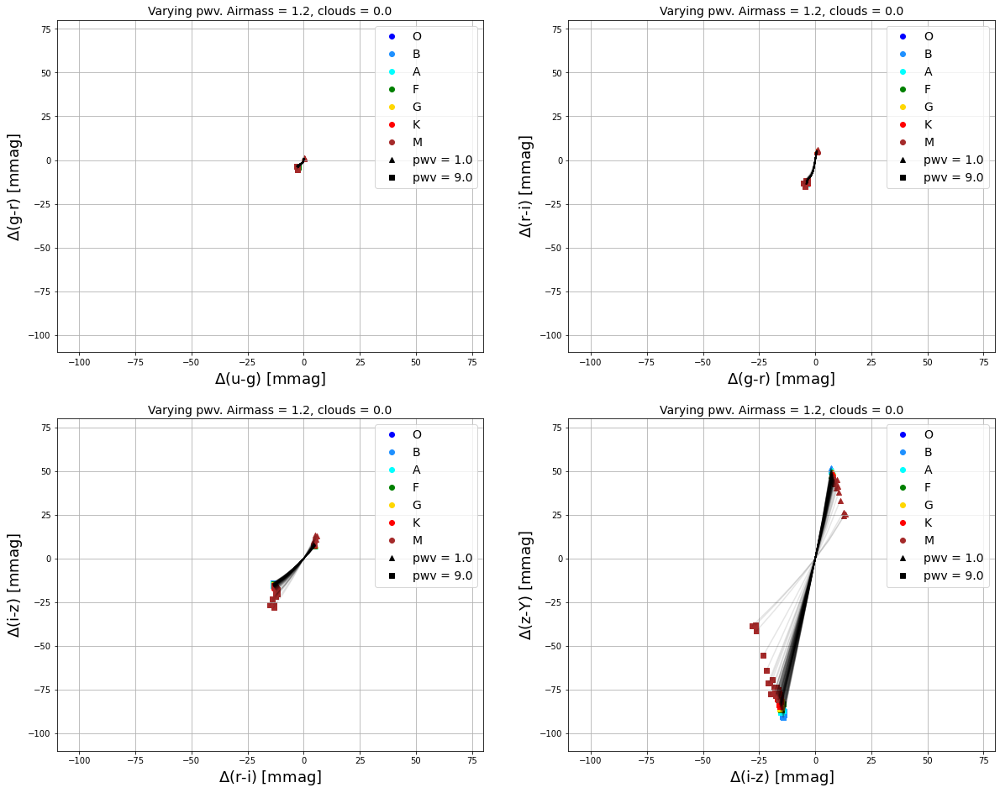

In [135]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for spec_type in spectral_types:
                for si in colour_dict[spec_type]:
                    delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    
                    delta1_min = (colour_dict[spec_type][si][cx.lower()][min_ind_]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2_min = (colour_dict[spec_type][si][cy.lower()][min_ind_]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    
                    delta1_max = (colour_dict[spec_type][si][cx.lower()][max_ind_]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2_max = (colour_dict[spec_type][si][cy.lower()][max_ind_]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    
                    axs[row,col].scatter(delta1_min,delta2_min,c=type_colors[spec_type],marker='^')
                    axs[row,col].scatter(delta1_max,delta2_max,c=type_colors[spec_type],marker='s')
                    axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
                axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            axs[row,col].plot([],[],ls='',marker='^',color='k',label='{0} = {1}'.format(variable_param,atm_vals[min_ind_]))
            axs[row,col].plot([],[],ls='',marker='s',color='k',label='{0} = {1}'.format(variable_param,atm_vals[max_ind_]))
            #axs[row,col].axhline(y=0.,ls='--',color='r')
            #axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            #axs[row,col].set_xlim(-21.,33.)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=14)
    
            i += 1

plt.savefig(os.path.join(outdir_plots,'colour_colour_plots_min_max_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

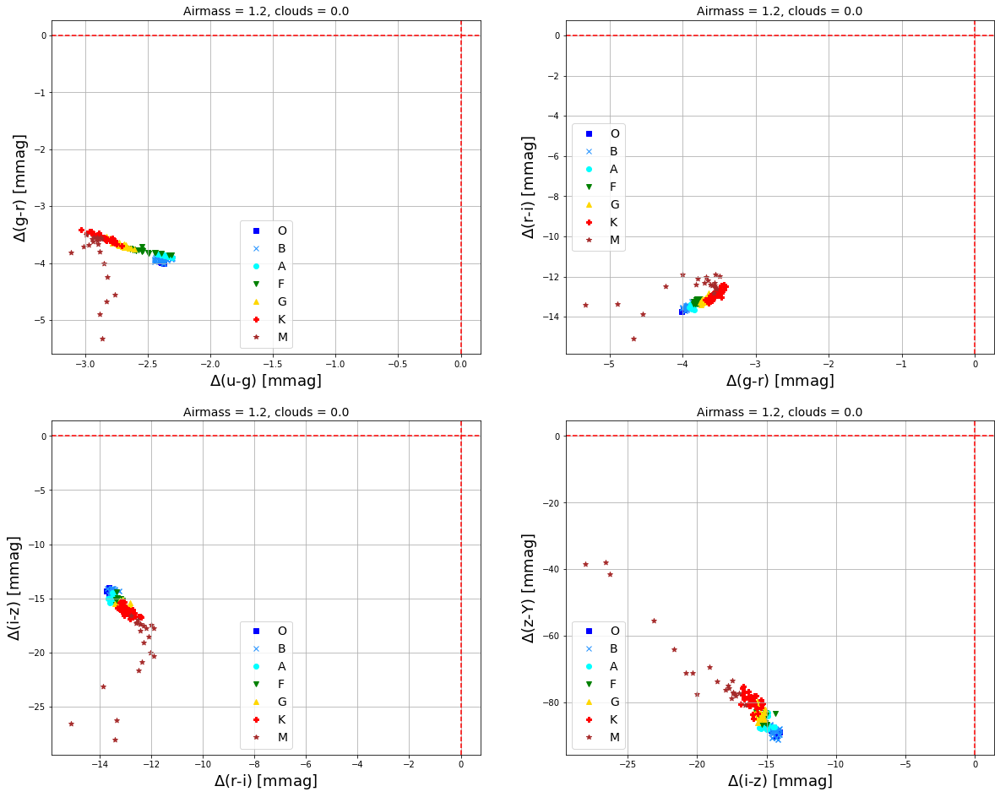

In [136]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for spec_type in spectral_types:
                for si in colour_dict[spec_type]:
                    delta1_max = (colour_dict[spec_type][si][cx.lower()][max_ind_]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2_max = (colour_dict[spec_type][si][cy.lower()][max_ind_]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    
                    axs[row,col].scatter(delta1_max,delta2_max,c=type_colors[spec_type],marker=type_markers[spec_type])
                axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker=type_markers[spec_type],label=spec_type)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=14)
            
            i += 1

We exclude the M type spectra for more clarity: 

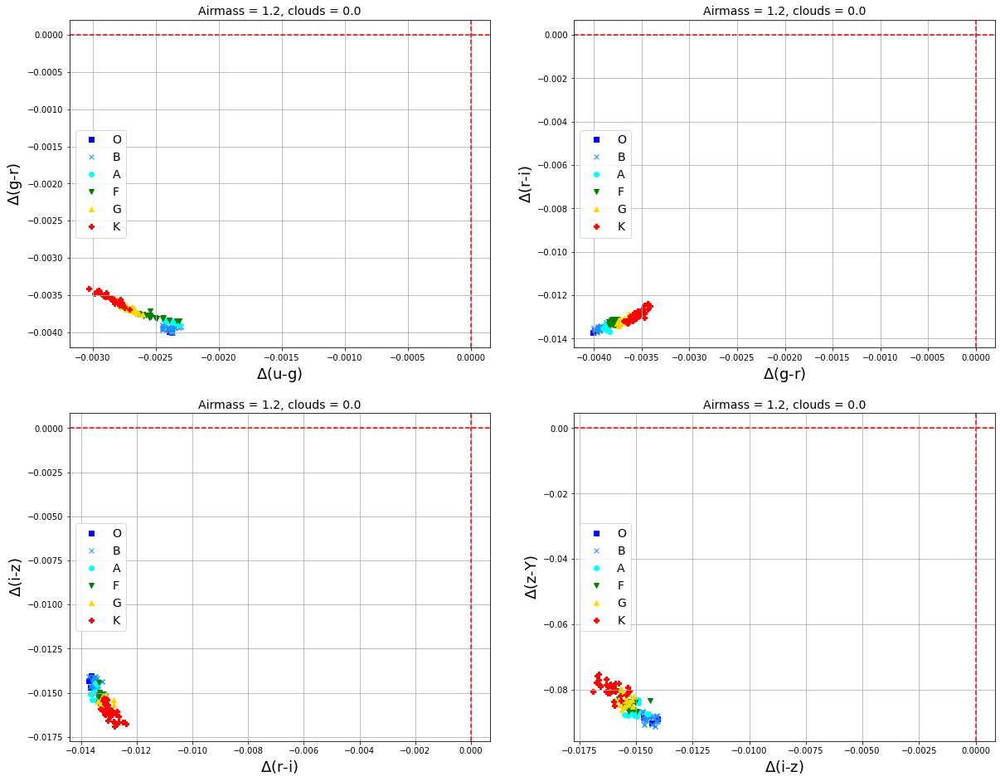

In [137]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for spec_type in spectral_types[:-1]:
                for si in colour_dict[spec_type]:
                    delta1_max = colour_dict[spec_type][si][cx.lower()][max_ind_]-colour_dict_ref[spec_type][si][cx.lower()]
                    delta2_max = colour_dict[spec_type][si][cy.lower()][max_ind_]-colour_dict_ref[spec_type][si][cy.lower()]
                    
                    axs[row,col].scatter(delta1_max,delta2_max,c=type_colors[spec_type],marker=type_markers[spec_type])
                axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker=type_markers[spec_type],label=spec_type)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+')',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+')',fontsize=18)
            axs[row,col].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=14)
            
            i += 1

# Make 3D colour plot 

To see an interactive version of the following plot, see notebook "03_spectrum_ThroughAtmLSST_3Dcolor_plot.ipynb" 

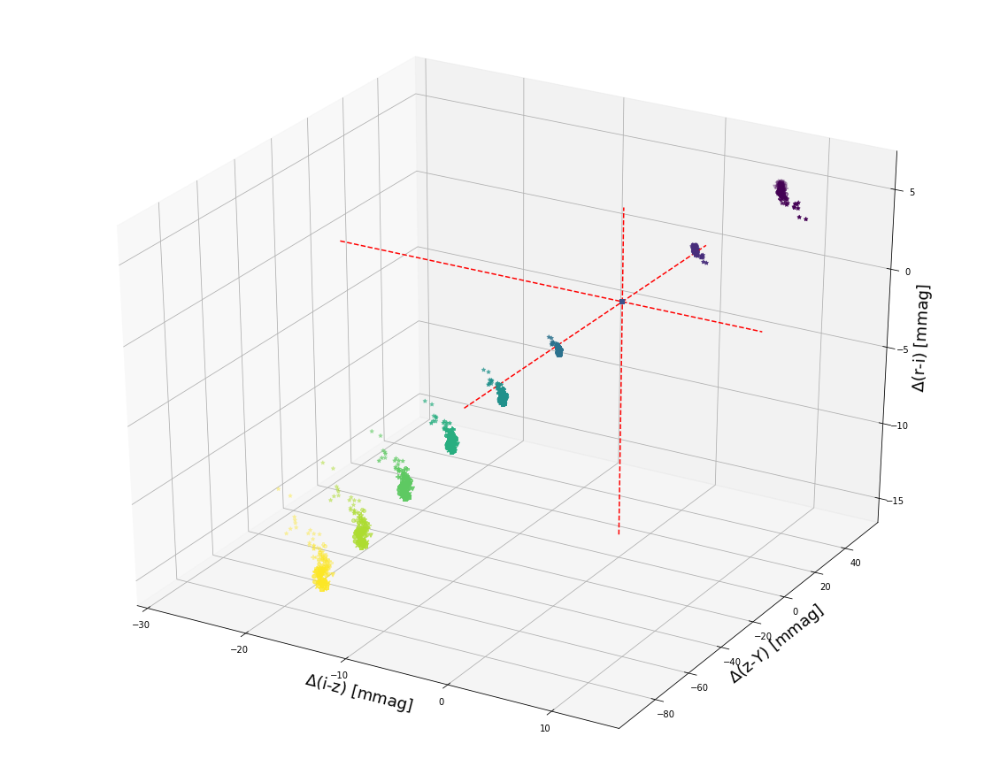

In [138]:
colorx = 'i-z'
colory = 'z-Y'
colorz = 'r-i'

fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(projection='3d')

minx, maxx = [], []
miny, maxy = [], []
minz, maxz = [], []
for spec_type in spectral_types:
    for si in colour_dict[spec_type]:
        delta1 = (colour_dict[spec_type][si][colorx.lower()]-colour_dict_ref[spec_type][si][colorx.lower()])*1000.
        delta2 = (colour_dict[spec_type][si][colory.lower()]-colour_dict_ref[spec_type][si][colory.lower()])*1000.
        delta3 = (colour_dict[spec_type][si][colorz.lower()]-colour_dict_ref[spec_type][si][colorz.lower()])*1000.

        ax.scatter(delta1,delta2,delta3,c=atm_vals,marker=type_markers[spec_type])
        minx.append(np.min(delta1))
        miny.append(np.min(delta2))
        minz.append(np.min(delta3))
        maxx.append(np.max(delta1))
        maxy.append(np.max(delta2))
        maxz.append(np.max(delta3))

ax.set_xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
ax.set_ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
ax.set_zlabel(r'$\Delta$'+'('+colorz+') [mmag]',fontsize=18)

xrange = np.linspace(np.min(minx),np.max(maxx),100)
yrange = np.linspace(np.min(miny),np.max(maxy),100)
zrange = np.linspace(np.min(minz),np.max(maxz),100)

ax.plot(xrange,np.zeros(len(yrange)),np.zeros(len(zrange)),'r--')
ax.plot(np.zeros(len(xrange)),yrange,np.zeros(len(zrange)),'r--')
ax.plot(np.zeros(len(xrange)),np.zeros(len(yrange)),zrange,'r--')


# Calculate colour evolution for SNe Ia spectra 

We use the SNe Ia spectra from https://github.com/rhiannonlynne/photometry_sample/tree/main/sn 

In [139]:
sne_path = 'data/SNIa_spectra/'
sn1_data = np.loadtxt(os.path.join(sne_path,'sn1a_10.0.dat'))
sn2_data = np.loadtxt(os.path.join(sne_path,'sn1a_15.0.dat'))
sn3_data = np.loadtxt(os.path.join(sne_path,'sn1a_20.0.dat'))

The wavelengths are in nm and the fluxes in erg/s/cm2/nm, so we need to change the units to angstrom and photlam = #photons/s/cm2/angstrom (pysynphot assumes that the input fluxes are in photlam). For this, we need to remember that the conversion between flam (erg/s/cm2/angstrom) and photlam is given by 

$$ photlam = \frac{\lambda}{h \cdot c} flam $$

In [140]:
sn1wave = sn1_data[:,0]*10.
sn2wave = sn2_data[:,0]*10.
sn3wave = sn3_data[:,0]*10.

sn1flux = sn1_data[:,1]*sn1wave/(h_planck*c_light)
sn2flux = sn2_data[:,1]*sn2wave/(h_planck*c_light)
sn3flux = sn3_data[:,1]*sn3wave/(h_planck*c_light)

In [141]:
sn1 = S.ArraySpectrum(sn1wave,sn1flux,name='sn1a_10.0')
sn2 = S.ArraySpectrum(sn2wave,sn2flux,name='sn1a_15.0')
sn3 = S.ArraySpectrum(sn3wave,sn3flux,name='sn1a_20.0')

In [142]:
sn1.waveunits, sn1.fluxunits

(<pysynphot.units.Angstrom at 0x7fa844edf7f0>,
 <pysynphot.units.Photlam at 0x7fa844168970>)

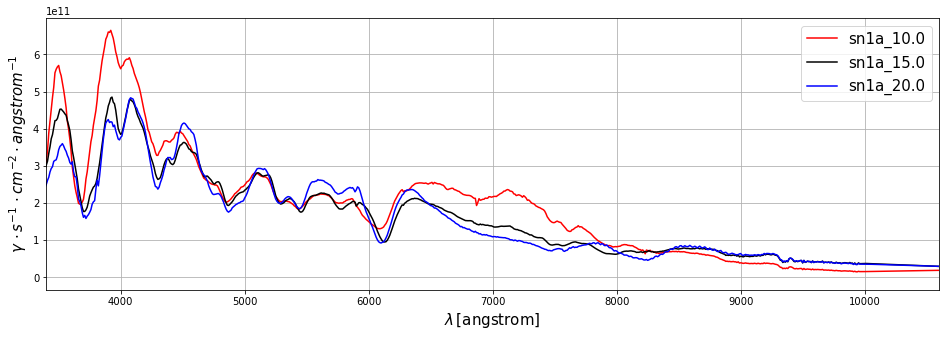

In [143]:
fig=plt.figure(figsize=(16,5))
plt.plot(sn1.wave,sn1.flux,color='r',label=sn1.name)
plt.plot(sn2.wave,sn2.flux,color='k',label=sn2.name)
plt.plot(sn3.wave,sn3.flux,color='b',label=sn3.name)
plt.xlim(WLMIN,WLMAX)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot s^{-1} \, \cdot cm^{-2} \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=15)

Now we pass the SNIa spectra through the total passbands, as with the calibration spectra 

In [144]:
sn_list = [sn1,sn2,sn3]

In [145]:
# SNe Ia through atm x throughput 
sn_obs_dict = {}
for si,spec in enumerate(sn_list):
    filter_dict_ = {}
    for filter in filters:
        filter_dict_[filter] = []
        for i in range(n_sim):
            obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
            filter_dict_[filter].append(obs_spec)
    sn_obs_dict[si] = filter_dict_ 


((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [146]:
print(len(sn_obs_dict.keys()))
print(len(sn_obs_dict[0].keys()))
print(len(sn_obs_dict[0]['u']))

3
6
9


In [147]:
# SNe Ia only through throughput (as if telescope was in space) 
sn_obs_dict_t = {}
for si,spec in enumerate(sn_list):
    filter_dict_ = {}
    for filter in lsst_bp:
        obs_spec_t = S.Observation(spec,filter,force='taper')
        filter_dict_[filter.name] = obs_spec_t
    sn_obs_dict_t[si] = filter_dict_ 
    

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

In [148]:
print(len(sn_obs_dict_t.keys()))
print(len(sn_obs_dict_t[0].keys()))
print(sn_obs_dict_t[0]['u'].flux)

3
6
[0. 0. 0. ... 0. 0. 0.]


Text(0.5, 1.0, 'Varying pwv. Airmass = 1.2, clouds = 0.0')

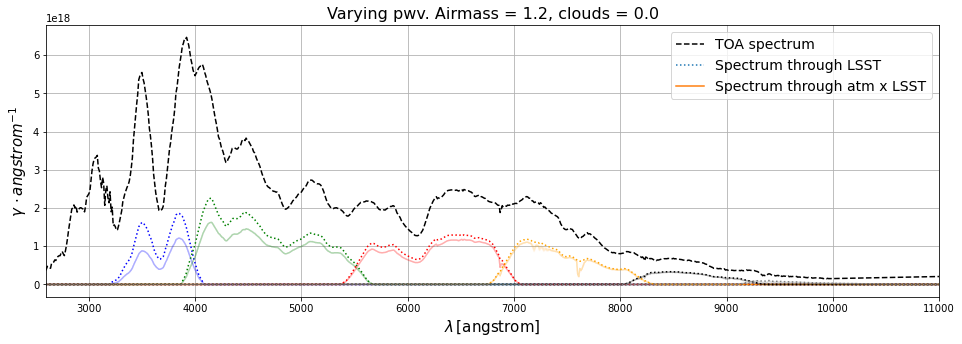

In [149]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn_list[0].wave,sn_list[0].flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = sn_obs_dict[0][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)

We zoom in to see the effect of the different atmospheric transparencies 

Text(0.5, 1.0, 'Varying pwv. Airmass = 1.2, clouds = 0.0')

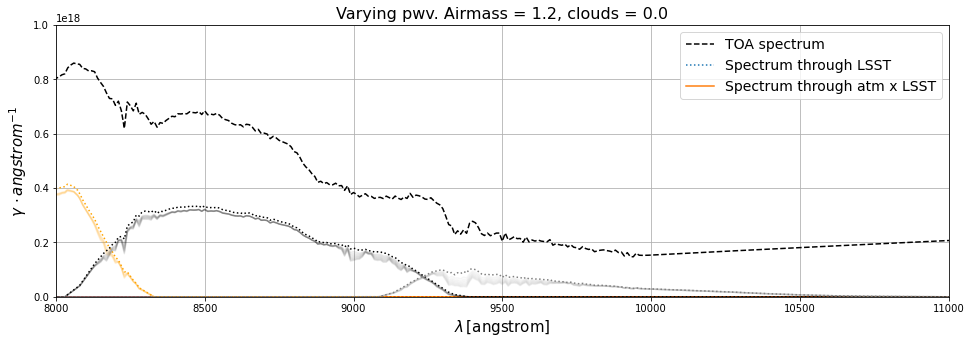

In [150]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn_list[0].wave,sn_list[0].flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = sn_obs_dict[0][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.07)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(8000.,11000.)
plt.ylim(0,1e18)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)

We can now calculate the magnitudes and colours 

In [151]:
# Magnitudes of spectra passing through atm x throughput 
sn_mag_dict = {}
sn_mag_dict_ref = {}
sn_mag_err_dict = {}
sn_mag_err_dict_ref = {}
for si,obs_spec_ in enumerate(sn_list):
    mag_dict_ = {}
    mag_dict_ref_ = {}
    mag_err_dict_ = {}
    mag_err_dict_ref_ = {}
    for fi,filter in enumerate(filters):
        mag_dict_[filter] = []
        mag_err_dict_[filter] = []
        for i in range(n_sim):
            #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
            if calc_mag_err:
                mag_ab_, mag_err_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],return_error=True)
                mag_err_dict_[filter].append(mag_err_ab_)
            else:
                mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
            mag_dict_[filter].append(mag_ab_)
            
        #mag_dict[sed_] = mag_dict_
        
        if calc_mag_err:
            mag_ab_, mag_err_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],return_error=True)
            mag_err_dict_ref_[filter] = mag_err_ab_
        else:
            mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
        mag_dict_ref_[filter] = mag_ab_
    sn_mag_dict[si] = mag_dict_
    sn_mag_dict_ref[si] = mag_dict_ref_
    sn_mag_err_dict[si] = mag_err_dict_
    sn_mag_err_dict_ref[si] = mag_err_dict_ref_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 4.99e+20
Numerator = 4.99e+20
Variance of the numerator = 8.69e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.52112292199489
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 4.99e+20
Numerator = 4.99e+20
Variance of the numerator = 8.69e+19

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.814250996533143
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 1.30e+21
Numerator = 1.30e+21
Variance of the numerator = 5.60e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.8139159861307
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 2.57e+20
Numerator = 2.57e+20
Variance of the numerator = 1.07e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -19.80198297998725
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 2.63e+20
Numerator = 2.63e+20
Variance of the numerator = 1.11e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -19.829193915811

Denominator = 8.22e+12
AB magnitude =  -20.71473431113978
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 1.59e+21
Numerator = 1.59e+21
Variance of the numerator = 5.77e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.714716840092436
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons

((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 5.61e+20
Numerator = 5.61e+20
Variance of the numerator = 2.41e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.227002524061177
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 5.60e+20
Numerator = 5.60e+20
Variance of the numerator = 2.40e+20
(i) does not have a defined binset in 

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 3.40e+20
Numerator = 3.40e+20
Variance of the numerator = 5.77e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.10280056820967
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 3.40e+20
Numerator = 3.40e+20
Variance of the numerator = 5.77e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.102815906867

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.15e+21
Numerator = 1.15e+21
Variance of the numerator = 4.90e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.676914582413662
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.15e+21
Numerator = 1.15e+21
Variance of the numerator = 4.93e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.68048969821

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.04e+20
Numerator = 1.04e+20
Variance of the numerator = 2.16e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.497421744226543
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.02e+20
Numerator = 1.02e+20
Variance of the numerator = 2.07e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.47690455374

In [152]:
print(len(sn_mag_dict.keys()))
print(len(sn_mag_dict[0].keys()))
print(len(sn_mag_dict[0]['u']))

3
6
9


In [153]:
sn_colour_dict = {}
sn_colour_err_dict = {}
for sn in sn_mag_dict.keys():
    c_dict = {}
    c_err_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(sn_mag_dict[sn][filters[fi]])
        mag2 = np.array(sn_mag_dict[sn][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        if calc_mag_err:
            err_mag1 = np.array(sn_mag_err_dict[sn][filters[fi]])
            err_mag2 = np.array(sn_mag_err_dict[sn][filters[fi+1]])
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
        if calc_mag_err:
            err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
            c_err_dict[colour_name] = err_colour_
    sn_colour_dict[sn] = c_dict
    sn_colour_err_dict[sn] = c_err_dict


In [154]:
print(len(sn_mag_dict.keys()))
print(len(sn_colour_dict.keys()))
print(len(sn_colour_dict[0].keys()))
print(len(sn_colour_dict[0]['u-g']))

3
3
5
9


In [155]:
sn_colour_dict_ref = {}
sn_colour_err_dict_ref = {}
for sn in sn_mag_dict_ref.keys():
    c_dict = {}
    c_err_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(sn_mag_dict_ref[sn][filters[fi]])
        mag2 = np.array(sn_mag_dict_ref[sn][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        if calc_mag_err:
            err_mag1 = np.array(sn_mag_err_dict_ref[sn][filters[fi]])
            err_mag2 = np.array(sn_mag_err_dict_ref[sn][filters[fi+1]])
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
        if calc_mag_err:
            err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
            c_err_dict[colour_name] = err_colour_
    sn_colour_dict_ref[sn] = c_dict
    sn_colour_err_dict_ref[sn] = c_err_dict
    

In [156]:
print(len(sn_mag_dict_ref.keys()))
print(len(sn_colour_dict_ref.keys()))
print(len(sn_colour_dict_ref[0].keys()))
print(sn_colour_dict_ref[0]['u-g'])

3
3
5
0.273046167203578


In [157]:
np.save('output_files/sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),sn_colour_dict)
np.save('output_files/sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),sn_colour_dict_ref)
if calc_mag_err:
    np.save('output_files/sn_colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),sn_colour_err_dict)
    np.save('output_files/sn_colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),sn_colour_err_dict_ref)

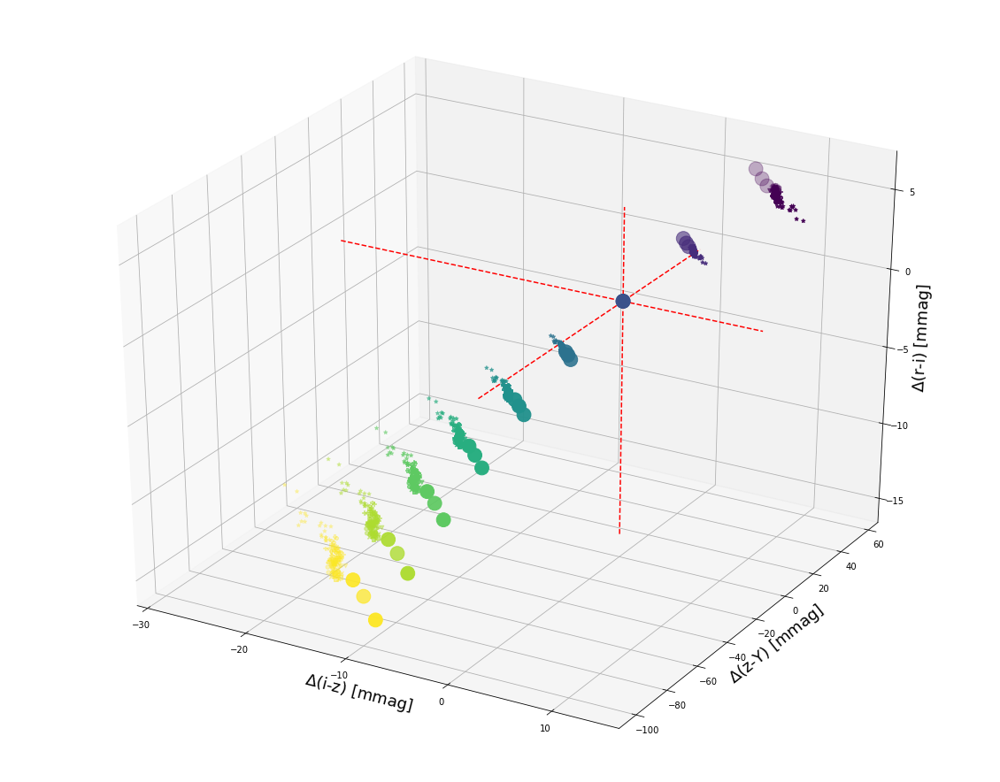

In [158]:
colorx = 'i-z'
colory = 'z-Y'
colorz = 'r-i'

fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(projection='3d')

minx, maxx = [], []
miny, maxy = [], []
minz, maxz = [], []
for spec_type in spectral_types:
    for si in colour_dict[spec_type]:
        delta1 = (colour_dict[spec_type][si][colorx.lower()]-colour_dict_ref[spec_type][si][colorx.lower()])*1000.
        delta2 = (colour_dict[spec_type][si][colory.lower()]-colour_dict_ref[spec_type][si][colory.lower()])*1000.
        delta3 = (colour_dict[spec_type][si][colorz.lower()]-colour_dict_ref[spec_type][si][colorz.lower()])*1000.

        ax.scatter(delta1,delta2,delta3,c=atm_vals,marker=type_markers[spec_type])
        minx.append(np.min(delta1))
        miny.append(np.min(delta2))
        minz.append(np.min(delta3))
        maxx.append(np.max(delta1))
        maxy.append(np.max(delta2))
        maxz.append(np.max(delta3))
        
for sn in sn_colour_dict.keys():
    delta1_sn = (sn_colour_dict[sn][colorx.lower()]-sn_colour_dict_ref[sn][colorx.lower()])*1000.
    delta2_sn = (sn_colour_dict[sn][colory.lower()]-sn_colour_dict_ref[sn][colory.lower()])*1000.
    delta3_sn = (sn_colour_dict[sn][colorz.lower()]-sn_colour_dict_ref[sn][colorz.lower()])*1000.
    
    ax.scatter(delta1_sn,delta2_sn,delta3_sn,c=atm_vals,marker='o',s=250.0)

ax.set_xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
ax.set_ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
ax.set_zlabel(r'$\Delta$'+'('+colorz+') [mmag]',fontsize=18)

xrange = np.linspace(np.min(minx),np.max(maxx),100)
yrange = np.linspace(np.min(miny),np.max(maxy),100)
zrange = np.linspace(np.min(minz),np.max(maxz),100)

ax.plot(xrange,np.zeros(len(yrange)),np.zeros(len(zrange)),'r--')
ax.plot(np.zeros(len(xrange)),yrange,np.zeros(len(zrange)),'r--')
ax.plot(np.zeros(len(xrange)),np.zeros(len(yrange)),zrange,'r--')


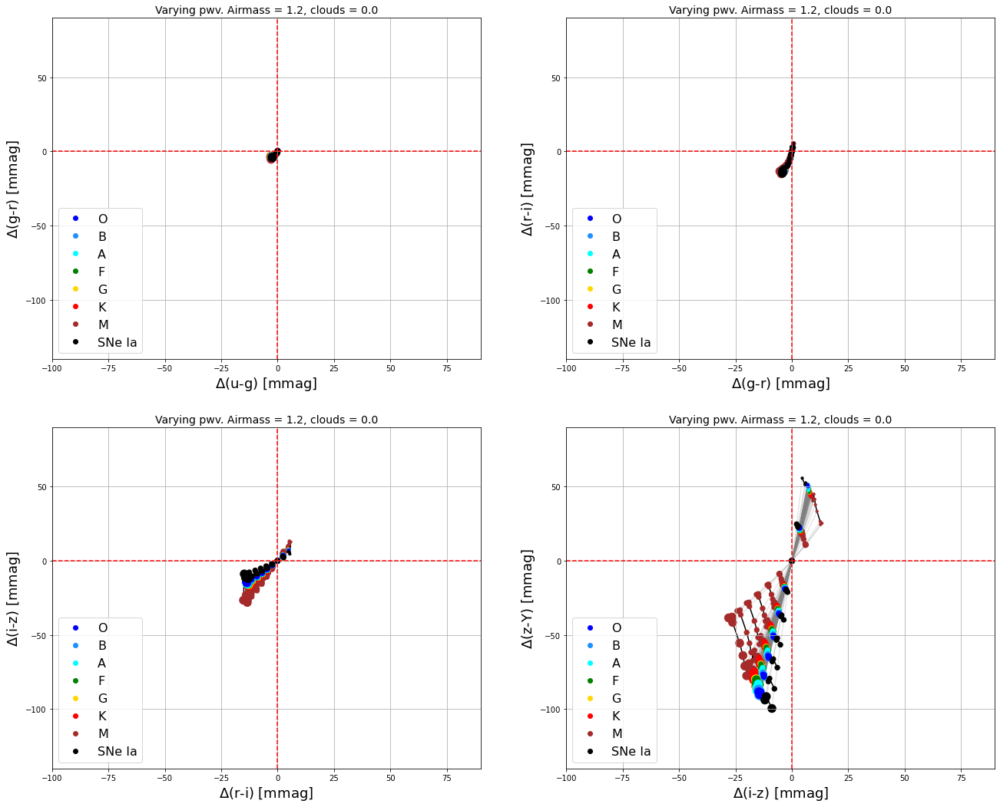

In [159]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(22,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            iso_vals1 = []
            iso_vals2 = []
            for spec_type in spectral_types[::-1]:
                for si in colour_dict[spec_type]:
                    delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    msize = [10.]
                    msize = msize+[40.]*(len(delta1)-2)
                    msize.append(110.)
                    
                    iso_vals1.append(delta1)
                    iso_vals2.append(delta2)
                    
                    axs[row,col].scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0)
                    axs[row,col].plot(delta1,delta2,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
            for spec_type in spectral_types:
                axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
                
                
            for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs[row,col].scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs[row,col].plot(delta1_sn,delta2_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
            axs[row,col].plot([],[],c='k',ls='',marker='o',label='SNe Ia')
            
            iso_vals1 = np.array(iso_vals1)
            iso_vals2 = np.array(iso_vals2)
            for val in range(iso_vals1.shape[1]):
                #print(iso_vals1[:,val])
                sort_index = np.argsort(iso_vals1[:,val])
                axs[row,col].plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            #axs[row,col].set_xlim(-21.,33.)
            axs[row,col].set_xlim(-100,90)
            axs[row,col].set_ylim(-140,90)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=16)
            
            i += 1
plt.savefig(os.path.join(outdir_plots,'colour_colour_plots_varying_{0}_airmass_{1}_clouds_{2}_v2_sn.png'.format(variable_param,am0,cloud0)))

In [160]:
rangex2 = (-40,25)
rangey2 = (-150,90)

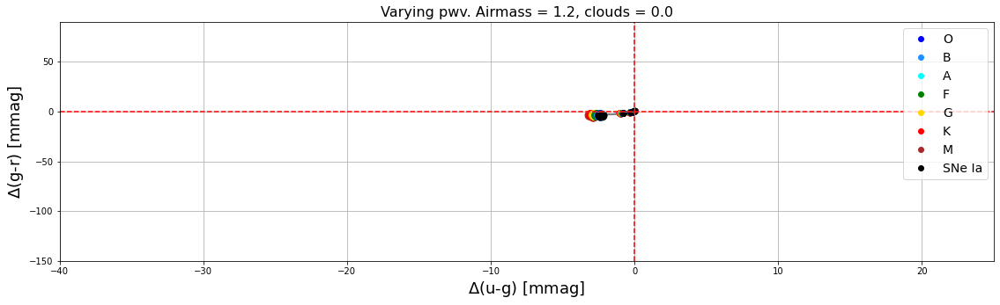

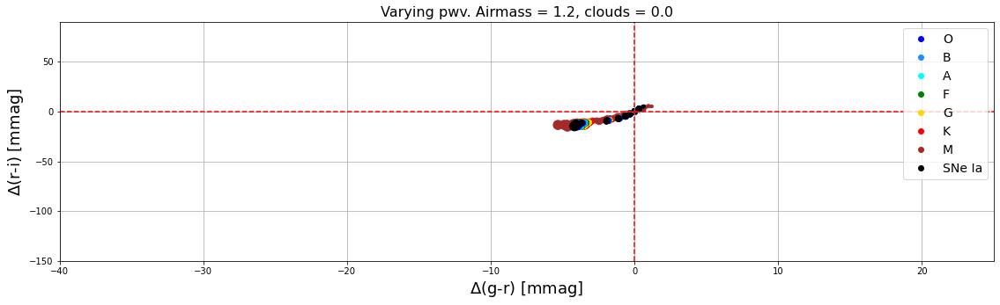

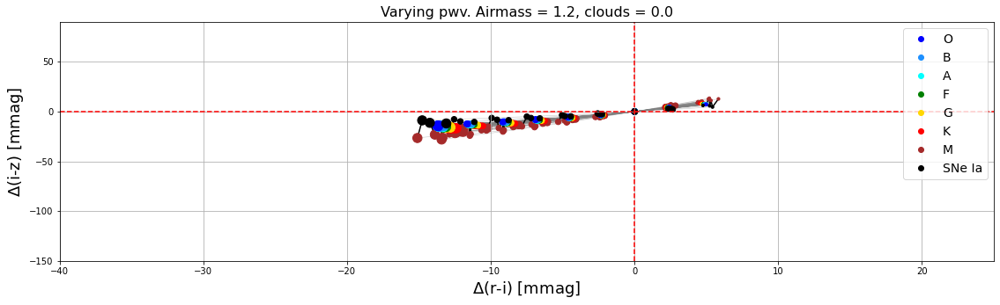

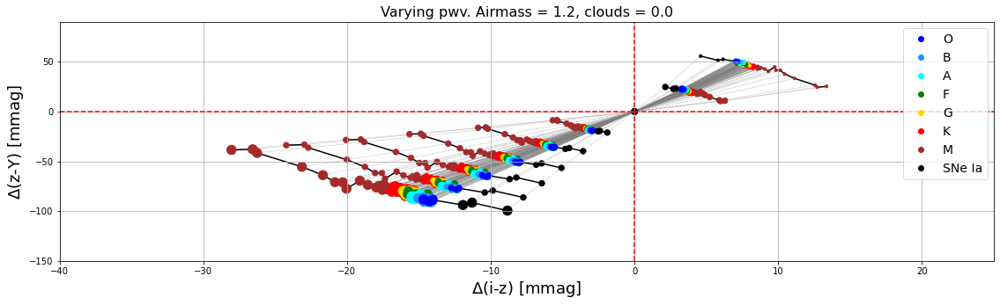

In [161]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(19,5))
    if i<len(filters)-2:
        cx = '{0}-{1}'.format(filters[i],filters[i+1])
        cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangex2)
        axs.set_ylim(rangey2)
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}_sn.png'.format(variable_param,am0,cloud0,cx,cy)))

This is just the same but interchanging the axes 

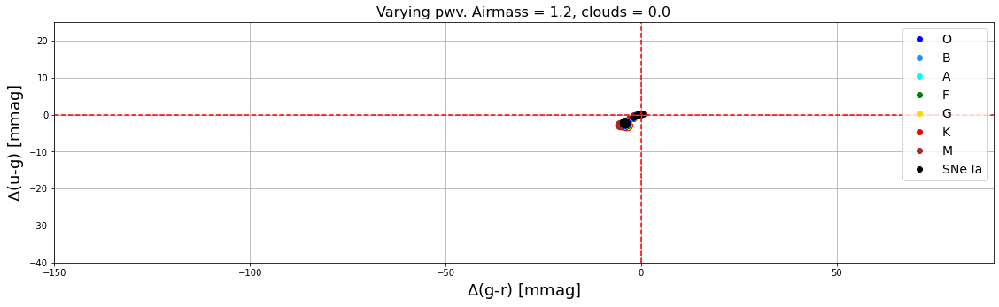

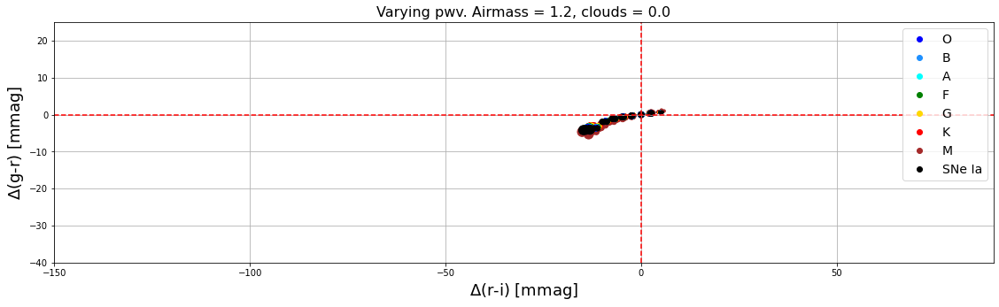

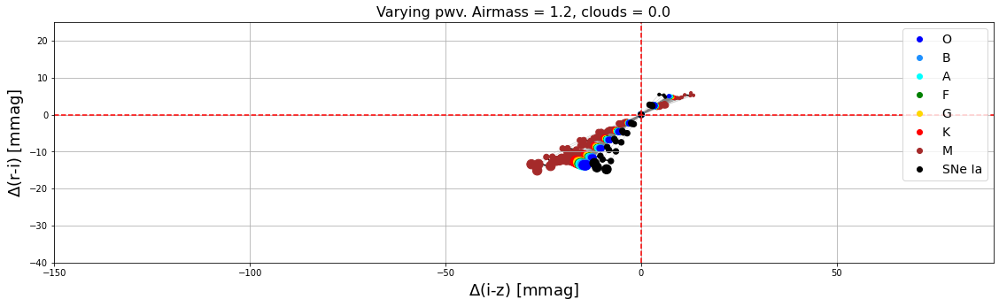

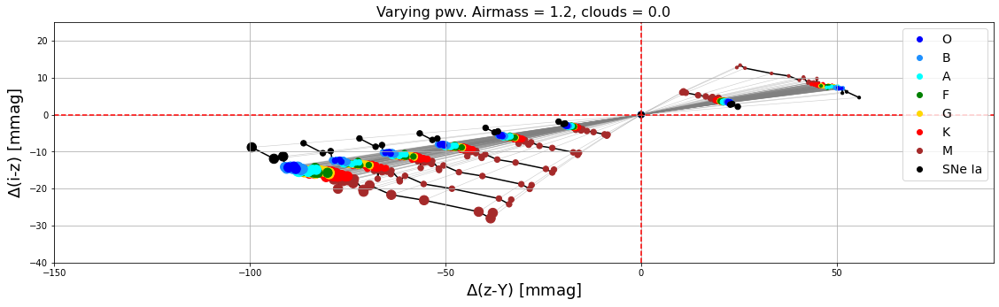

In [162]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(19,5))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])#################
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])#################
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangey2)#################
        axs.set_ylim(rangex2)#################
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}_sn.png'.format(variable_param,am0,cloud0,cx,cy)))

Now we add the evolution of the flat spectrum, for reference 

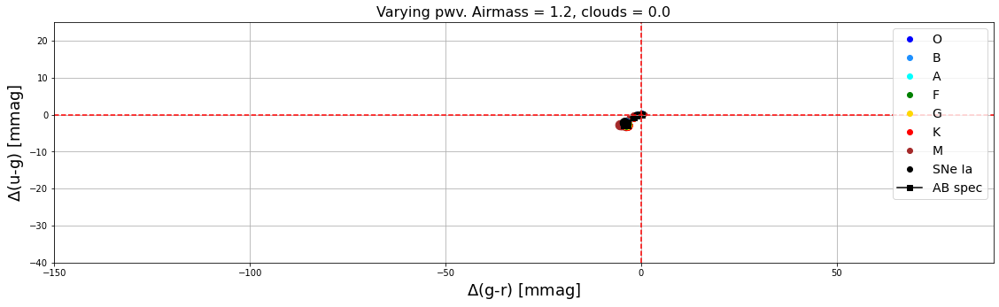

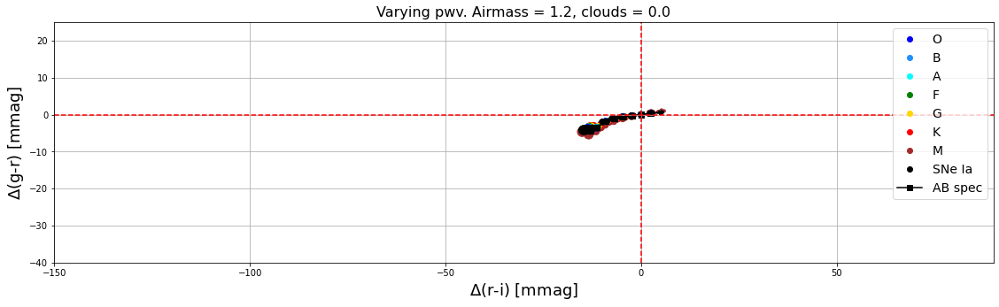

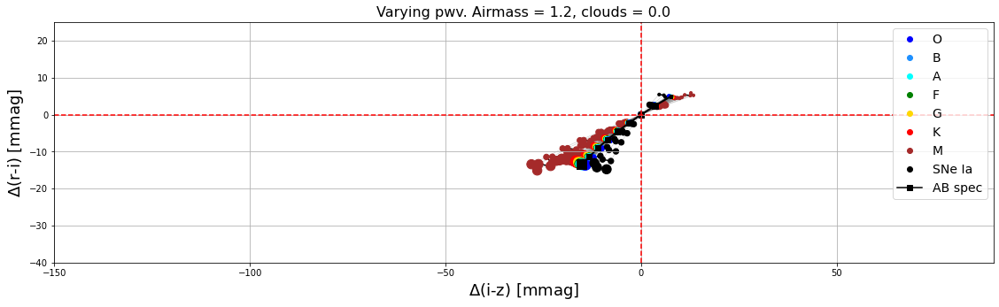

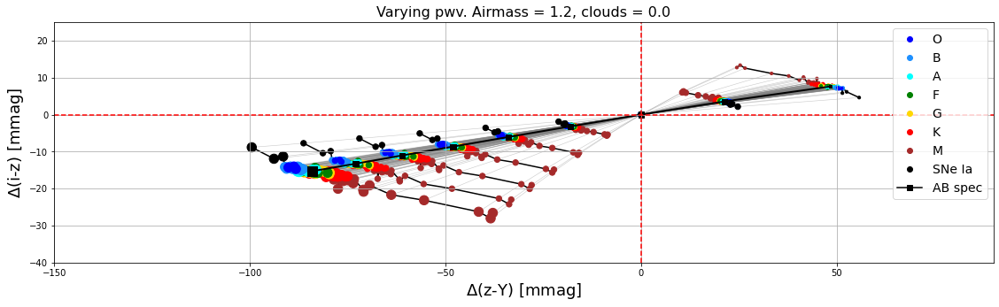

In [163]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(19,5))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])#################
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])#################
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        delta1_flat = (flat_colour_dict[cx.lower()]-flat_colour_dict_ref[cx.lower()])*1000.
        delta2_flat = (flat_colour_dict[cy.lower()]-flat_colour_dict_ref[cy.lower()])*1000.
        axs.scatter(delta1_flat,delta2_flat,c='k',marker='s',s=msize)
        axs.plot(delta1_flat,delta2_flat,ls='-',linewidth=2.0,marker='',color='k',alpha=1.0,zorder=1)
        axs.plot([],[],c='k',ls='-',marker='s',label='AB spec')
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangey2)#################
        axs.set_ylim(rangex2)#################
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}_sn_flat_spectrum.png'.format(variable_param,am0,cloud0,cx,cy)))

# Redshift the SN Ia spectra 

In [164]:
redshifts = np.linspace(0.1,1.0,10)
print(redshifts)

[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]


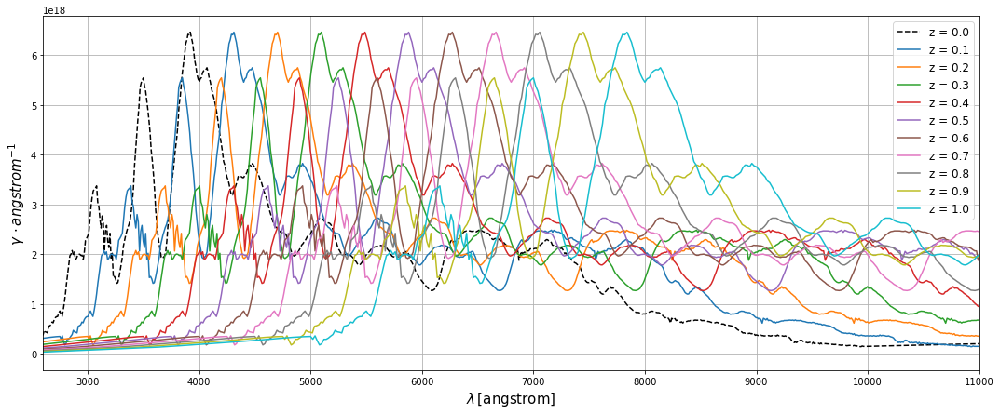

In [165]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
rs_dict = {}
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,label='z = {0:.1f}'.format(redshift))
    rs_dict[round(redshift,1)] = sn1_z
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

Compute fluxes through atm x throughput 

In [166]:
# redshifted SN Ia through atm x throughput 
rs_sn_obs_dict = {}
for key in rs_dict.keys():
    spec = rs_dict[key]
    filter_dict_ = {}
    for filter in filters:
        filter_dict_[filter] = []
        for i in range(n_sim):
            obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
            filter_dict_[filter].append(obs_spec)
    rs_sn_obs_dict[key] = filter_dict_ 


((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [167]:
# redshifted SN Ia only through throughput (as if telescope was in space) 
rs_sn_obs_dict_t = {}
for key in rs_dict.keys():
    spec = rs_dict[key]
    filter_dict_ = {}
    for filter in lsst_bp:
        obs_spec_t = S.Observation(spec,filter,force='taper')
        filter_dict_[filter.name] = obs_spec_t
    rs_sn_obs_dict_t[key] = filter_dict_ 
    

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

Text(0.5, 1.0, 'Varying pwv. Airmass = 1.2, clouds = 0.0')

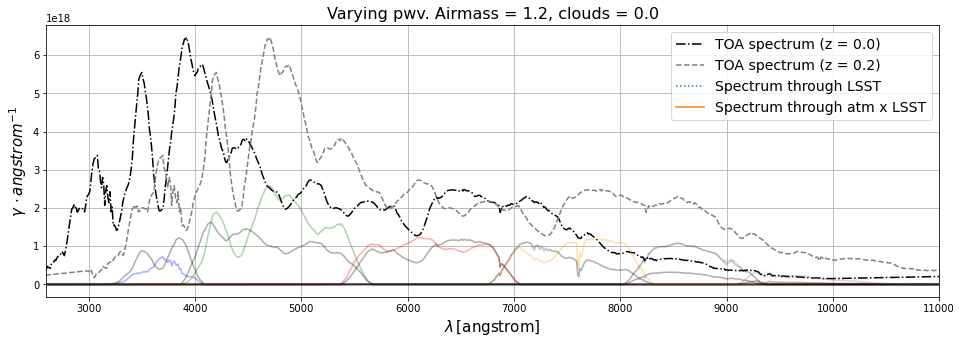

In [168]:
test_rs = 0.2
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='-.',color='k',label='TOA spectrum (z = 0.0)')
plt.plot(rs_dict[test_rs].wave,rs_dict[test_rs].flux*Seff*exptime,ls='--',color='grey',label='TOA spectrum (z = {0})'.format(test_rs))

for index,filter in enumerate(filters):
    #plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color='k')
    #plt.plot(rs_sn_obs_dict_t[test_rs][filter].wave,rs_sn_obs_dict_t[test_rs][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        obs_0 = sn_obs_dict[0][filter][i]
        obs_ = rs_sn_obs_dict[test_rs][filter][i]
        plt.plot(obs_0.wave,obs_0.flux*Seff*exptime,ls='-',color='k',alpha=0.04)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)

Now we calculate the magnitudes and colours 

In [169]:
# Magnitudes of spectra passing through atm x throughput 
rs_sn_mag_dict = {}
rs_sn_mag_dict_ref = {}
for key in rs_dict.keys():
    obs_spec_ = rs_dict[key]
    mag_dict_ = {}
    mag_dict_ref_ = {}
    for fi,filter in enumerate(filters):
        mag_dict_[filter] = []
        for i in range(n_sim):
            #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
            mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
            mag_dict_[filter].append(mag_ab_)
            
        #mag_dict[sed_] = mag_dict_
        
        mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
        mag_dict_ref_[filter] = mag_ab_
    rs_sn_mag_dict[key] = mag_dict_
    rs_sn_mag_dict_ref[key] = mag_dict_ref_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.88e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.247288759292708
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.88e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.247299413302528
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Ob

Numerator = 1.26e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.774787438216563
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.30e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.13909643019499
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.30e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Denominator = 3.09e+12
AB magnitude =  -19.854659185081264
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.70e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.854671926577907
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.70e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.85468732695897
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the

Denominator = 4.55e+12
AB magnitude =  -21.05472035228172
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.20e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.052568929213717
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.20e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.050317232209675
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.446786909227715
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.86e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.44680128055329
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.86e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitud

Numerator = 1.10e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.956325460843395
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.95341550062289
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.09e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 7.67e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -18.488231328288286
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.69e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -18.489981438723056
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.69e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 1.29e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.13157719454304
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.53e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.225267808019215
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.45e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.53e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.673107980343847
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.53e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.673082774805906
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.53e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 8.71e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.127614567270104
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.67e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.122937157138857
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.63e+20
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 1.12e+21
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.33816876108431
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.84e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.65911547279391
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.84e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 5.02e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.209668332702577
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.90e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.183960064707804
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.80e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 2.59e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.56087149096061
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.59e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -21.56046256208413
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.59e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 4.73e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.14525446374623
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.65e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.126531486402513
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.58e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 2.74e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.94701445855143
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.73e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.943961221255076
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.72e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.096801269597957
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.13e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.096816436447327
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.13e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitu

Numerator = 2.68e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.924315919539357
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.67e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.921905318072135
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.67e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Denominator = 3.09e+12
AB magnitude =  -16.911414122691117
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.80e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -16.91326842033328
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.80e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -16.913377981125844
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the

Denominator = 4.55e+12
AB magnitude =  -21.927397298567705
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.85e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.94762977527268
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.84e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.940636815438296
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the

In [170]:
rs_sn_colour_dict = {}
for rs in rs_sn_mag_dict.keys():
    c_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(rs_sn_mag_dict[rs][filters[fi]])
        mag2 = np.array(rs_sn_mag_dict[rs][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
    rs_sn_colour_dict[rs] = c_dict

rs_sn_colour_dict_ref = {}
for rs in rs_sn_mag_dict_ref.keys():
    c_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(rs_sn_mag_dict_ref[rs][filters[fi]])
        mag2 = np.array(rs_sn_mag_dict_ref[rs][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
    rs_sn_colour_dict_ref[rs] = c_dict
    

In [171]:
np.save('output_files/rs_sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),rs_sn_colour_dict)
np.save('output_files/rs_sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),rs_sn_colour_dict_ref)

In [172]:
redshift_colors = {0.1:'b',0.2:'dodgerblue',0.3:'cyan',0.4:'g',0.5:'gold',0.6:'r',0.7:'brown',0.8:'grey',0.9:'darkgrey',1.0:'k'}

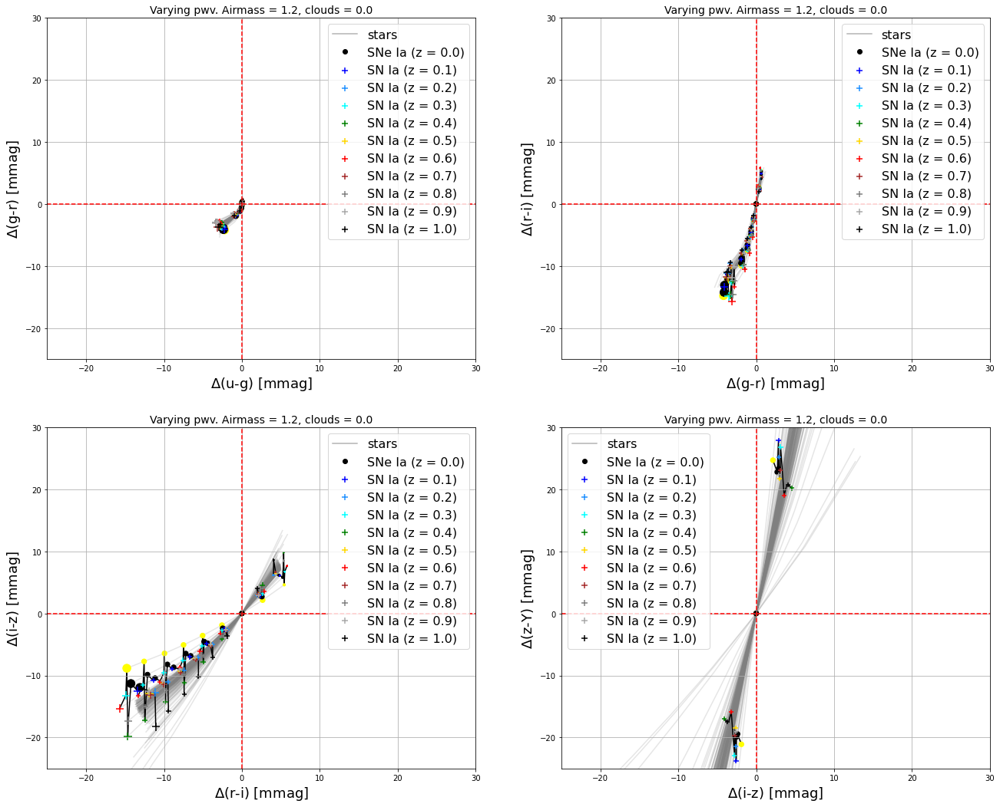

In [173]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(22,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            iso_vals1 = []
            iso_vals2 = []
            
            for spec_type in spectral_types[::-1]:
                for si in colour_dict[spec_type]:
                    delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    msize = [10.]
                    msize = msize+[40.]*(len(delta1)-2)
                    msize.append(110.)
                    
                    #iso_vals1.append(delta1)
                    #iso_vals2.append(delta2)
                    
                    #axs[row,col].scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0)
                    axs[row,col].plot(delta1,delta2,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
                    
            #for spec_type in spectral_types:
            #    axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            axs[row,col].plot([],[],c='grey',ls='-',marker='',alpha=0.6,label='stars')
                    
            for si,sn in enumerate(sn_colour_dict.keys()):
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                if si==0:
                    axs[row,col].scatter(delta1_sn,delta2_sn,c='yellow',marker='o',s=msize)
                else:
                    axs[row,col].scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs[row,col].plot(delta1_sn,delta2_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
            axs[row,col].plot([],[],c='k',ls='',marker='o',label='SNe Ia (z = 0.0)')
            
            for rs in rs_sn_colour_dict.keys():
                delta1_rs_sn = (rs_sn_colour_dict[rs][cx.lower()]-rs_sn_colour_dict_ref[rs][cx.lower()])*1000.
                delta2_rs_sn = (rs_sn_colour_dict[rs][cy.lower()]-rs_sn_colour_dict_ref[rs][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_rs_sn)
                iso_vals2.append(delta2_rs_sn)
                
                axs[row,col].scatter(delta1_rs_sn,delta2_rs_sn,c=redshift_colors[rs],marker='+',s=msize,label='SN Ia (z = {0})'.format(rs))
                axs[row,col].plot(delta1_rs_sn,delta2_rs_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
            
            
            iso_vals1 = np.array(iso_vals1)
            iso_vals2 = np.array(iso_vals2)
            for val in range(iso_vals1.shape[1]):
                #print(iso_vals1[:,val])
                sort_index = np.argsort(iso_vals1[:,val])
                axs[row,col].plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            #axs[row,col].set_xlim(-21.,33.)
            axs[row,col].set_xlim(-25,30)
            axs[row,col].set_ylim(-25,30)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=16)
            
            i += 1

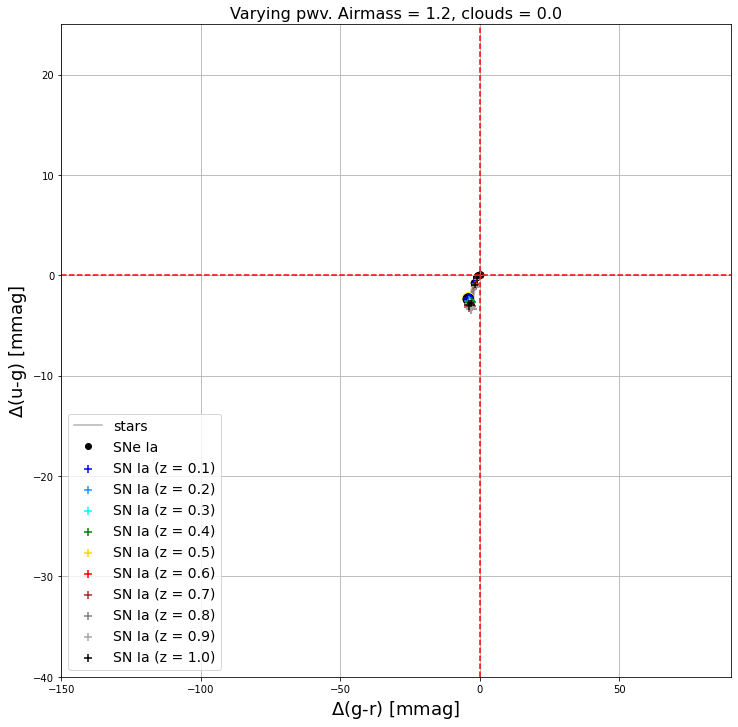

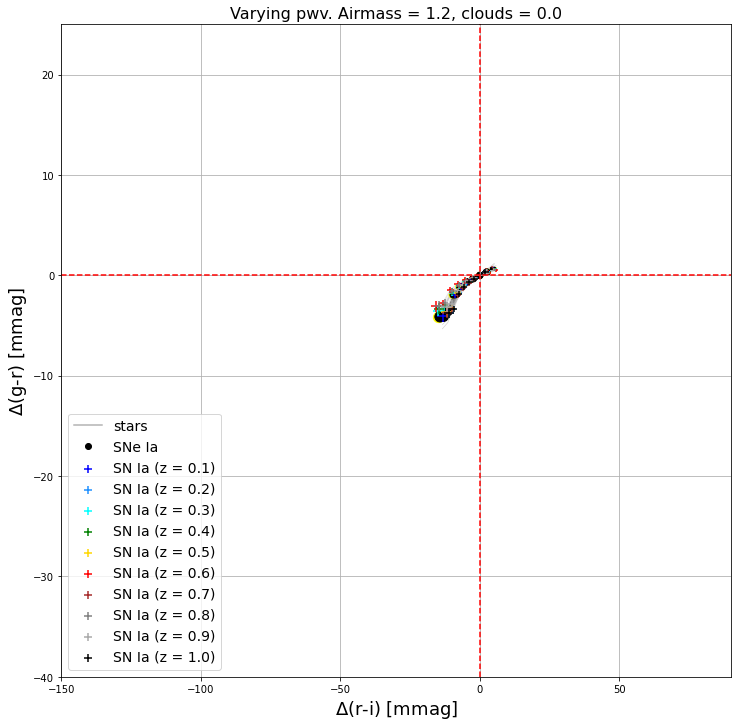

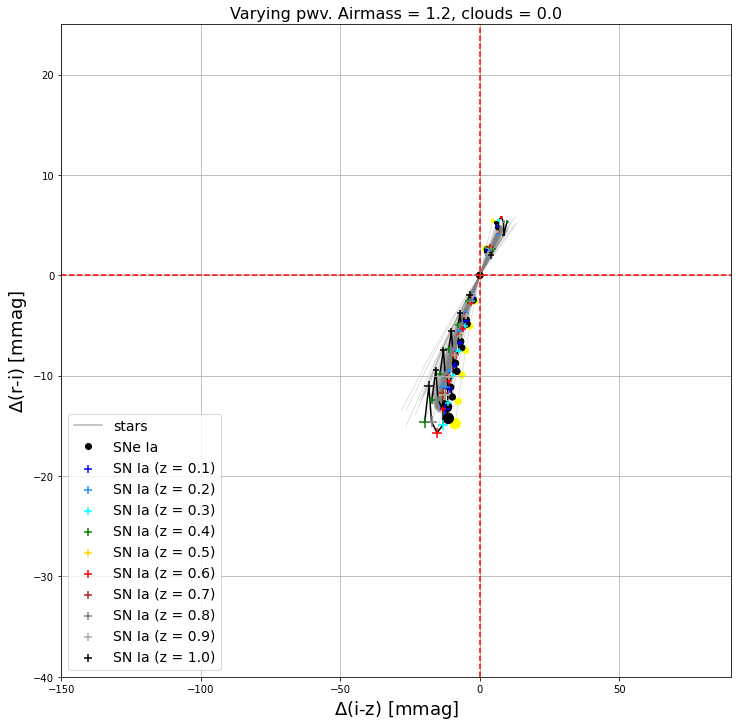

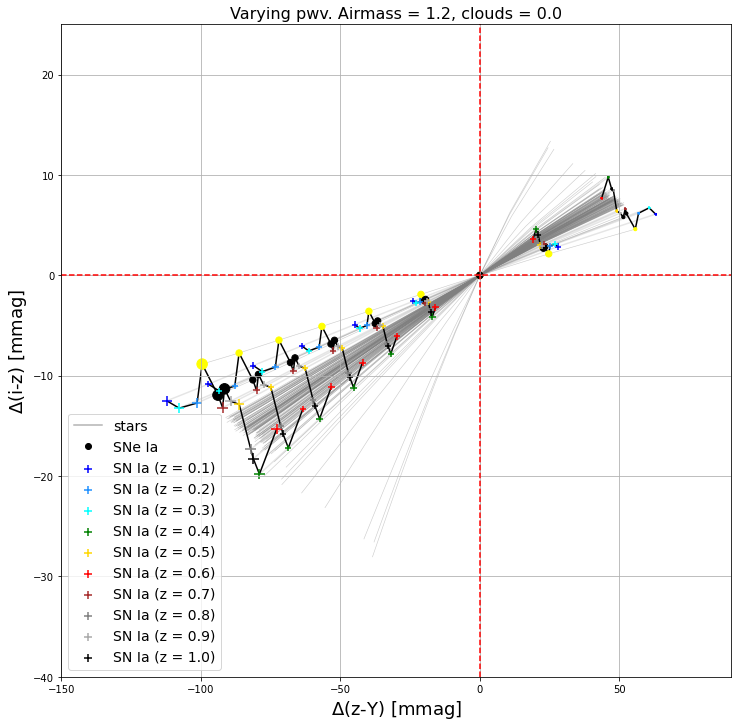

In [174]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(12,12))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                #iso_vals1.append(delta1)
                #iso_vals2.append(delta2)
                    
                #axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
                
        #for spec_type in spectral_types:
        #    axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
        axs.plot([],[],c='grey',ls='-',marker='',alpha=0.6,label='stars')
            
        for si,sn in enumerate(sn_colour_dict.keys()):
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                if si==0:
                    axs.scatter(delta1_sn,delta2_sn,c='yellow',marker='o',s=msize)
                else:
                    axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        for rs in rs_sn_colour_dict.keys():
                delta1_rs_sn = (rs_sn_colour_dict[rs][cx.lower()]-rs_sn_colour_dict_ref[rs][cx.lower()])*1000.
                delta2_rs_sn = (rs_sn_colour_dict[rs][cy.lower()]-rs_sn_colour_dict_ref[rs][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_rs_sn)
                iso_vals2.append(delta2_rs_sn)
                
                axs.scatter(delta1_rs_sn,delta2_rs_sn,c=redshift_colors[rs],marker='+',s=msize,label='SN Ia (z = {0})'.format(rs))
                axs.plot(delta1_rs_sn,delta2_rs_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangey2)
        axs.set_ylim(rangex2)
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        i += 1